In [1]:
!pip install geopandas

     |████████████████████████████████| 994 kB 5.5 MB/s eta 0:00:01
     |████████████████████████████████| 6.5 MB 25.3 MB/s eta 0:00:01
     |████████████████████████████████| 1.0 MB 38.0 MB/s eta 0:00:01
     |████████████████████████████████| 15.3 MB 28.2 MB/s eta 0:00:01    |███████▏                        | 3.4 MB 28.2 MB/s eta 0:00:01
You should consider upgrading via the '/usr/bin/python -m pip install --upgrade pip' command.


In [132]:
import collections
from datetime import datetime
import os
import random

import geopandas
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
from scipy.signal import decimate, savgol_filter, spectrogram
import seaborn as sns
from sklearn import model_selection
from sklearn.preprocessing import LabelEncoder


In [3]:
df_orig = pd.read_csv('kaggle_survey_2020_responses.csv', dtype=str)
df = df_orig.copy()
df = df.iloc[1:, :]
df.fillna(value='No response', inplace=True)

In [133]:
df.head()

,Time from Start to Finish (seconds),Q1,Q2,Q3,Q4,Q5,Q6,Q7_Part_1,Q7_Part_2,Q7_Part_3,...,Q35_B_Part_5,Q35_B_Part_6,Q35_B_Part_7,Q35_B_Part_8,Q35_B_Part_9,Q35_B_Part_10,Q35_B_OTHER,no_of_langs,no_of_ml_libs,no_of_ml_methods
1,1838,35-39,Man,Colombia,Doctoral degree,Student,5-10 years,Python,R,SQL,...,TensorBoard,No response,No response,No response,No response,No response,No response,7,3,6
2,289287,30-34,Man,United States of America,Master’s degree,Data Engineer,5-10 years,Python,R,SQL,...,No response,No response,No response,No response,No response,No response,No response,3,4,3
3,860,35-39,Man,Argentina,Bachelor’s degree,Software Engineer,10-20 years,No response,No response,No response,...,No response,No response,No response,No response,No response,None,No response,3,0,0
4,507,30-34,Man,United States of America,Master’s degree,Data Scientist,5-10 years,Python,No response,SQL,...,No response,No response,No response,No response,No response,No response,No response,3,4,5
5,78,30-34,Man,Japan,Master’s degree,Software Engineer,3-5 years,Python,No response,No response,...,No response,No response,No response,No response,No response,No response,No response,1,0,0


# Demographics (Q1 - Q6)

In [5]:
age = df.iloc[:,1]
gender = df.iloc[:, 2]
countries = df.iloc[:, 3]
educ =  df.iloc[:, 4]
job =  df.iloc[:, 5]
exp_coding =  df.iloc[:, 6]
exp_ML = df['Q15']

In [6]:
sns.set_theme(context='notebook', font_scale=1.6, style='whitegrid', palette='tab10')

In [30]:
def gradientbars(bars):
    grad = np.atleast_2d(np.linspace(0,1,256)).T
    ax = bars[0].axes
    lim = ax.get_xlim()+ax.get_ylim()
    for bar in bars:
        bar.set_zorder(1)
        bar.set_facecolor("none")
        x,y = bar.get_xy()
        w, h = bar.get_width(), bar.get_height()
        ax.imshow(grad, extent=[x,x+w,y,y+h], aspect="auto", zorder=0)
    ax.axis(lim)


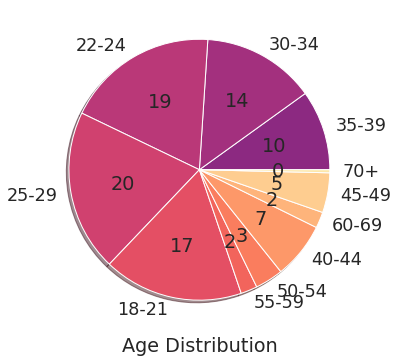

In [8]:
sr = pd.Series(collections.Counter(age))

fig = plt.figure(figsize=(12,6))
_ = plt.pie(
    sr / sr.sum(), 
    labels=sr.index,
    shadow=True,
    autopct='%0.0f',
    colors=plt.cm.magma(np.linspace(0.4,0.95,len(sr)))
)
_ = plt.xlabel('Age Distribution')

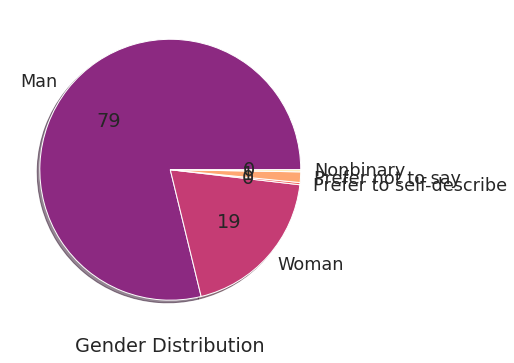

In [9]:
sr = pd.Series(collections.Counter(gender))

fig = plt.figure(figsize=(12,6))
_ = plt.pie(
    sr / sr.sum(), 
    labels=sr.index,
    shadow=True,
    autopct='%0.0f',
    normalize=True,
    colors=plt.cm.magma(np.linspace(0.4,0.95,len(sr)))
)
_ = plt.xlabel('Gender Distribution')

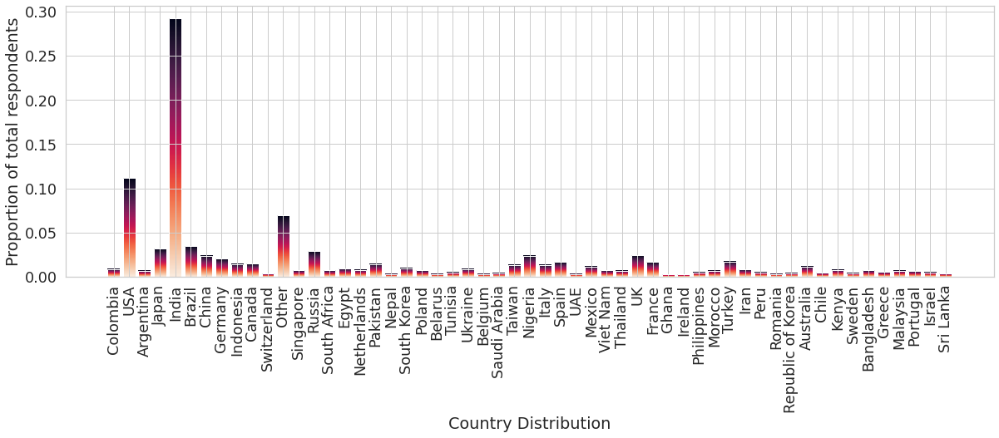

In [31]:
to_replace = {
    'United Kingdom of Great Britain and Northern Ireland': 'UK',
    'Iran, Islamic Republic of...': 'Iran',
    'United States of America': 'USA',
    'United Arab Emirates':'UAE'
}

sr = pd.Series(collections.Counter(countries.replace(to_replace)))

fig = plt.figure(figsize=(20,6))
bar = plt.bar(sr.index, sr / sr.sum(), )
gradientbars(bar)

_ = plt.xticks(rotation=90)
_ = plt.xlabel('Country Distribution')
_ = plt.ylabel('Proportion of total respondents')

<AxesSubplot:>

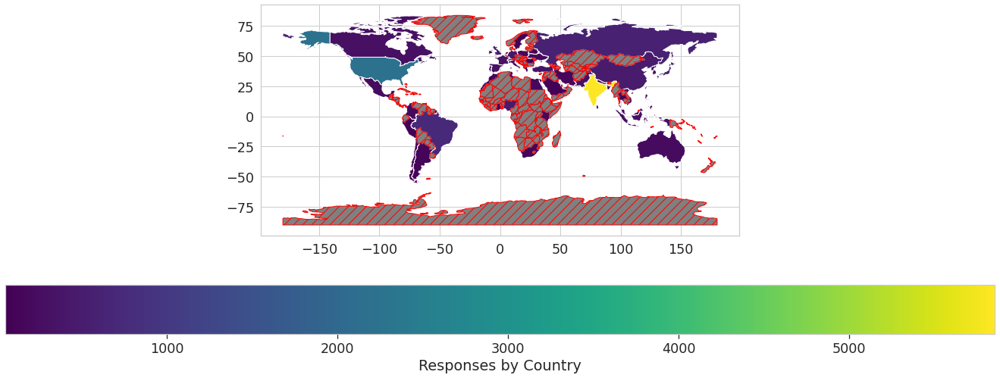

In [58]:
to_replace = {
    'United Kingdom of Great Britain and Northern Ireland': 'United Kingdom',
    'Iran, Islamic Republic of...': 'Iran',
    'Republic of Korea': 'North Korea',
    'Viet Nam': 'Vietnam'
}
dd = collections.Counter(countries.replace(to_replace))
df_countries = pd.DataFrame(list(dd.items()), columns=['country', 'responses'])

#df_countries.columns = ['country', 'responses']
#df_countries = pd.drop(df_countries.country=='Other', axis=1)

world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))

merged = world.merge(df_countries, left_on='name', right_on='country', how='left')
#merged.fillna('No data', inplace = True)
merged.plot(figsize=(30,8), column='responses', legend=True, cmap='viridis',
            legend_kwds={'label': "Responses by Country", 'orientation': "horizontal"},
            missing_kwds={"color": "grey", "edgecolor": "red", "hatch": "//", "label": "Missing values"}
            )

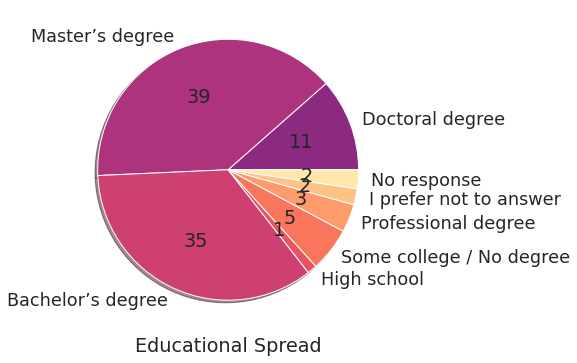

In [10]:
to_replace = {
    'No formal education past high school': 'High school',
    'Some college/university study without earning a bachelor’s degree': 'Some college / No degree',
}

sr = pd.Series(collections.Counter(educ.replace(to_replace)))

fig = plt.figure(figsize=(12,6))
_ = plt.pie(
    sr / sr.sum(), 
    labels=sr.index,
    shadow=True,
    autopct='%0.0f',
    normalize=True,
    colors=plt.cm.magma(np.linspace(0.4,0.95,len(sr)))
)
_ = plt.xlabel('Educational Spread')

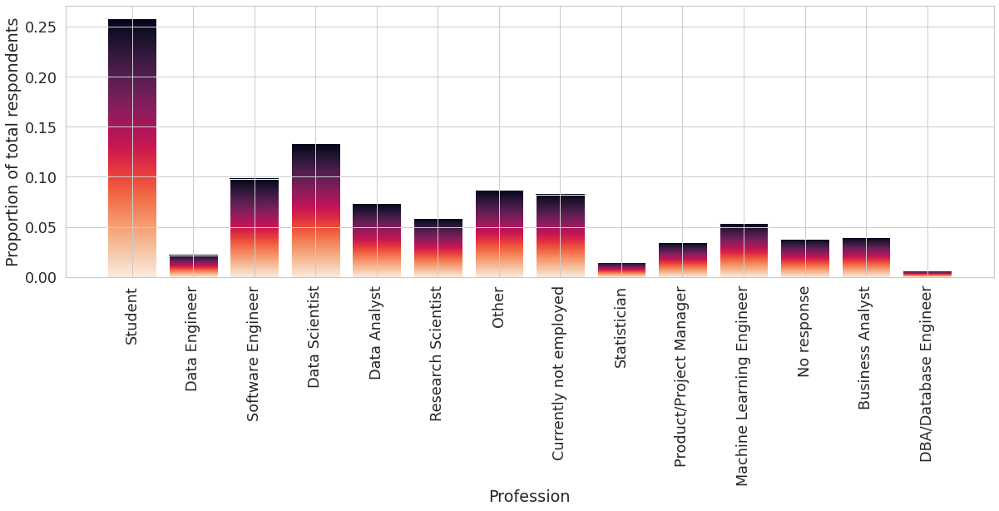

In [32]:
sr = pd.Series(collections.Counter(job))

fig = plt.figure(figsize=(20,6))
bar = plt.bar(sr.index, sr / sr.sum(), )
gradientbars(bar)
_ = plt.xticks(rotation=90)
_ = plt.xlabel('Profession')
_ = plt.ylabel('Proportion of total respondents')

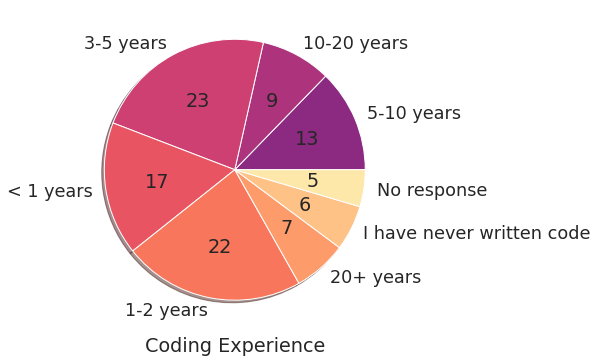

In [11]:
sr = pd.Series(collections.Counter(exp_coding))

fig = plt.figure(figsize=(12,6))
_ = plt.pie(
    sr / sr.sum(), 
    labels=sr.index,
    shadow=True,
    autopct='%0.0f',
    colors=plt.cm.magma(np.linspace(0.4,0.95,len(sr)))
)
_ = plt.xlabel('Coding Experience')

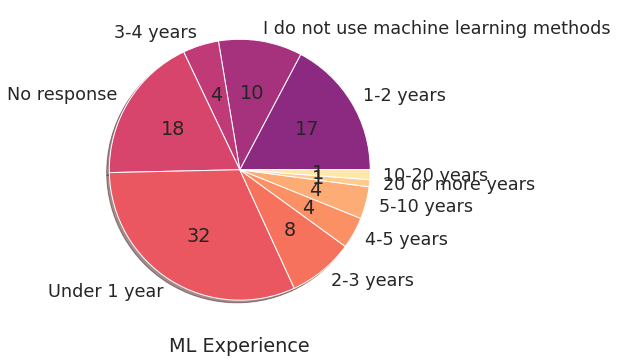

In [12]:
sr = pd.Series(collections.Counter(exp_ML))

fig = plt.figure(figsize=(12,6))
_ = plt.pie(
    sr / sr.sum(), 
    labels=sr.index,
    shadow=True,
    autopct='%0.0f',
    normalize=True,
    colors=plt.cm.magma(np.linspace(0.4,0.95,len(sr)))
)
_ = plt.xlabel('ML Experience')

In [17]:
def aggregate_one_hot(df, string):
    subset = [x for x in df.columns if x.startswith(string)]
    counts_dict = {}
    for col in subset:
        counts_dict.update(collections.Counter(df[col]))

    del[counts_dict['No response']]
    counts_dict = {k.strip().split('(')[0]: v for k, v in counts_dict.items()}
    counts = pd.Series(counts_dict) / df.shape[0]
    return counts

In [18]:
ML_veterans = df.loc[(df['Q15'] == '5-10 years') | (df['Q15'] == '10-20 years') | (df['Q15'] == '20 or more years')]
ML_novices = df.loc[(df['Q15'] == 'Under 1 year') | (df['Q15'] == '1-2 years')]

In [19]:
large_org = df.loc[df['Q20'] == '10,000 or more employees']
small_org = df.loc[df['Q20'] == '0-49 employees']

In [20]:
usa = df.loc[df['Q3'] == 'United States of America']
india = df.loc[df['Q3'] == 'India']

# Popularity of Programming Languages (Q7, Q8)

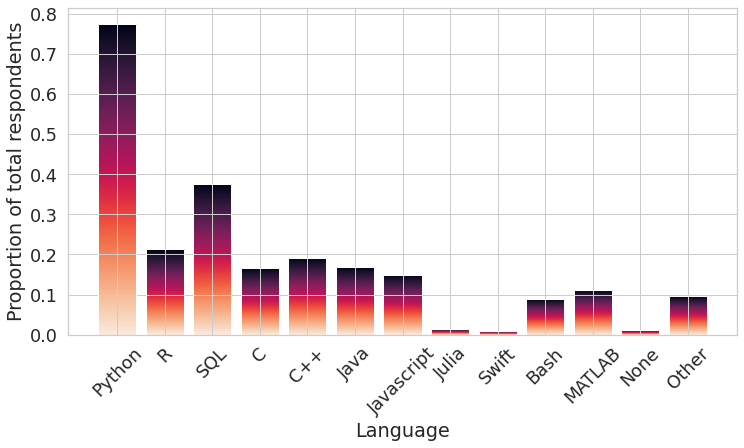

In [33]:
lang = aggregate_one_hot(df,'Q7')

fig=plt.figure(figsize=(12,6))
bar = plt.bar(lang.index, lang.values)
gradientbars(bar)
_ = plt.xticks(rotation=45)
_ = plt.xlabel('Language')
_ = plt.ylabel('Proportion of total respondents')

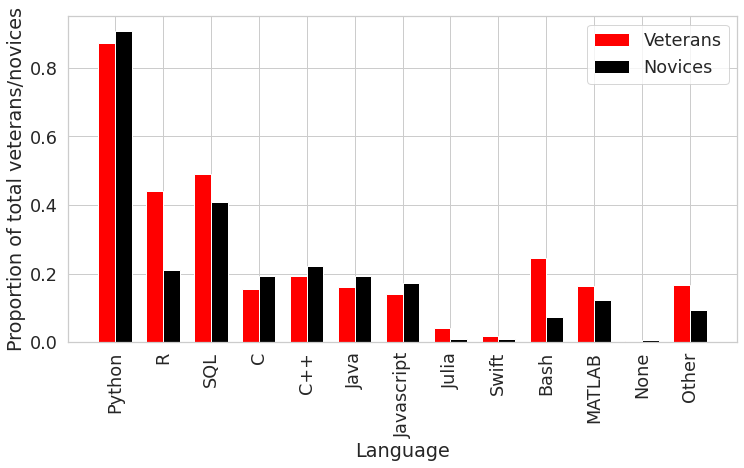

In [69]:
ML_veterans_lang = aggregate_one_hot(ML_veterans, 'Q7')
ML_novices_lang = aggregate_one_hot(ML_novices, 'Q7')

lang_df = pd.concat([ML_veterans_lang.to_frame('Veterans'), ML_novices_lang.to_frame('Novices')], axis=1)

labels = lang_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, lang_df['Veterans'].values, width, label='Veterans', color='r')
rects2 = ax.bar(x + width/2, lang_df['Novices'].values, width, label='Novices', color='k')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Language')
_ = plt.ylabel('Proportion of total veterans/novices')

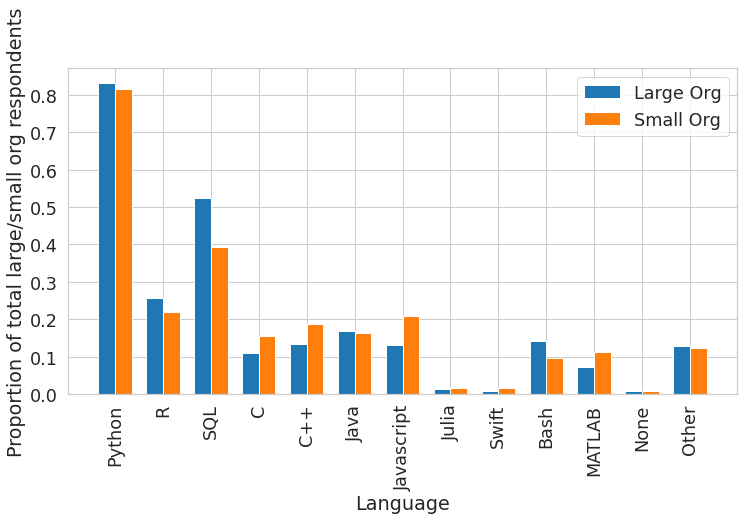

In [114]:
large_org_lang = aggregate_one_hot(large_org, 'Q7')
small_org_lang = aggregate_one_hot(small_org, 'Q7')

lang_df = pd.concat([large_org_lang.to_frame('Large Org'), small_org_lang.to_frame('Small Org')], axis=1)

labels = lang_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, lang_df['Large Org'].values, width, label='Large Org')
rects2 = ax.bar(x + width/2, lang_df['Small Org'].values, width, label='Small Org')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Language')
_ = plt.ylabel('Proportion of total large/small org respondents')

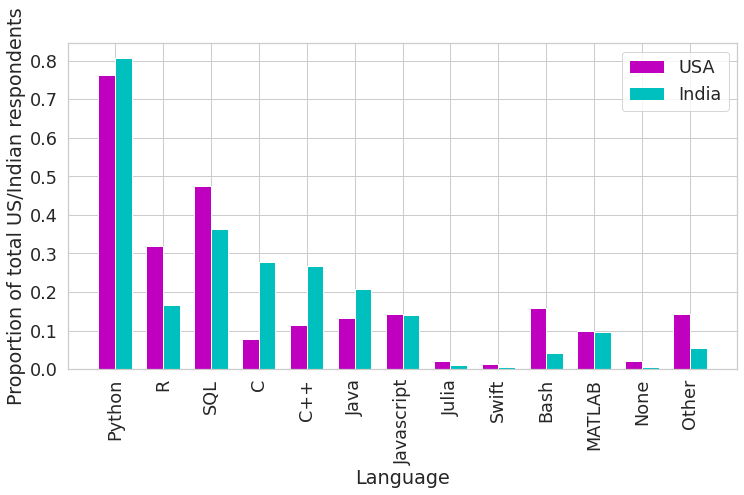

In [70]:
usa_lang = aggregate_one_hot(usa, 'Q7')
india_lang = aggregate_one_hot(india, 'Q7')

lang_df = pd.concat([usa_lang.to_frame('USA'), india_lang.to_frame('India')], axis=1)

labels = lang_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, lang_df['USA'].values, width, label='USA', color='m')
rects2 = ax.bar(x + width/2, lang_df['India'].values, width, label='India', color='c')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Language')
_ = plt.ylabel('Proportion of total US/Indian respondents')

In [35]:
def aggregate_count(x):
    return len([p for p in x if p != 'No response'])

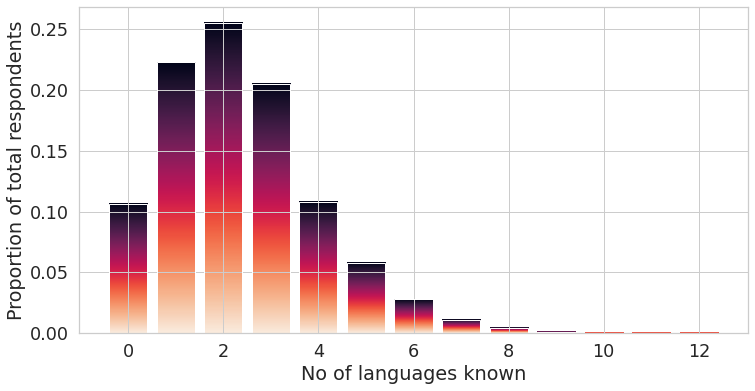

In [36]:
no_of_langs_known = pd.Series(collections.Counter(df[[x for x in df.columns if x.startswith('Q7')]].apply(aggregate_count, axis=1))).sort_index()
df['no_of_langs'] = df[[x for x in df.columns if x.startswith('Q7')]].apply(aggregate_count, axis=1) 

fig=plt.figure(figsize=(12,6))
bar = plt.bar(no_of_langs_known.index, no_of_langs_known.values / df.shape[0])
gradientbars(bar)
_ = plt.xlabel('No of languages known')
_ = plt.ylabel('Proportion of total respondents')


# Preferred IDE or hosted notebook (Q9 - Q10)

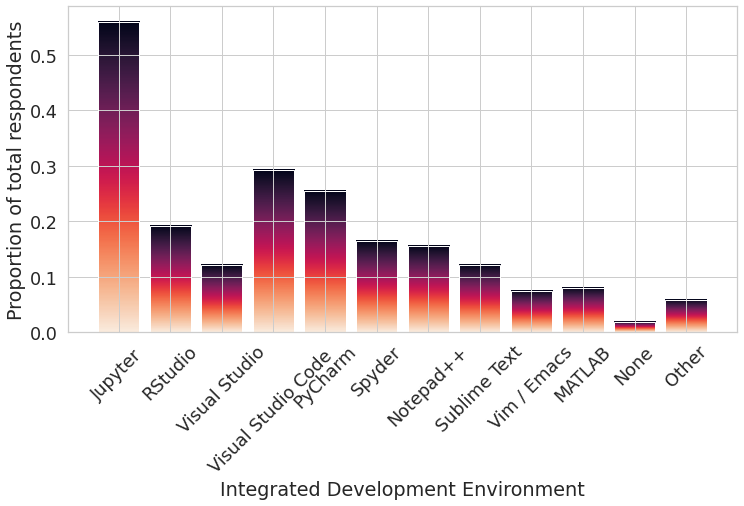

In [37]:
ide = aggregate_one_hot(df,'Q9')

fig=plt.figure(figsize=(12,6))
bar = plt.bar(ide.index, ide.values)
gradientbars(bar)
_ = plt.xticks(rotation=45)
_ = plt.xlabel('Integrated Development Environment')
_ = plt.ylabel('Proportion of total respondents')

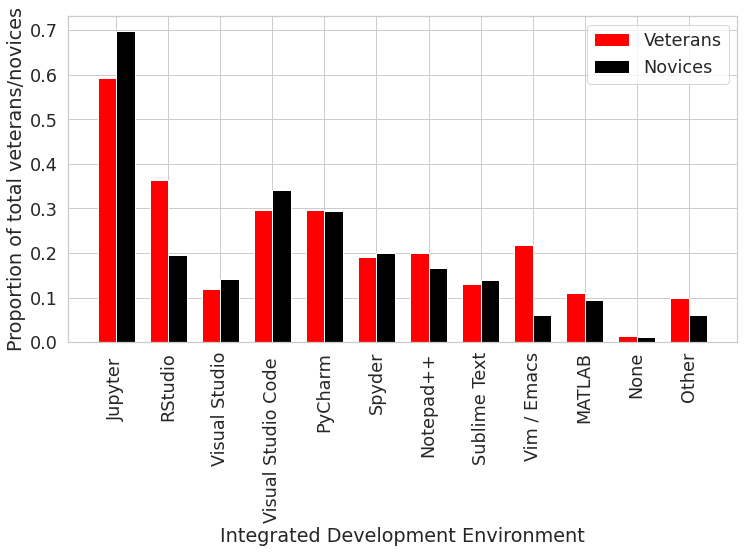

In [71]:
ML_veterans_ide = aggregate_one_hot(ML_veterans, 'Q9')
ML_novices_ide = aggregate_one_hot(ML_novices, 'Q9')

ide_df = pd.concat([ML_veterans_ide.to_frame('Veterans'), ML_novices_ide.to_frame('Novices')], axis=1)

labels = ide_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, ide_df['Veterans'].values, width, label='Veterans', color='r')
rects2 = ax.bar(x + width/2, ide_df['Novices'].values, width, label='Novices', color='k')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Integrated Development Environment')
_ = plt.ylabel('Proportion of total veterans/novices')

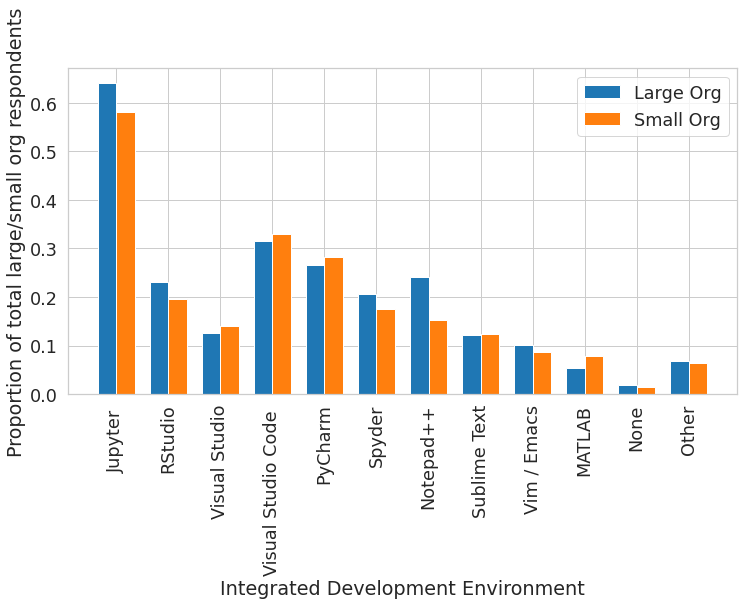

In [117]:
large_org_ide = aggregate_one_hot(large_org, 'Q9')
small_org_ide = aggregate_one_hot(small_org, 'Q9')

ide_df = pd.concat([large_org_ide.to_frame('Large Org'), small_org_ide.to_frame('Small Org')], axis=1)

labels = ide_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, ide_df['Large Org'].values, width, label='Large Org')
rects2 = ax.bar(x + width/2, ide_df['Small Org'].values, width, label='Small Org')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Integrated Development Environment')
_ = plt.ylabel('Proportion of total large/small org respondents')

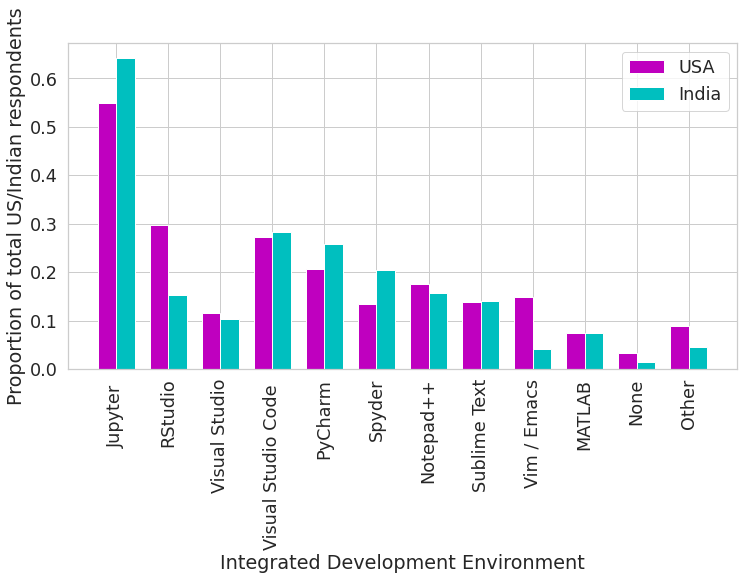

In [72]:
usa_ide= aggregate_one_hot(usa, 'Q9')
india_ide = aggregate_one_hot(india, 'Q9')

ide_df = pd.concat([usa_ide.to_frame('USA'), india_ide.to_frame('India')], axis=1)

labels = ide_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, ide_df['USA'].values, width, label='USA', color='m')
rects2 = ax.bar(x + width/2, ide_df['India'].values, width, label='India', color='c')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Integrated Development Environment')
_ = plt.ylabel('Proportion of total US/Indian respondents')

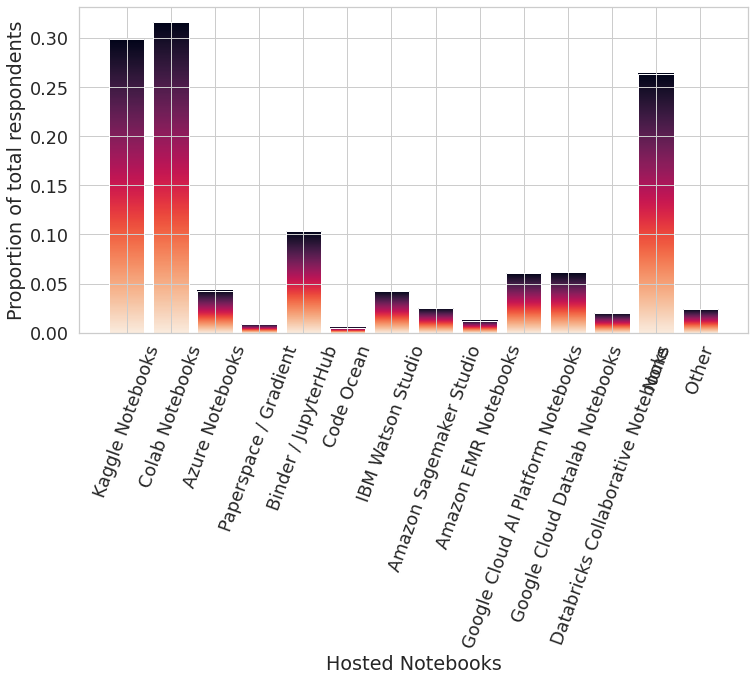

In [38]:
nb = aggregate_one_hot(df, 'Q10')

fig=plt.figure(figsize=(12,6))
bar = plt.bar(nb.index, nb.values)
gradientbars(bar)
_ = plt.xticks(rotation=70)
_ = plt.xlabel('Hosted Notebooks')
_ = plt.ylabel('Proportion of total respondents')

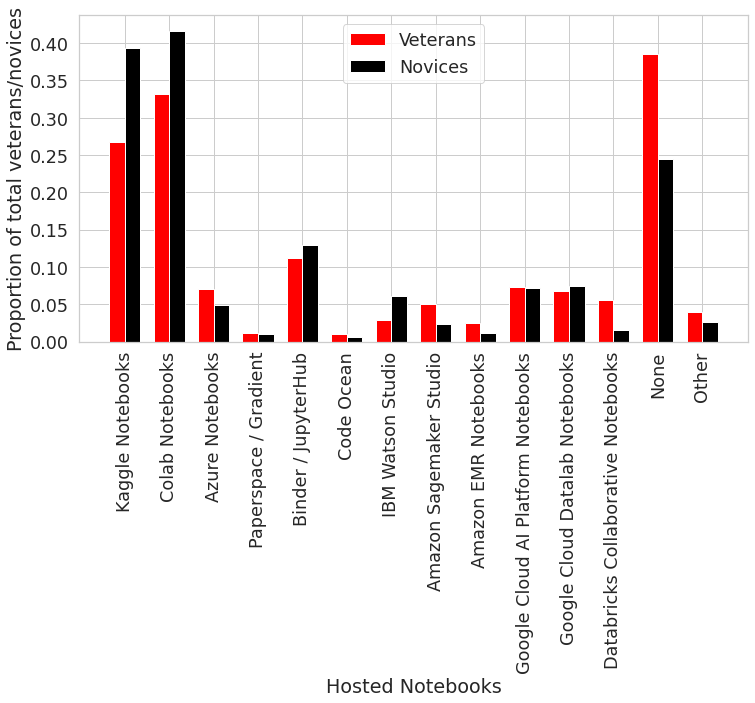

In [73]:
ML_veterans_nb = aggregate_one_hot(ML_veterans, 'Q10')
ML_novices_nb = aggregate_one_hot(ML_novices, 'Q10')

nb_df = pd.concat([ML_veterans_nb.to_frame('Veterans'), ML_novices_nb.to_frame('Novices')], axis=1)

labels = nb_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, nb_df['Veterans'].values, width, label='Veterans', color='r')
rects2 = ax.bar(x + width/2, nb_df['Novices'].values, width, label='Novices', color='k')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Hosted Notebooks')
_ = plt.ylabel('Proportion of total veterans/novices')

# Computing resources (Q11 - Q13)

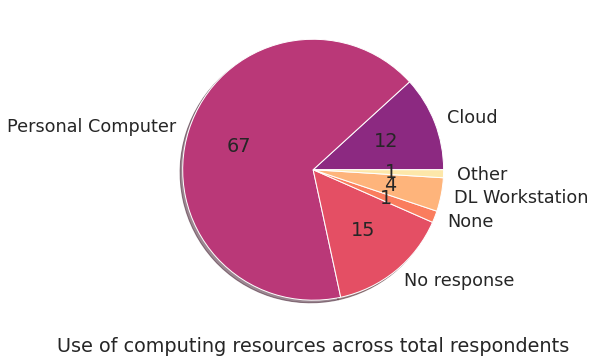

In [13]:
comp_resources = df['Q11']

to_replace = {
    'A cloud computing platform (AWS, Azure, GCP, hosted notebooks, etc)': 'Cloud',
    'A personal computer or laptop': 'Personal Computer',
    'A deep learning workstation (NVIDIA GTX, LambdaLabs, etc)': 'DL Workstation',
}

sr = pd.Series(collections.Counter(comp_resources.replace(to_replace)))

fig = plt.figure(figsize=(12,6))
_ = plt.pie(
    sr / sr.sum(), 
    labels=[x.split('(')[0] for x in sr.index],
    shadow=True,
    autopct='%0.0f',
    colors=plt.cm.magma(np.linspace(0.4,0.95,len(sr)))
)
_ = plt.xlabel('Use of computing resources across total respondents')

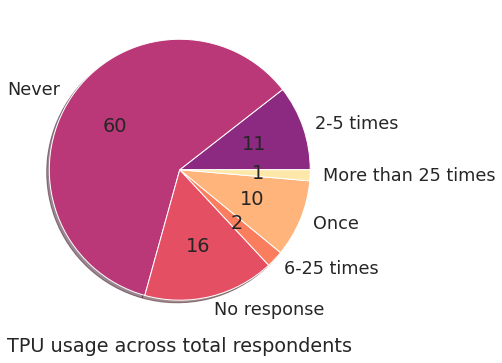

In [14]:
tpu_usage = df['Q13']

sr = pd.Series(collections.Counter(tpu_usage))

fig = plt.figure(figsize=(12,6))
_ = plt.pie(
    sr / sr.sum(), 
    labels=sr.index,
    shadow=True,
    autopct='%0.0f',
    colors=plt.cm.magma(np.linspace(0.4,0.95,len(sr)))
)
_ = plt.xlabel('TPU usage across total respondents')

# Data visualization packages (Q14)

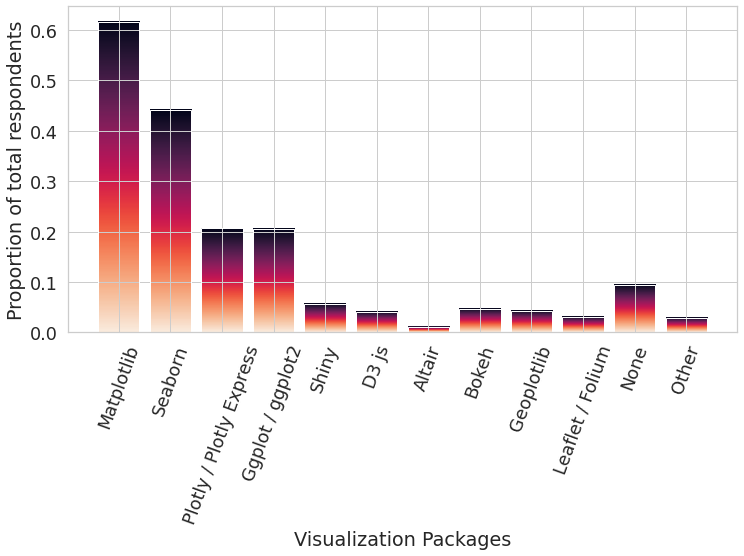

In [39]:
vis = aggregate_one_hot(df, 'Q14')

fig=plt.figure(figsize=(12,6))
bar = plt.bar(vis.index, vis.values)
gradientbars(bar)
_ = plt.xticks(rotation=70)
_ = plt.xlabel('Visualization Packages')
_ = plt.ylabel('Proportion of total respondents')

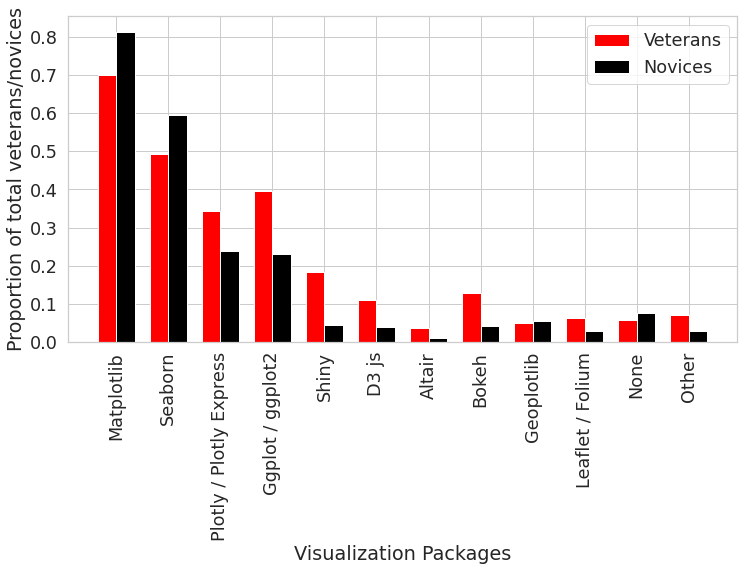

In [74]:
ML_veterans_vis = aggregate_one_hot(ML_veterans, 'Q14')
ML_novices_vis = aggregate_one_hot(ML_novices, 'Q14')

vis_df = pd.concat([ML_veterans_vis.to_frame('Veterans'), ML_novices_vis.to_frame('Novices')], axis=1)

labels = vis_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, vis_df['Veterans'].values, width, label='Veterans', color='r')
rects2 = ax.bar(x + width/2, vis_df['Novices'].values, width, label='Novices', color='k')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Visualization Packages')
_ = plt.ylabel('Proportion of total veterans/novices')

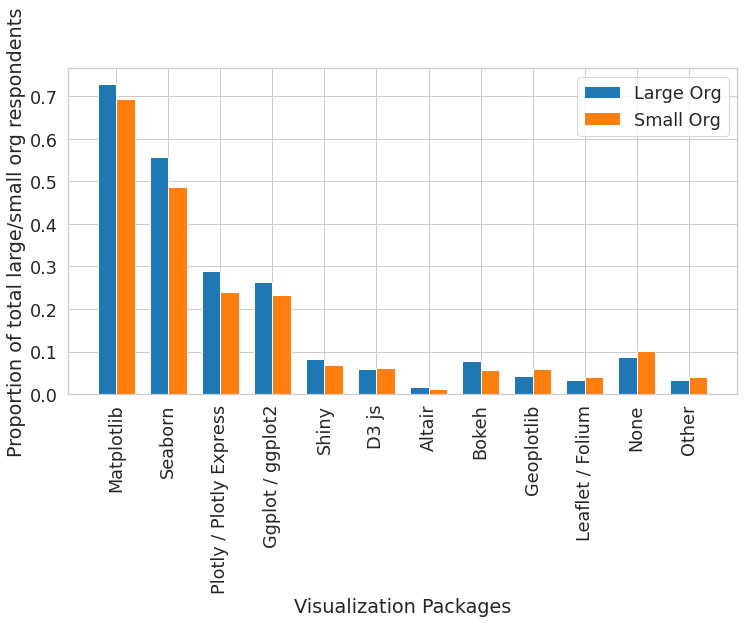

In [124]:
large_org_vis = aggregate_one_hot(large_org, 'Q14')
small_org_vis = aggregate_one_hot(small_org, 'Q14')

vis_df = pd.concat([large_org_vis.to_frame('Large Org'), small_org_vis.to_frame('Small Org')], axis=1)

labels = vis_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, vis_df['Large Org'].values, width, label='Large Org')
rects2 = ax.bar(x + width/2, vis_df['Small Org'].values, width, label='Small Org')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Visualization Packages')
_ = plt.ylabel('Proportion of total large/small org respondents')

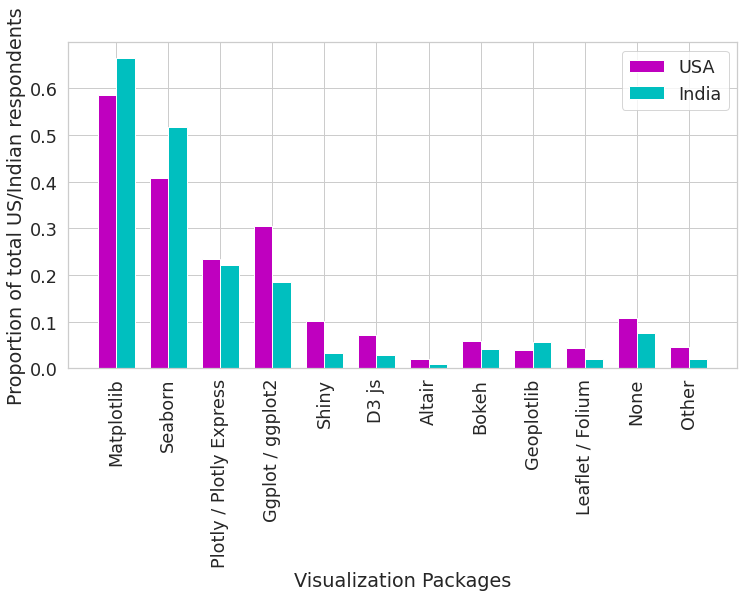

In [75]:
usa_vis = aggregate_one_hot(usa, 'Q14')
india_vis = aggregate_one_hot(india, 'Q14')

vis_df = pd.concat([usa_vis.to_frame('USA'), india_vis.to_frame('India')], axis=1)

labels = vis_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, vis_df['USA'].values, width, label='USA', color='m')
rects2 = ax.bar(x + width/2, vis_df['India'].values, width, label='India', color='c')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Visualization Packages')
_ = plt.ylabel('Proportion of total US/Indian respondents')

# Machine Learning (Q15 - Q19)

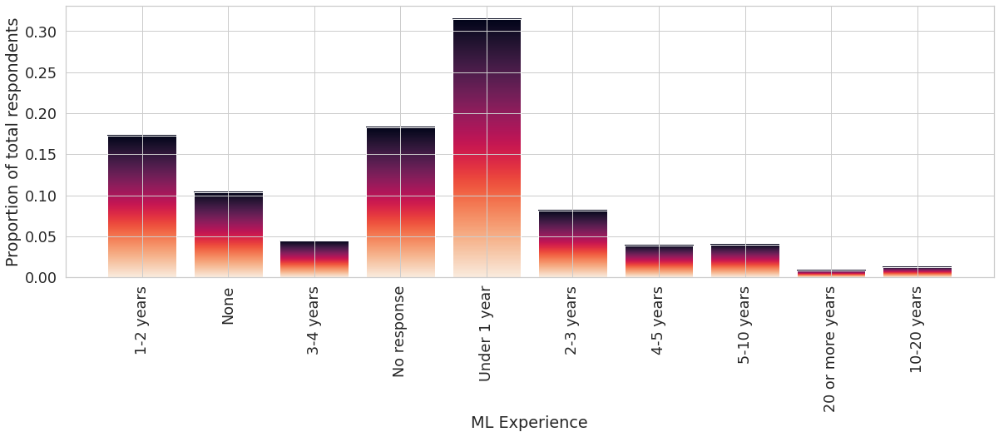

In [40]:
exp_ml = df['Q15']
to_replace = {'I do not use machine learning methods': 'None'}

sr = pd.Series(collections.Counter(exp_ml.replace(to_replace)))

fig = plt.figure(figsize=(20,6))
bar = plt.bar(sr.index, sr / sr.sum(), )
gradientbars(bar)
_ = plt.xticks(rotation=90)
_ = plt.xlabel('ML Experience')
_ = plt.ylabel('Proportion of total respondents')

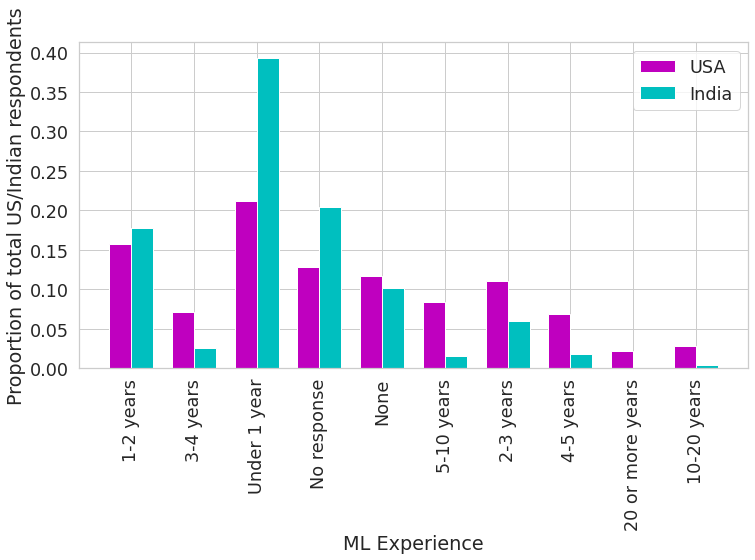

In [76]:
usa_exp_ml = usa['Q15']
india_exp_ml = india['Q15']
to_replace = {'I do not use machine learning methods': 'None'}

total_usa = usa.shape[0]
total_india = india.shape[0]

sr_usa = pd.Series(collections.Counter(usa_exp_ml.replace(to_replace))) / total_usa
sr_india = pd.Series(collections.Counter(india_exp_ml.replace(to_replace))) / total_india

exp_df = pd.concat([sr_usa.to_frame('USA'), sr_india.to_frame('India')], axis=1)

labels = exp_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, exp_df['USA'].values, width, label='USA', color='m')
rects2 = ax.bar(x + width/2, exp_df['India'].values, width, label='India', color='c')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('ML Experience')
_ = plt.ylabel('Proportion of total US/Indian respondents')

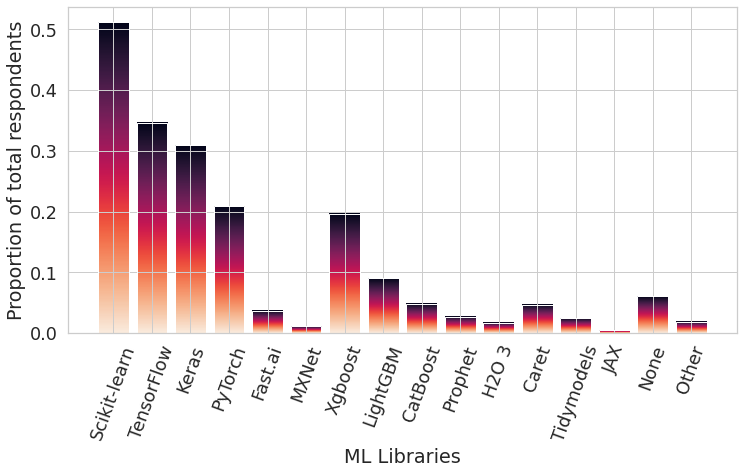

In [41]:
ml = aggregate_one_hot(df, 'Q16')

fig=plt.figure(figsize=(12,6))
bar = plt.bar(ml.index, ml.values)
gradientbars(bar)
_ = plt.xticks(rotation=70)
_ = plt.xlabel('ML Libraries')
_ = plt.ylabel('Proportion of total respondents')

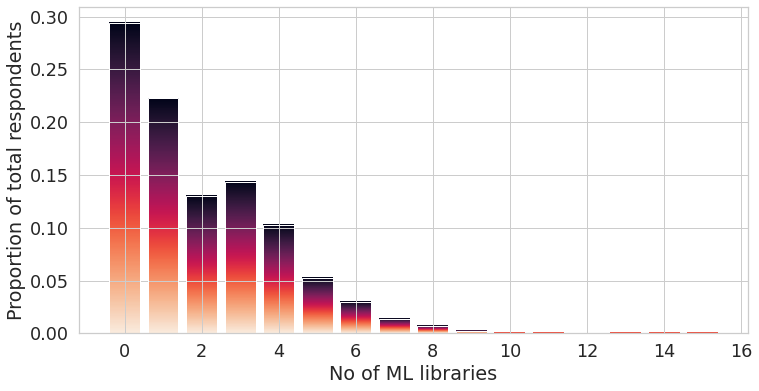

In [42]:
no_of_ml_libs_known = pd.Series(collections.Counter(df[[x for x in df.columns if x.startswith('Q16')]].apply(aggregate_count, axis=1))).sort_index()
df['no_of_ml_libs'] = df[[x for x in df.columns if x.startswith('Q16')]].apply(aggregate_count, axis=1) 

fig=plt.figure(figsize=(12,6))
bar = plt.bar(no_of_ml_libs_known.index, no_of_ml_libs_known.values / df.shape[0])
gradientbars(bar)
_ = plt.xlabel('No of ML libraries')
_ = plt.ylabel('Proportion of total respondents')

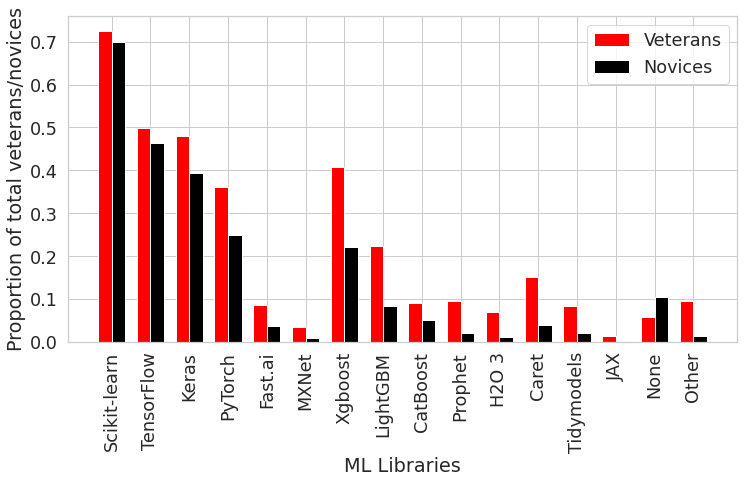

In [77]:
ML_veterans_ml = aggregate_one_hot(ML_veterans, 'Q16')
ML_novices_ml = aggregate_one_hot(ML_novices, 'Q16')

ml_df = pd.concat([ML_veterans_ml.to_frame('Veterans'), ML_novices_ml.to_frame('Novices')], axis=1)

labels = ml_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, ml_df['Veterans'].values, width, label='Veterans', color='r')
rects2 = ax.bar(x + width/2, ml_df['Novices'].values, width, label='Novices', color='k')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('ML Libraries')
_ = plt.ylabel('Proportion of total veterans/novices')

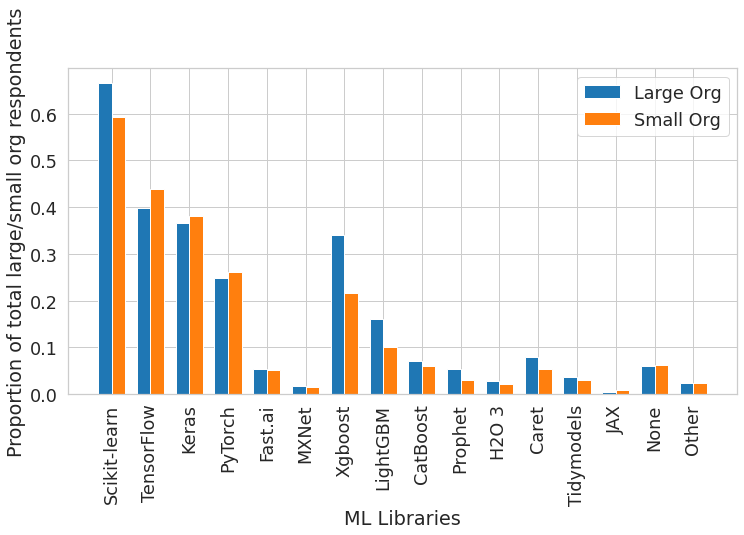

In [129]:
large_org_ml = aggregate_one_hot(large_org, 'Q16')
small_org_ml = aggregate_one_hot(small_org, 'Q16')

ml_df = pd.concat([large_org_ml.to_frame('Large Org'), small_org_ml.to_frame('Small Org')], axis=1)

labels = ml_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, ml_df['Large Org'].values, width, label='Large Org')
rects2 = ax.bar(x + width/2, ml_df['Small Org'].values, width, label='Small Org')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('ML Libraries')
_ = plt.ylabel('Proportion of total large/small org respondents')

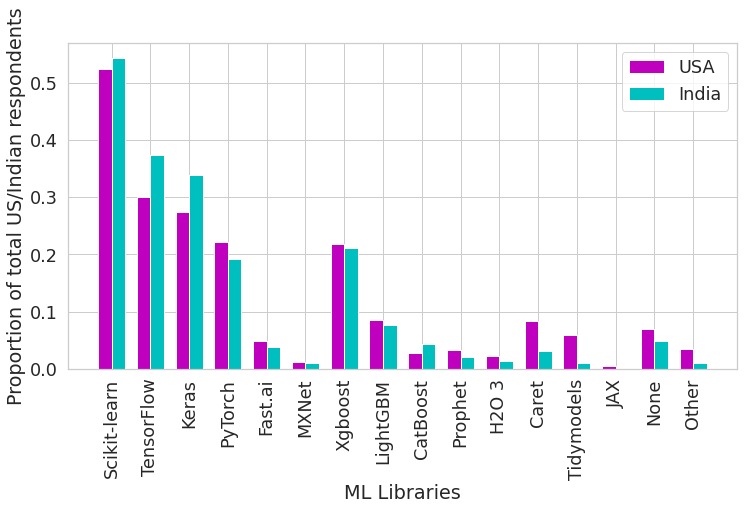

In [78]:
usa_ml = aggregate_one_hot(usa, 'Q16')
india_ml = aggregate_one_hot(india, 'Q16')

ml_df = pd.concat([usa_ml.to_frame('USA'), india_ml.to_frame('India')], axis=1)

labels = ml_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, ml_df['USA'].values, width, label='USA', color='m')
rects2 = ax.bar(x + width/2, ml_df['India'].values, width, label='India', color='c')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('ML Libraries')
_ = plt.ylabel('Proportion of total US/Indian respondents')

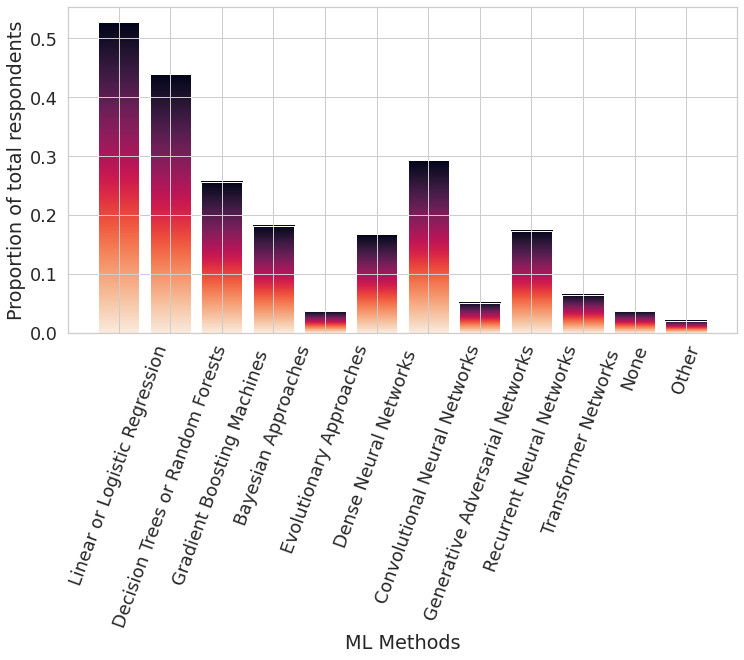

In [43]:
methods = aggregate_one_hot(df, 'Q17')

fig=plt.figure(figsize=(12,6))
bar = plt.bar(methods.index, methods.values)
gradientbars(bar)
_ = plt.xticks(rotation=70)
_ = plt.xlabel('ML Methods')
_ = plt.ylabel('Proportion of total respondents')

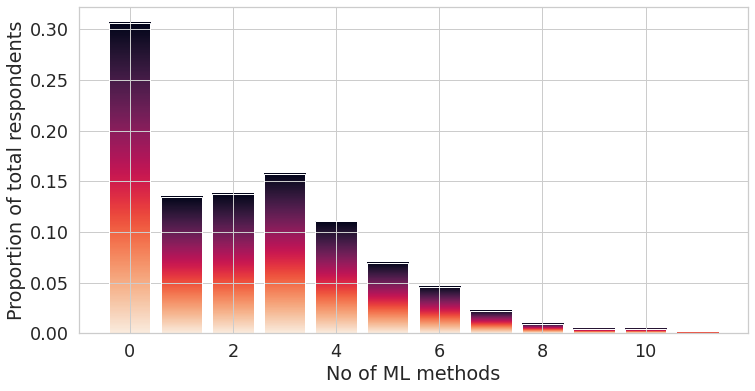

In [44]:
no_of_ml_methods_known = pd.Series(collections.Counter(df[[x for x in df.columns if x.startswith('Q17')]].apply(aggregate_count, axis=1))).sort_index()
df['no_of_ml_methods'] = df[[x for x in df.columns if x.startswith('Q17')]].apply(aggregate_count, axis=1) 

fig=plt.figure(figsize=(12,6))
bar = plt.bar(no_of_ml_methods_known.index, no_of_ml_methods_known.values / df.shape[0])
gradientbars(bar)
_ = plt.xlabel('No of ML methods')
_ = plt.ylabel('Proportion of total respondents')

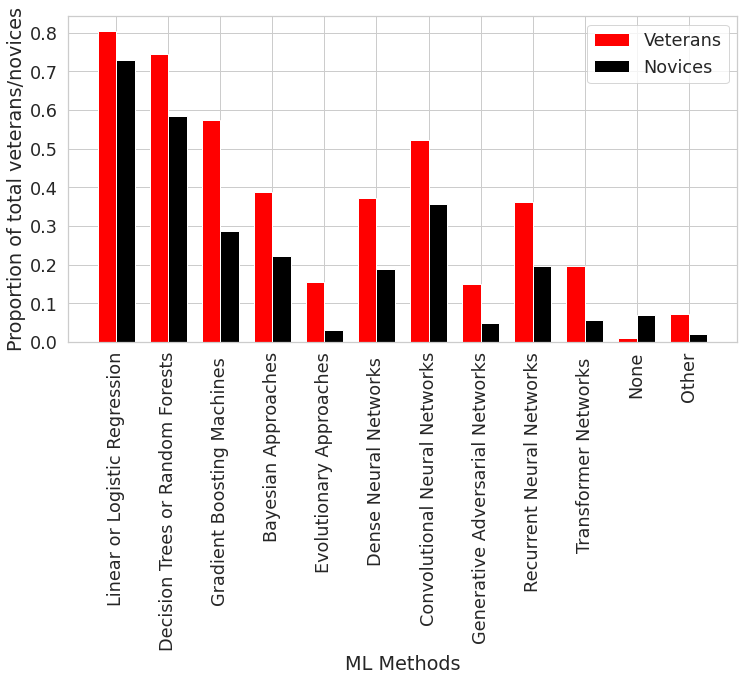

In [79]:
ML_veterans_methods = aggregate_one_hot(ML_veterans, 'Q17')
ML_novices_methods = aggregate_one_hot(ML_novices, 'Q17')

methods_df = pd.concat([ML_veterans_methods.to_frame('Veterans'), ML_novices_methods.to_frame('Novices')], axis=1)

labels = methods_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, methods_df['Veterans'].values, width, label='Veterans', color='r')
rects2 = ax.bar(x + width/2, methods_df['Novices'].values, width, label='Novices', color='k')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('ML Methods')
_ = plt.ylabel('Proportion of total veterans/novices')

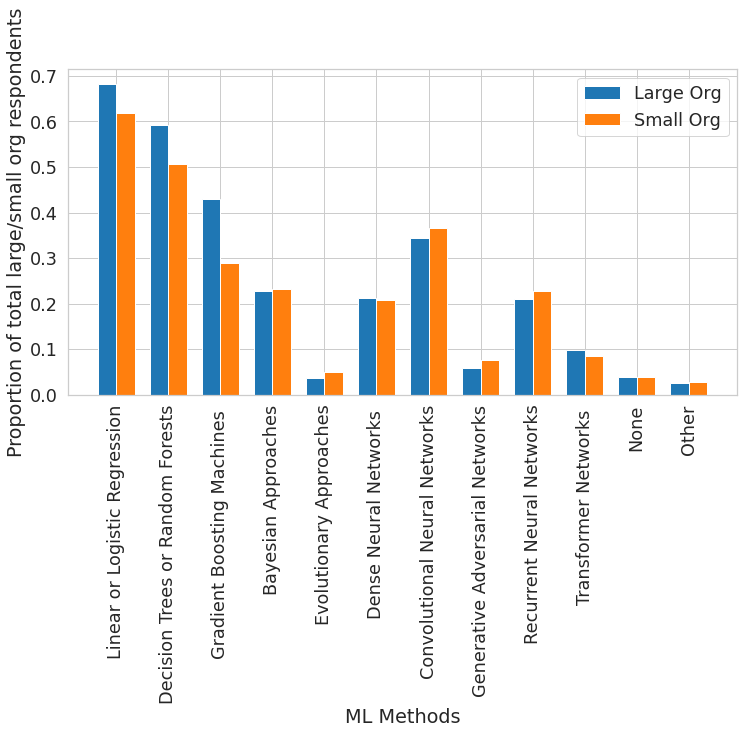

In [133]:
large_org_methods = aggregate_one_hot(large_org, 'Q17')
small_org_methods = aggregate_one_hot(small_org, 'Q17')

methods_df = pd.concat([large_org_methods.to_frame('Large Org'), small_org_methods.to_frame('Small Org')], axis=1)

labels = methods_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, methods_df['Large Org'].values, width, label='Large Org')
rects2 = ax.bar(x + width/2, methods_df['Small Org'].values, width, label='Small Org')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('ML Methods')
_ = plt.ylabel('Proportion of total large/small org respondents')

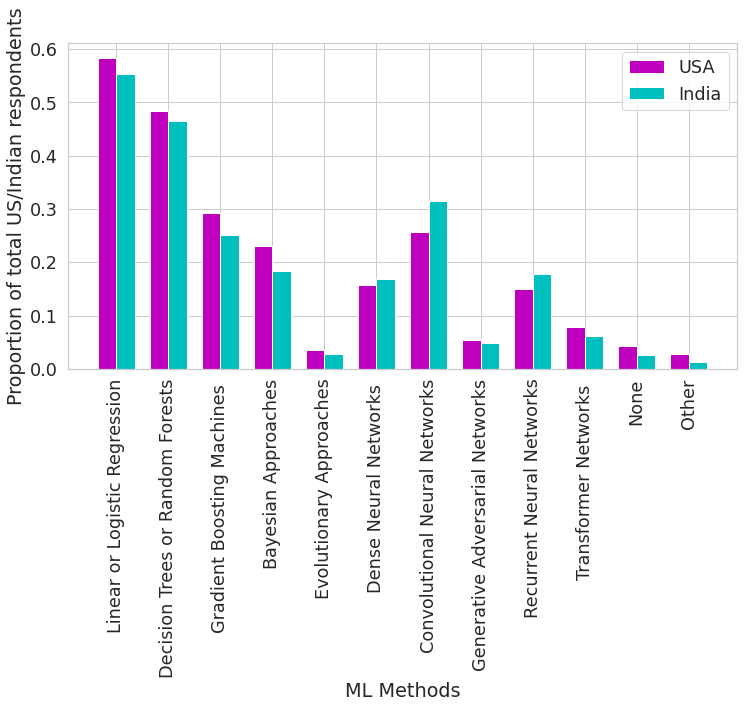

In [80]:
usa_methods = aggregate_one_hot(usa, 'Q17')
india_methods = aggregate_one_hot(india, 'Q17')

methods_df = pd.concat([usa_methods.to_frame('USA'), india_methods.to_frame('India')], axis=1)

labels = methods_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, methods_df['USA'].values, width, label='USA', color='m')
rects2 = ax.bar(x + width/2, methods_df['India'].values, width, label='India', color='c')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('ML Methods')
_ = plt.ylabel('Proportion of total US/Indian respondents')

### Computer Vision / Image Processing (Q18)

In [15]:
def not_asked(x):
    return all([p == 'No response' for p in x])

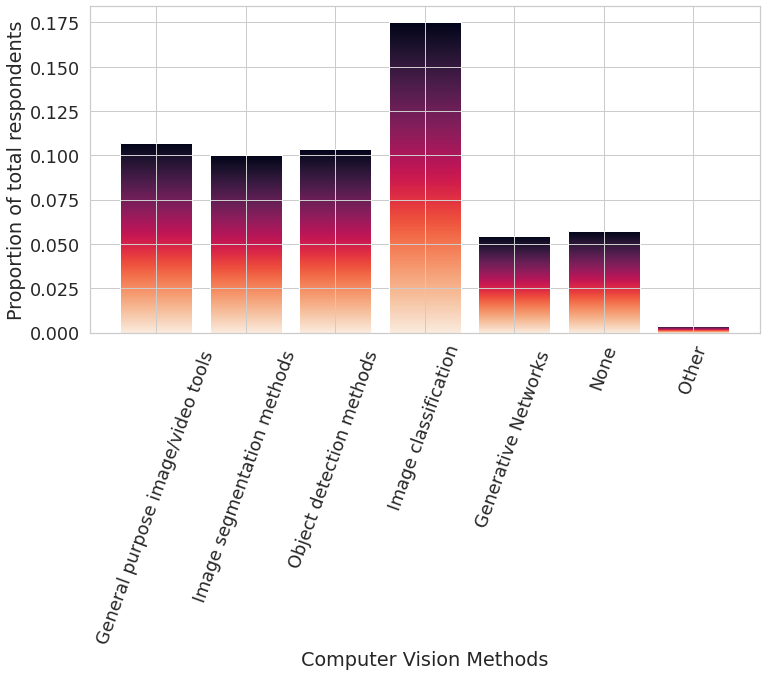

In [134]:

img = aggregate_one_hot(df, 'Q18')

labels_sub = [x if 'classification' not in x.split() else 'Image classification' for x in img.index]

fig=plt.figure(figsize=(12,6))
#bar = plt.bar(img.index, img.values)
bar = plt.bar(labels_sub, img.values)
gradientbars(bar)
_ = plt.xticks(rotation=70)
_ = plt.xlabel('Computer Vision Methods')
_ = plt.ylabel('Proportion of total respondents')

Proportion of total respondents who were asked computer vision related questions =  0.2950688760231583


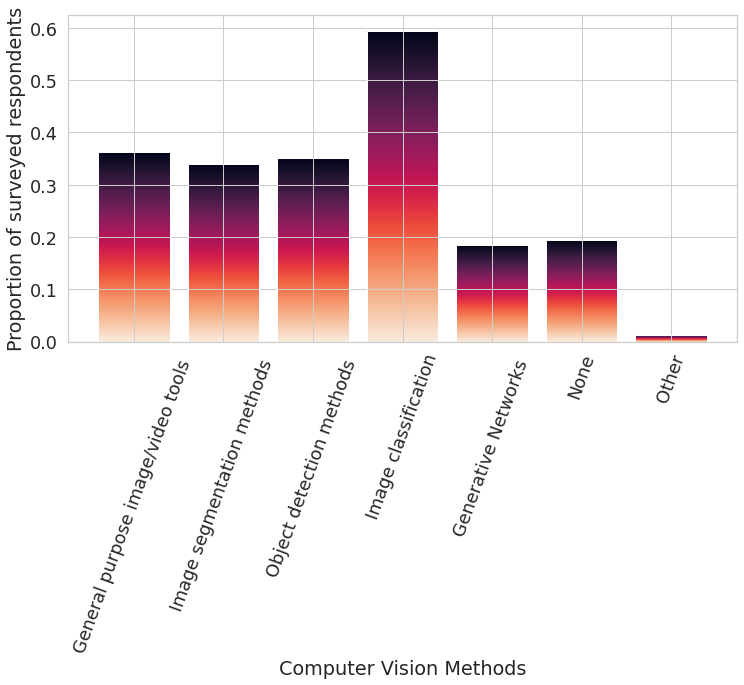

In [126]:
total_img_asked = ~df[[x for x in df.columns if x.startswith('Q18')]].apply(not_asked, axis=1)
dd_total_asked = collections.Counter(total_img_asked)
total_count = df.shape[0]
cnt_total_asked = dd_total_asked[True]

print("Proportion of total respondents who were asked computer vision related questions = ", cnt_total_asked / total_count)


labels_sub = [x if 'classification' not in x.split() else 'Image classification' for x in img.index]

fig=plt.figure(figsize=(12,6))
bar = plt.bar(labels_sub, img.values * total_count / cnt_total_asked)
#bar = plt.bar(img.index, img.values * total_count / cnt_total_asked)
gradientbars(bar)
_ = plt.xticks(rotation=70)
_ = plt.xlabel('Computer Vision Methods')
_ = plt.ylabel('Proportion of surveyed respondents')

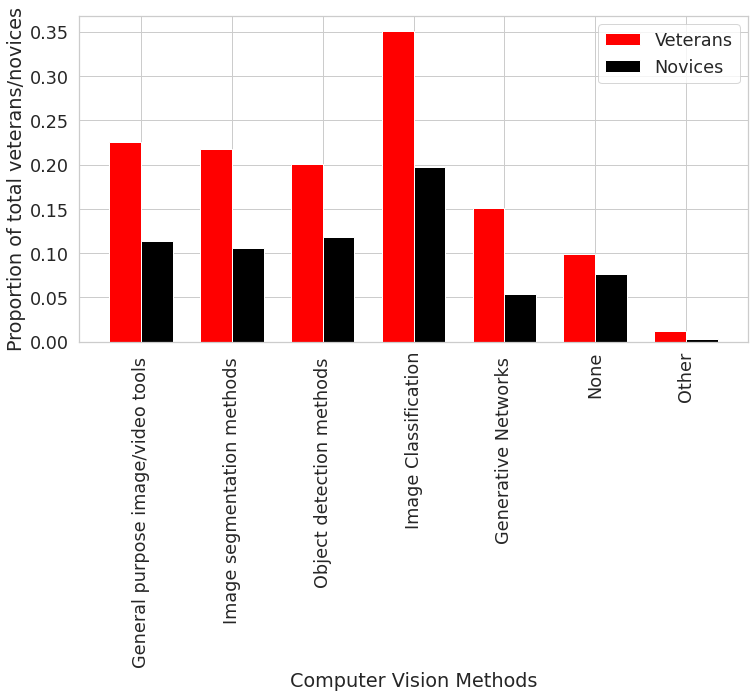

In [124]:
ML_veterans_img = aggregate_one_hot(ML_veterans, 'Q18')
ML_novices_img = aggregate_one_hot(ML_novices, 'Q18')

img_df = pd.concat([ML_veterans_img.to_frame('Veterans'), ML_novices_img.to_frame('Novices')], axis=1)

labels = img_df.index
labels_sub = [x if x != 'Image classification and other general purpose networks' else 'Image Classification' for x in labels]

labels_sub = [x if 'classification' not in x.split() else 'Image classification' for x in labels]

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, img_df['Veterans'].values, width, label='Veterans', color='r')
rects2 = ax.bar(x + width/2, img_df['Novices'].values, width, label='Novices', color='k')
ax.set_xticks(x)
ax.set_xticklabels(labels_sub, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Computer Vision Methods')
_ = plt.ylabel('Proportion of total veterans/novices')

Proportion of veterans who were asked computer vision related questions =  0.5311475409836065
Proportion of novices who were asked computer vision related questions =  0.3582028451540272


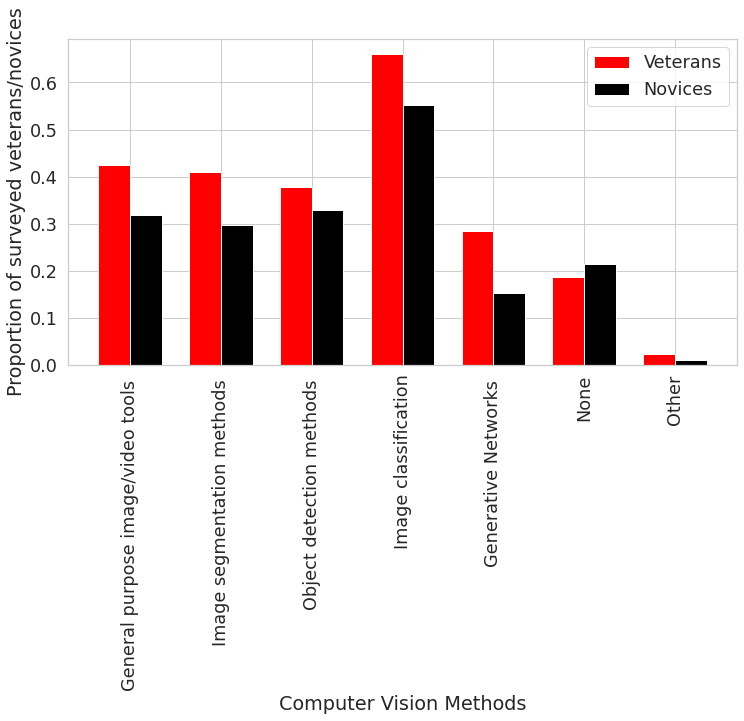

In [127]:
veterans_img_asked = ~ML_veterans[[x for x in ML_veterans.columns if x.startswith('Q18')]].apply(not_asked, axis=1)
dd_veterans_asked = collections.Counter(veterans_img_asked)
total_veteran_count = ML_veterans.shape[0]
cnt_veterans_asked = dd_veterans_asked[True]

novices_img_asked = ~ML_novices[[x for x in ML_novices.columns if x.startswith('Q18')]].apply(not_asked, axis=1)
dd_novices_asked = collections.Counter(novices_img_asked)
total_novice_count = ML_novices.shape[0]
cnt_novices_asked = dd_novices_asked[True]

print("Proportion of veterans who were asked computer vision related questions = ", cnt_veterans_asked / total_veteran_count)
print("Proportion of novices who were asked computer vision related questions = ", cnt_novices_asked / total_novice_count)

ML_veterans_img = aggregate_one_hot(ML_veterans, 'Q18')
ML_novices_img = aggregate_one_hot(ML_novices, 'Q18')

img_df = pd.concat([ML_veterans_img.to_frame('Veterans'), ML_novices_img.to_frame('Novices')], axis=1)

labels = img_df.index
labels_sub = [x if 'classification' not in x.split() else 'Image classification' for x in labels]

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, img_df['Veterans'].values * total_veteran_count / cnt_veterans_asked, width, label='Veterans', color='r')
rects2 = ax.bar(x + width/2, img_df['Novices'].values * total_novice_count / cnt_novices_asked, width, label='Novices', color='k')
ax.set_xticks(x)
ax.set_xticklabels(labels_sub, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Computer Vision Methods')
_ = plt.ylabel('Proportion of surveyed veterans/novices')

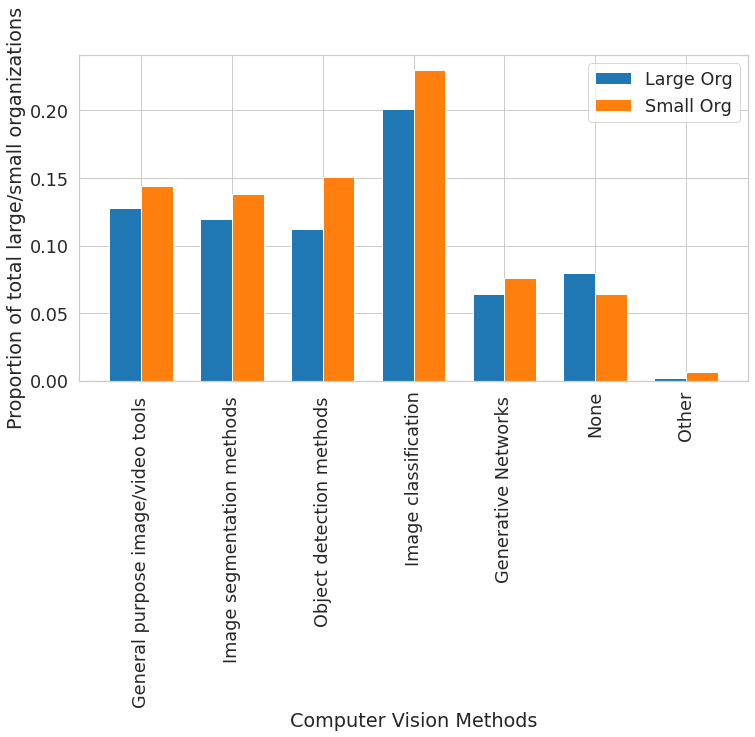

In [128]:
large_org_img = aggregate_one_hot(large_org, 'Q18')
small_org_img = aggregate_one_hot(small_org, 'Q18')

img_df = pd.concat([large_org_img.to_frame('Large Org'), small_org_img.to_frame('Small Org')], axis=1)

labels = img_df.index
labels_sub = [x if 'classification' not in x.split() else 'Image classification' for x in labels]

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, img_df['Large Org'].values, width, label='Large Org')
rects2 = ax.bar(x + width/2, img_df['Small Org'].values, width, label='Small Org')
ax.set_xticks(x)
ax.set_xticklabels(labels_sub, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Computer Vision Methods')
_ = plt.ylabel('Proportion of total large/small organizations')

Proportion of respondents from large orgs who were asked computer vision related questions =  0.3516532618409294
Proportion of respondents from small orgs who were asked computer vision related questions =  0.37927756653992395


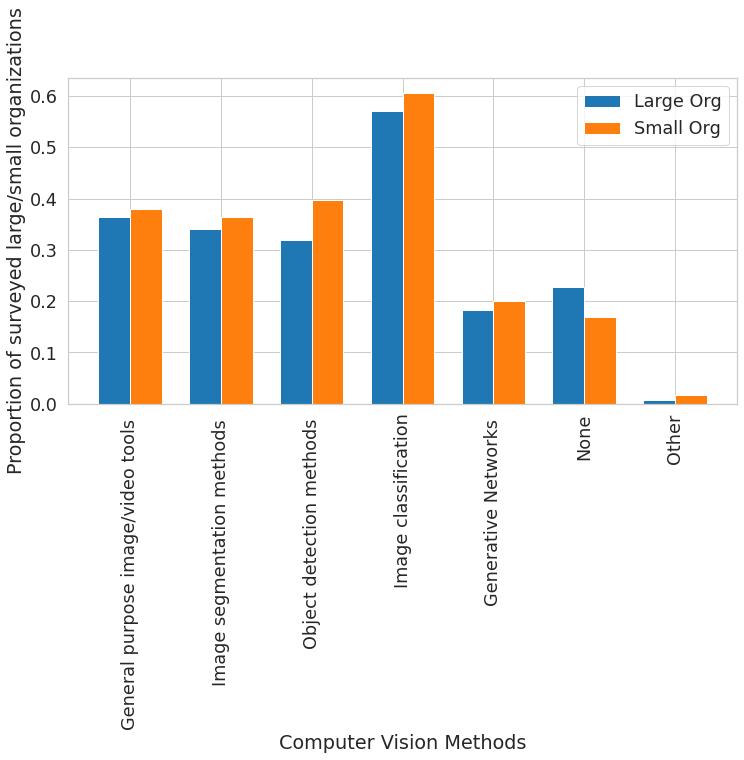

In [129]:
large_org_img_asked = ~large_org[[x for x in large_org.columns if x.startswith('Q18')]].apply(not_asked, axis=1)
dd_large_org_asked = collections.Counter(large_org_img_asked)
total_large_org_count = large_org.shape[0]
cnt_large_org_asked = dd_large_org_asked[True]

small_org_img_asked = ~small_org[[x for x in small_org.columns if x.startswith('Q18')]].apply(not_asked, axis=1)
dd_small_org_asked = collections.Counter(small_org_img_asked)
total_small_org_count = small_org.shape[0]
cnt_small_org_asked = dd_small_org_asked[True]

print("Proportion of respondents from large orgs who were asked computer vision related questions = ", cnt_large_org_asked / total_large_org_count)
print("Proportion of respondents from small orgs who were asked computer vision related questions = ", cnt_small_org_asked / total_small_org_count)

large_org_img = aggregate_one_hot(large_org, 'Q18')
small_org_img = aggregate_one_hot(small_org, 'Q18')

img_df = pd.concat([large_org_img.to_frame('Large Org'), small_org_img.to_frame('Small Org')], axis=1)

labels = img_df.index
labels_sub = [x if 'classification' not in x.split() else 'Image classification' for x in labels]

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, img_df['Large Org'].values * total_large_org_count / cnt_large_org_asked, width, label='Large Org')
rects2 = ax.bar(x + width/2, img_df['Small Org'].values * total_small_org_count / cnt_small_org_asked, width, label='Small Org')
ax.set_xticks(x)
ax.set_xticklabels(labels_sub, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Computer Vision Methods')
_ = plt.ylabel('Proportion of surveyed large/small organizations')

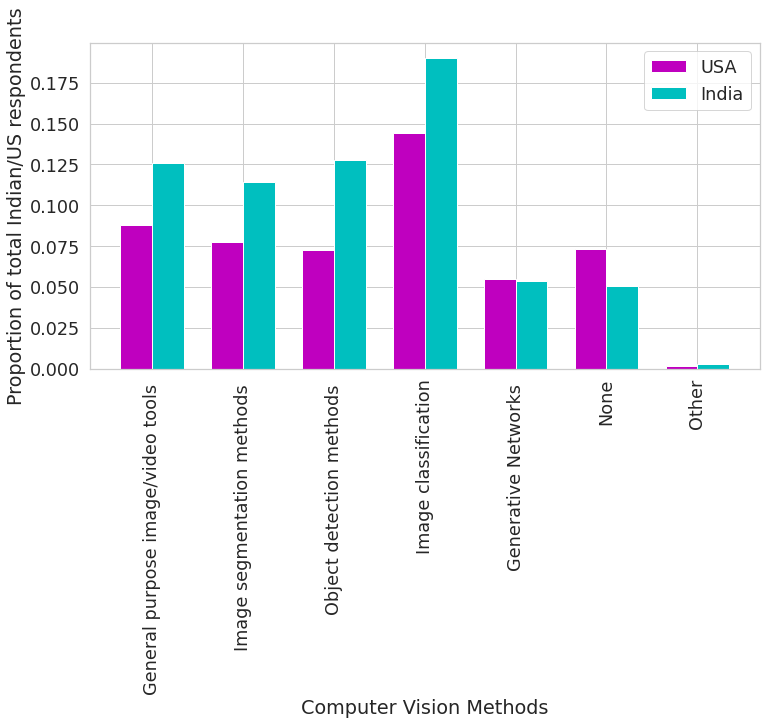

In [130]:
usa_img = aggregate_one_hot(usa, 'Q18')
india_img = aggregate_one_hot(india, 'Q18')

img_df = pd.concat([usa_img.to_frame('USA'), india_img.to_frame('India')], axis=1)

labels = img_df.index
labels_sub = [x if 'classification' not in x.split() else 'Image classification' for x in labels]

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, img_df['USA'].values, width, label='USA', color='m')
rects2 = ax.bar(x + width/2, img_df['India'].values, width, label='India', color='c')
ax.set_xticks(x)
ax.set_xticklabels(labels_sub, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Computer Vision Methods')
_ = plt.ylabel('Proportion of total Indian/US respondents')

Proportion of respondents from USA who were asked computer vision related questions =  0.2637460885113992
Proportion of respondents from India who were asked computer vision related questions =  0.31105793881387794


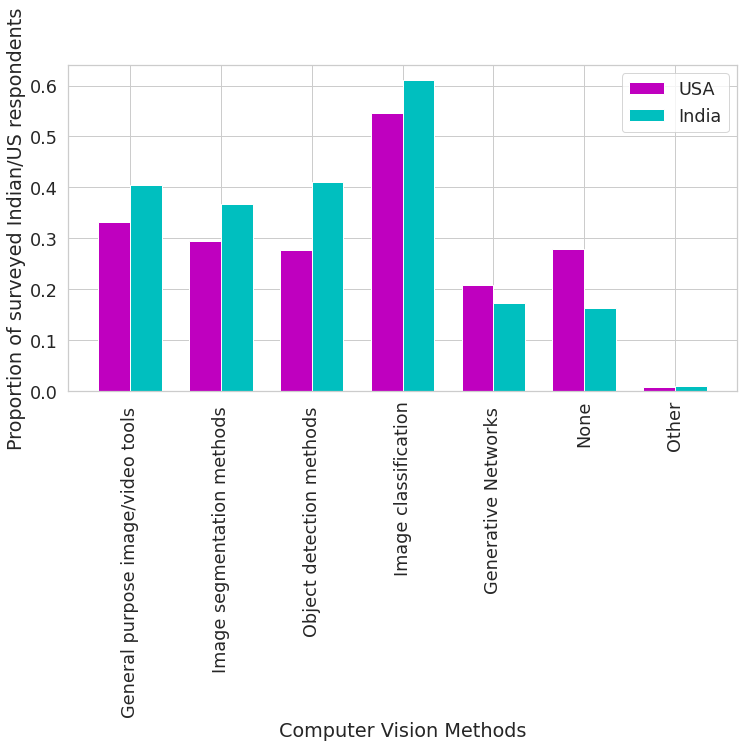

In [131]:
usa_img_asked = ~usa[[x for x in usa.columns if x.startswith('Q18')]].apply(not_asked, axis=1)
dd_usa_asked = collections.Counter(usa_img_asked)
total_usa_count = usa.shape[0]
cnt_usa_asked = dd_usa_asked[True]

india_img_asked = ~india[[x for x in india.columns if x.startswith('Q18')]].apply(not_asked, axis=1)
dd_india_asked = collections.Counter(india_img_asked)
total_india_count = india.shape[0]
cnt_india_asked = dd_india_asked[True]

print("Proportion of respondents from USA who were asked computer vision related questions = ", cnt_usa_asked / total_usa_count)
print("Proportion of respondents from India who were asked computer vision related questions = ", cnt_india_asked / total_india_count)

usa_img = aggregate_one_hot(usa, 'Q18')
india_img = aggregate_one_hot(india, 'Q18')

img_df = pd.concat([usa_img.to_frame('USA'), india_img.to_frame('India')], axis=1)

labels = img_df.index
labels_sub = [x if 'classification' not in x.split() else 'Image classification' for x in labels]

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, img_df['USA'].values * total_usa_count / cnt_usa_asked, width, label='USA', color='m')
rects2 = ax.bar(x + width/2, img_df['India'].values * total_india_count / cnt_india_asked, width, label='India', color='c')
ax.set_xticks(x)
ax.set_xticklabels(labels_sub, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Computer Vision Methods')
_ = plt.ylabel('Proportion of surveyed Indian/US respondents')

### Natural Language Processing / Text (Q19)

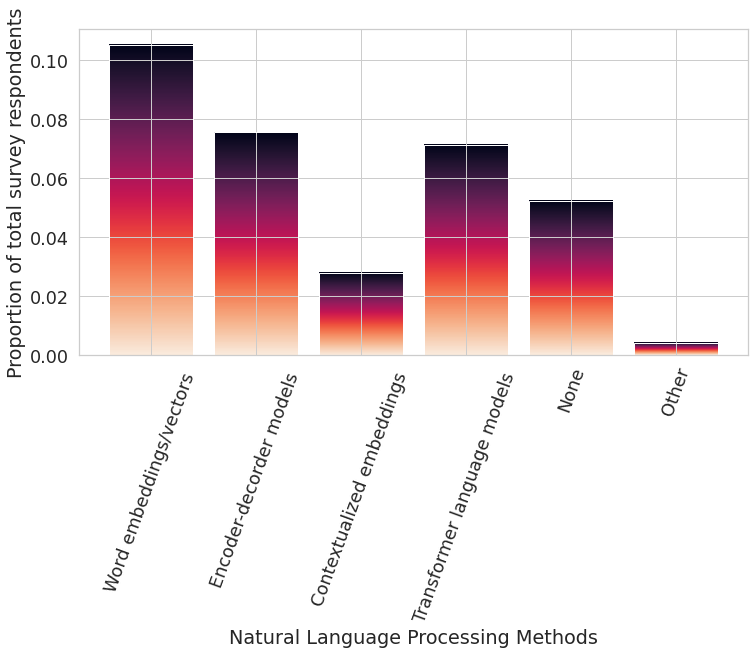

In [48]:
text = aggregate_one_hot(df, 'Q19')

fig=plt.figure(figsize=(12,6))
bar = plt.bar(text.index, text.values)
gradientbars(bar)
_ = plt.xticks(rotation=70)
_ = plt.xlabel('Natural Language Processing Methods')
_ = plt.ylabel('Proportion of total survey respondents')

Proportion of total respondents who were asked natural language processing related questions =  0.1930525054901178


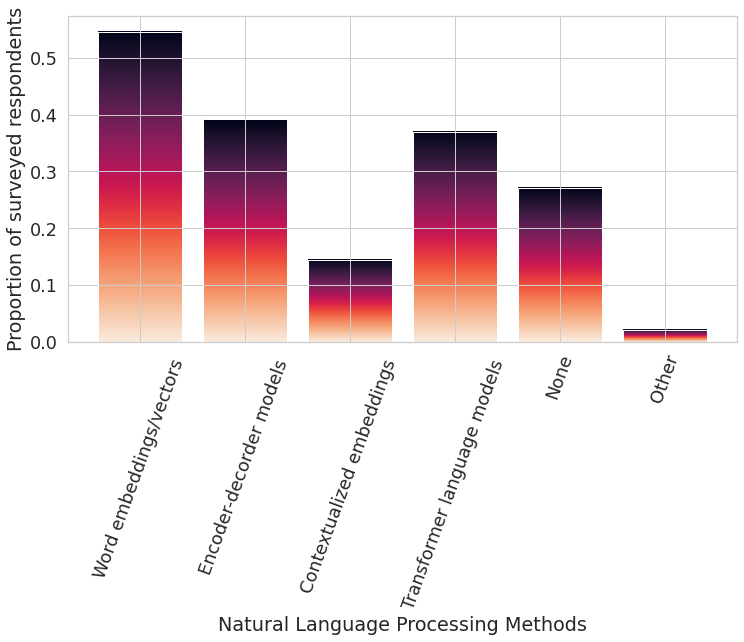

In [49]:
total_text_asked = ~df[[x for x in df.columns if x.startswith('Q19')]].apply(not_asked, axis=1)
dd_total_asked = collections.Counter(total_text_asked)
total_count = df.shape[0]
cnt_total_asked = dd_total_asked[True]

print("Proportion of total respondents who were asked natural language processing related questions = ", cnt_total_asked / total_count)

fig=plt.figure(figsize=(12,6))
bar = plt.bar(text.index, text.values * total_count / cnt_total_asked)
gradientbars(bar)
_ = plt.xticks(rotation=70)
_ = plt.xlabel('Natural Language Processing Methods')
_ = plt.ylabel('Proportion of surveyed respondents')

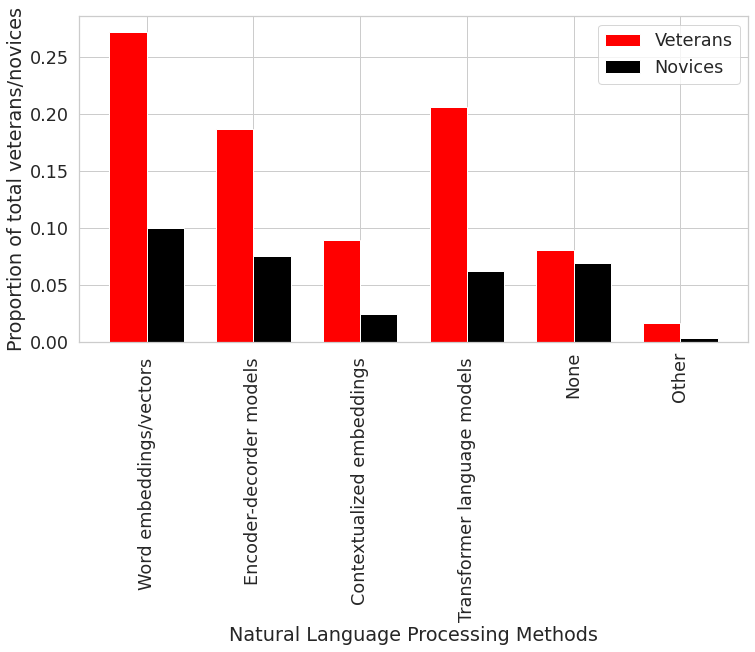

In [85]:
ML_veterans_text = aggregate_one_hot(ML_veterans, 'Q19')
ML_novices_text = aggregate_one_hot(ML_novices, 'Q19')

text_df = pd.concat([ML_veterans_text.to_frame('Veterans'), ML_novices_text.to_frame('Novices')], axis=1)

labels = text_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, text_df['Veterans'].values, width, label='Veterans', color='r')
rects2 = ax.bar(x + width/2, text_df['Novices'].values, width, label='Novices', color='k')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Natural Language Processing Methods')
_ = plt.ylabel('Proportion of total veterans/novices')

Proportion of veterans who were asked NLP related questions =  0.419672131147541
Proportion of novices who were asked NLP related questions =  0.21226077167127214


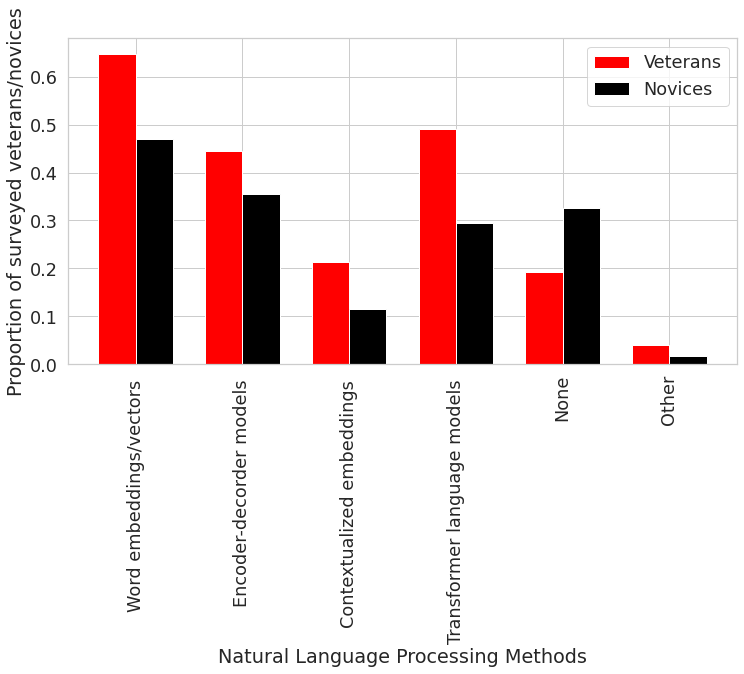

In [86]:
veterans_text_asked = ~ML_veterans[[x for x in ML_veterans.columns if x.startswith('Q19')]].apply(not_asked, axis=1)
dd_veterans_asked = collections.Counter(veterans_text_asked)
total_veteran_count = ML_veterans.shape[0]
cnt_veterans_asked = dd_veterans_asked[True]

novices_text_asked = ~ML_novices[[x for x in ML_novices.columns if x.startswith('Q19')]].apply(not_asked, axis=1)
dd_novices_asked = collections.Counter(novices_text_asked)
total_novice_count = ML_novices.shape[0]
cnt_novices_asked = dd_novices_asked[True]

print("Proportion of veterans who were asked NLP related questions = ", cnt_veterans_asked / total_veteran_count)
print("Proportion of novices who were asked NLP related questions = ", cnt_novices_asked / total_novice_count)

ML_veterans_text = aggregate_one_hot(ML_veterans, 'Q19')
ML_novices_text = aggregate_one_hot(ML_novices, 'Q19')

text_df = pd.concat([ML_veterans_text.to_frame('Veterans'), ML_novices_text.to_frame('Novices')], axis=1)

labels = text_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, text_df['Veterans'].values * total_veteran_count / cnt_veterans_asked, width, label='Veterans', color='r')
rects2 = ax.bar(x + width/2, text_df['Novices'].values * total_novice_count / cnt_novices_asked, width, label='Novices', color='k')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Natural Language Processing Methods')
_ = plt.ylabel('Proportion of surveyed veterans/novices')

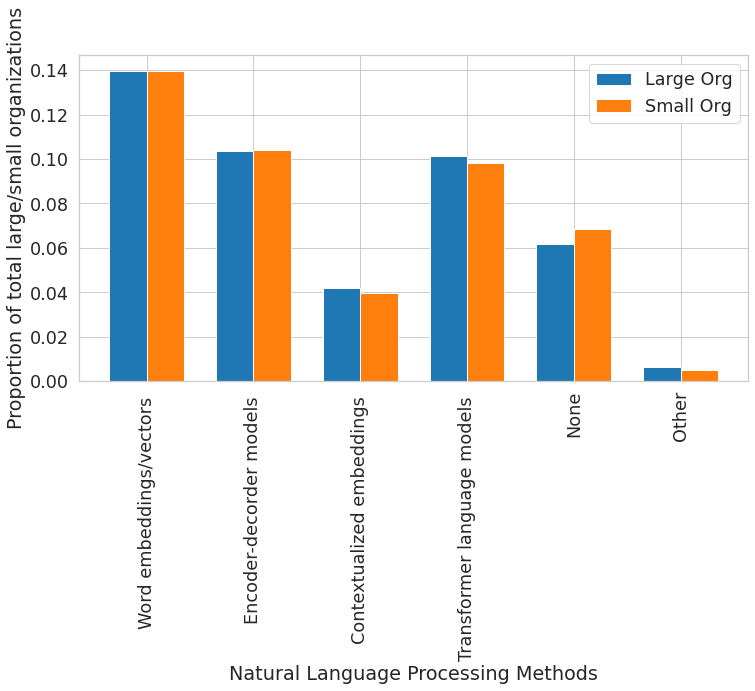

In [151]:
large_org_text = aggregate_one_hot(large_org, 'Q19')
small_org_text = aggregate_one_hot(small_org, 'Q19')

text_df = pd.concat([large_org_text.to_frame('Large Org'), small_org_text.to_frame('Small Org')], axis=1)

labels = text_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, text_df['Large Org'].values, width, label='Large Org')
rects2 = ax.bar(x + width/2, text_df['Small Org'].values, width, label='Small Org')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Natural Language Processing Methods')
_ = plt.ylabel('Proportion of total large/small organizations')

Proportion of respondents from large orgs who were asked NLP related questions =  0.2457551385165326
Proportion of respondents from small orgs who were asked NLP related questions =  0.25594106463878324


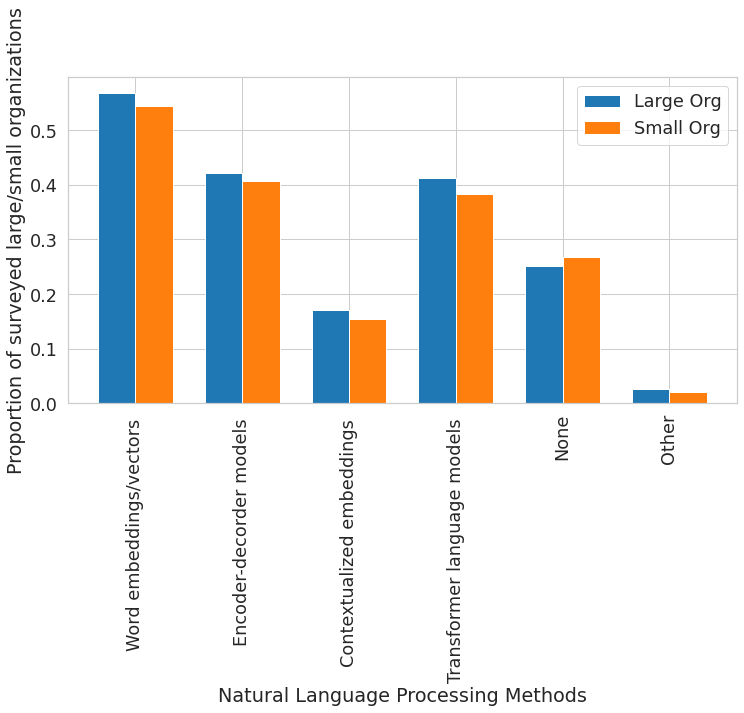

In [152]:
large_org_text_asked = ~large_org[[x for x in large_org.columns if x.startswith('Q19')]].apply(not_asked, axis=1)
dd_large_org_asked = collections.Counter(large_org_text_asked)
total_large_org_count = large_org.shape[0]
cnt_large_org_asked = dd_large_org_asked[True]

small_org_text_asked = ~small_org[[x for x in small_org.columns if x.startswith('Q19')]].apply(not_asked, axis=1)
dd_small_org_asked = collections.Counter(small_org_text_asked)
total_small_org_count = small_org.shape[0]
cnt_small_org_asked = dd_small_org_asked[True]

print("Proportion of respondents from large orgs who were asked NLP related questions = ", cnt_large_org_asked / total_large_org_count)
print("Proportion of respondents from small orgs who were asked NLP related questions = ", cnt_small_org_asked / total_small_org_count)

large_org_text = aggregate_one_hot(large_org, 'Q19')
small_org_text = aggregate_one_hot(small_org, 'Q19')

text_df = pd.concat([large_org_text.to_frame('Large Org'), small_org_text.to_frame('Small Org')], axis=1)

labels = text_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, text_df['Large Org'].values * total_large_org_count / cnt_large_org_asked, width, label='Large Org')
rects2 = ax.bar(x + width/2, text_df['Small Org'].values * total_small_org_count / cnt_small_org_asked, width, label='Small Org')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Natural Language Processing Methods')
_ = plt.ylabel('Proportion of surveyed large/small organizations')

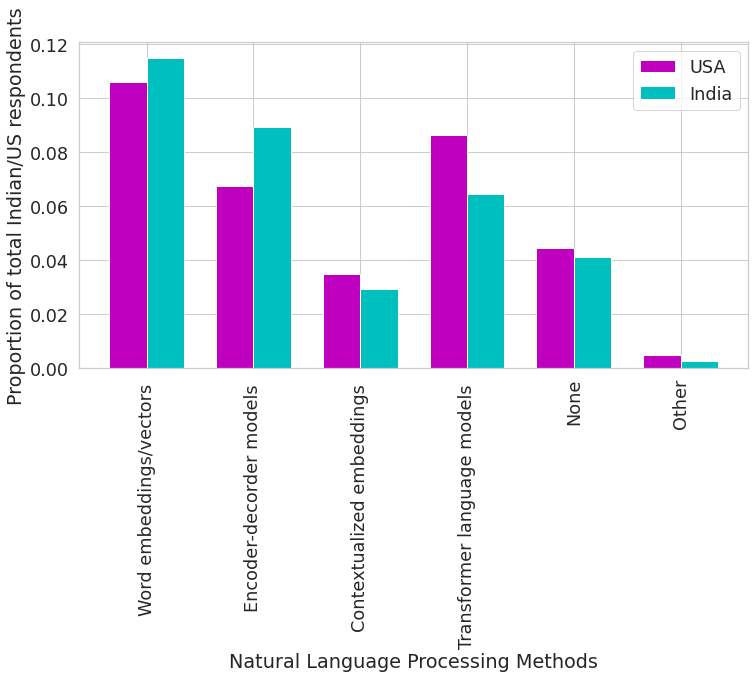

In [87]:
usa_text = aggregate_one_hot(usa, 'Q19')
india_text = aggregate_one_hot(india, 'Q19')

text_df = pd.concat([usa_text.to_frame('USA'), india_text.to_frame('India')], axis=1)

labels = text_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, text_df['USA'].values, width, label='USA', color='m')
rects2 = ax.bar(x + width/2, text_df['India'].values, width, label='India', color='c')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Natural Language Processing Methods')
_ = plt.ylabel('Proportion of total Indian/US respondents')

Proportion of respondents from USA who were asked NLP related questions =  0.18417523468931604
Proportion of respondents from India who were asked NLP related questions =  0.18919842761921038


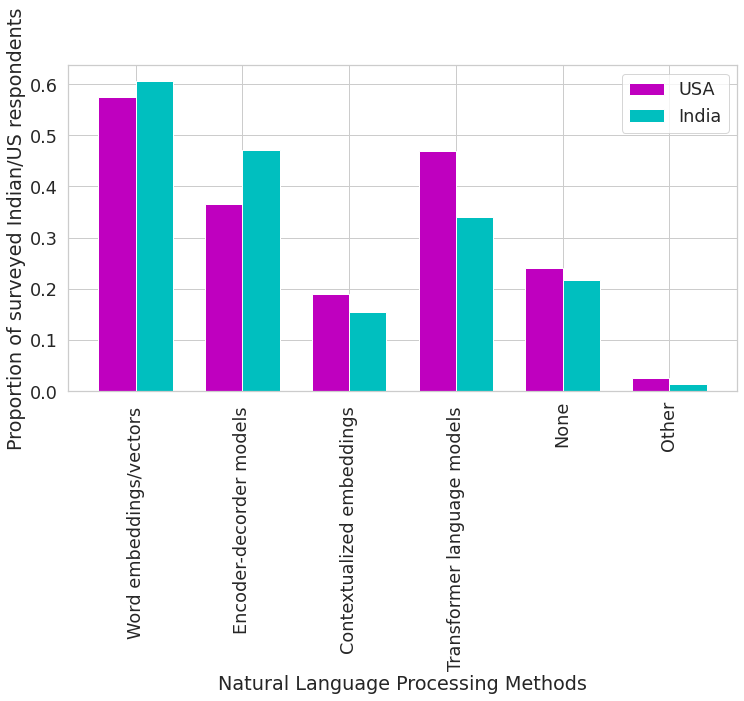

In [88]:
usa_text_asked = ~usa[[x for x in usa.columns if x.startswith('Q19')]].apply(not_asked, axis=1)
dd_usa_asked = collections.Counter(usa_text_asked)
total_usa_count = usa.shape[0]
cnt_usa_asked = dd_usa_asked[True]

india_text_asked = ~india[[x for x in india.columns if x.startswith('Q19')]].apply(not_asked, axis=1)
dd_india_asked = collections.Counter(india_text_asked)
total_india_count = india.shape[0]
cnt_india_asked = dd_india_asked[True]

print("Proportion of respondents from USA who were asked NLP related questions = ", cnt_usa_asked / total_usa_count)
print("Proportion of respondents from India who were asked NLP related questions = ", cnt_india_asked / total_india_count)

usa_text = aggregate_one_hot(usa, 'Q19')
india_text = aggregate_one_hot(india, 'Q19')

text_df = pd.concat([usa_text.to_frame('USA'), india_text.to_frame('India')], axis=1)

labels = text_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, text_df['USA'].values * total_usa_count / cnt_usa_asked, width, label='USA', color='m')
rects2 = ax.bar(x + width/2, text_df['India'].values * total_india_count / cnt_india_asked, width, label='India', color='c')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Natural Language Processing Methods')
_ = plt.ylabel('Proportion of surveyed Indian/US respondents')

# Employment-related (Q20 - Q25)

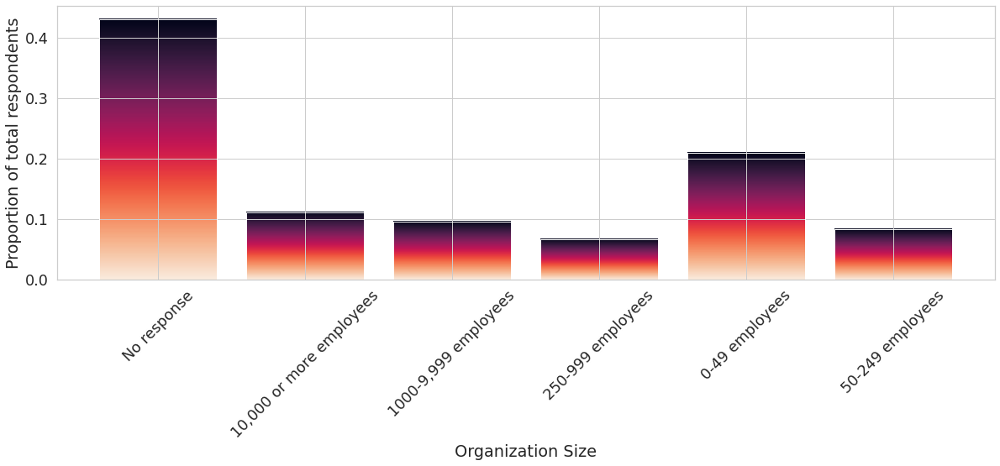

In [50]:
org_size = df['Q20']

sr = pd.Series(collections.Counter(org_size))

fig = plt.figure(figsize=(20,6))
bar = plt.bar(sr.index, sr / sr.sum(), )
gradientbars(bar)
_ = plt.xticks(rotation=45)
_ = plt.xlabel('Organization Size')
_ = plt.ylabel('Proportion of total respondents')

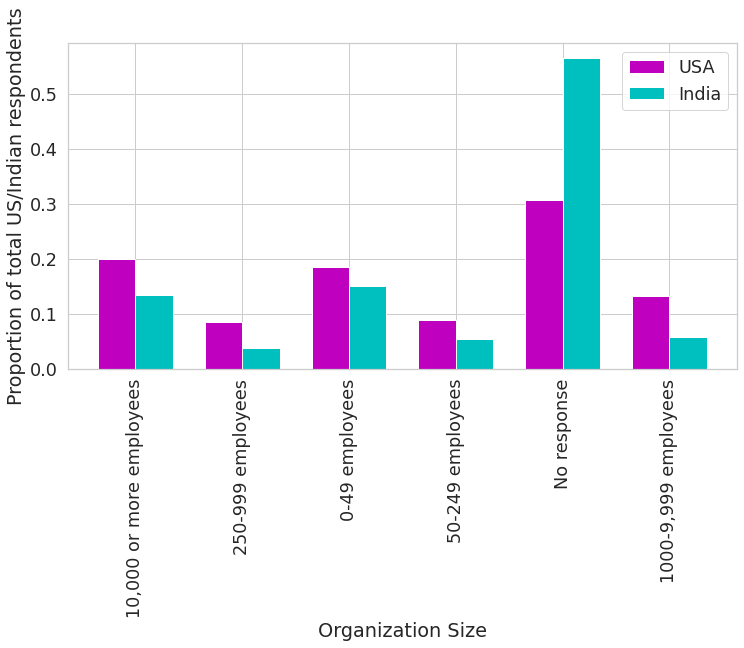

In [89]:
usa_org_size = usa['Q20']
india_org_size = india['Q20']

total_usa = usa.shape[0]
total_india = india.shape[0]

sr_usa = pd.Series(collections.Counter(usa_org_size)) / total_usa
sr_india = pd.Series(collections.Counter(india_org_size)) / total_india

org_size_df = pd.concat([sr_usa.to_frame('USA'), sr_india.to_frame('India')], axis=1)

labels = org_size_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, org_size_df['USA'].values, width, label='USA', color='m')
rects2 = ax.bar(x + width/2, org_size_df['India'].values, width, label='India', color='c')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Organization Size')
_ = plt.ylabel('Proportion of total US/Indian respondents')

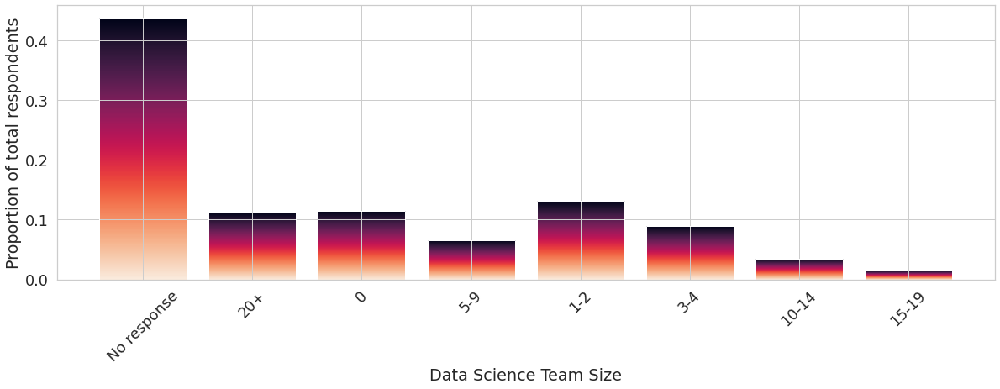

In [51]:
ds_team = df['Q21']

sr = pd.Series(collections.Counter(ds_team))

fig = plt.figure(figsize=(20,6))
bar = plt.bar(sr.index, sr / sr.sum(), )
gradientbars(bar)
_ = plt.xticks(rotation=45)
_ = plt.xlabel('Data Science Team Size')
_ = plt.ylabel('Proportion of total respondents')

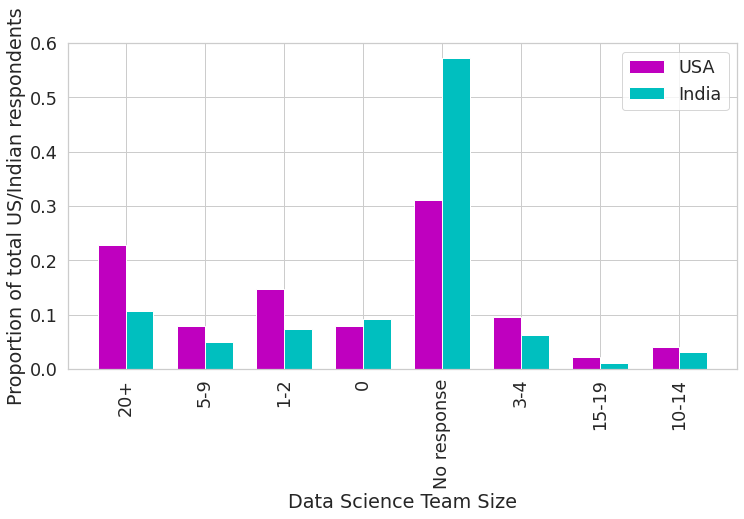

In [90]:
usa_ds_size = usa['Q21']
india_ds_size = india['Q21']

total_usa = usa.shape[0]
total_india = india.shape[0]

sr_usa = pd.Series(collections.Counter(usa_ds_size)) / total_usa
sr_india = pd.Series(collections.Counter(india_ds_size)) / total_india

ds_size_df = pd.concat([sr_usa.to_frame('USA'), sr_india.to_frame('India')], axis=1)

labels = ds_size_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, ds_size_df['USA'].values, width, label='USA', color='m')
rects2 = ax.bar(x + width/2, ds_size_df['India'].values, width, label='India', color='c')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Data Science Team Size')
_ = plt.ylabel('Proportion of total US/Indian respondents')

In [64]:
ml_use = df['Q22']
pd.Series(collections.Counter(ml_use)) / df.shape[0]

No response                                                                                  0.444500
We have well established ML methods (i.e., models in production for more than 2 years)       0.095578
No (we do not use ML methods)                                                                0.110900
We use ML methods for generating insights (but do not put working models into production)    0.062388
We are exploring ML methods (and may one day put a model into production)                    0.117439
We recently started using ML methods (i.e., models in production for less than 2 years)      0.089938
I do not know                                                                                0.079257
dtype: float64

In [52]:
ppp = pd.read_csv('ppp_and_exchange.csv', header=None)
ppp = ppp.loc[1:, :]
ppp.columns = ['country', 'ppp', 'exchange', 'ratio']

country_list = ppp.country.values

countries_rev = []
for country in country_list:
    country_rev = country.strip(' .')
    countries_rev.append(country_rev)
    
ppp.country = countries_rev
ppp.head()

,country,ppp,exchange,ratio
1,India,21.989,74.89,3.405793806
2,United States of America,1,1,1
3,Other,1,1,1
4,Brazil,2.362,5.49,2.324301439
5,Japan,101.462,107.94,1.063846563


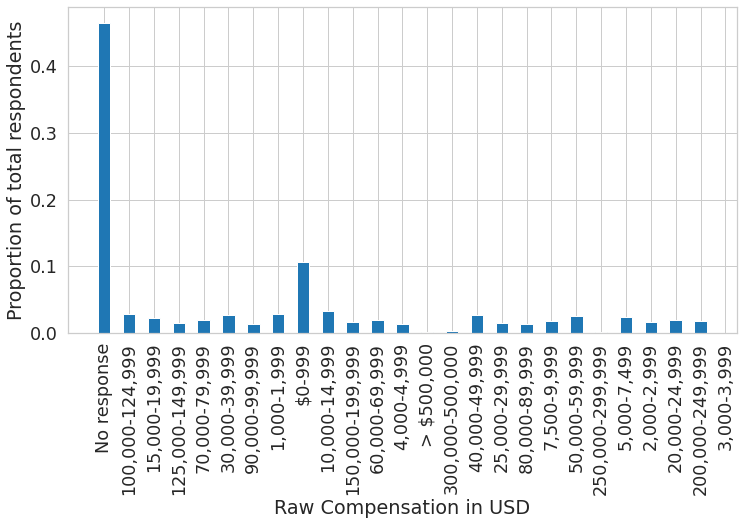

In [53]:
comp = df['Q24']
fig = plt.figure(figsize=(12,6))
_ = plt.hist(x=comp, bins=comp.unique(), density=True, rwidth=0.5, align='left')
_ = plt.xticks(rotation=90)
_ = plt.xlabel('Raw Compensation in USD')
_ = plt.ylabel('Proportion of total respondents')

In [54]:
comp1 = comp[df['Q24'] != 'No response']

le_comp = {
    '100,000-124,999': (100000 + 124999) // 2,
    '15,000-19,999': (15000 + 19999) // 2,
    '125,000-149,999': (125000 + 149999) // 2,
    '70,000-79,999': (70000 + 79999) // 2,
    '30,000-39,999': (30000 + 39999) // 2,
    '90,000-99,999': (90000 + 99999) // 2,
    '1,000-1,999': (1000 + 1999) // 2,
    '$0-999': 999 // 2,
    '10,000-14,999': (10000 + 14999) // 2,
    '150,000-199,999': (150000 + 199999) // 2,
    '60,000-69,999': (60000 + 69999) // 2,
    '4,000-4,999': (4000 + 4999) // 2, 
    '> $500,000': 500000, 
    '300,000-500,000': (300000 + 500000) // 2, 
    '40,000-49,999': (40000 + 49999) // 2,
    '25,000-29,999': (25000 + 29999) // 2, 
    '80,000-89,999': (80000 + 89999) // 2, 
    '7,500-9,999': (7500 + 9999) // 2, 
    '50,000-59,999': (50000 + 59999) // 2,
    '250,000-299,999': (250000 + 299999) // 2, 
    '5,000-7,499': (5000 + 7499) // 2, 
    '2,000-2,999': (2000 + 2999) // 2, 
    '20,000-24,999': (20000 + 24999) // 2,
    '200,000-249,999': (200000 + 249999) // 2, 
    '3,000-3,999': (3000 + 3999) // 2
}

comp_mean = comp1.replace(le_comp)

comp_adj = comp_mean.copy()
countries_for_comp = countries.loc[comp_mean.index]


for idx in comp_mean.index:
    country = countries_for_comp.loc[idx].strip('.')
    ratio_to_apply = float(ppp['ratio'].loc[ppp['country'] == country].squeeze())
    
    raw_comp = float(comp_mean.loc[idx])
    adjusted_comp = raw_comp * ratio_to_apply
    
    comp_adj.loc[idx] = adjusted_comp
    comp_mean.loc[idx] = raw_comp



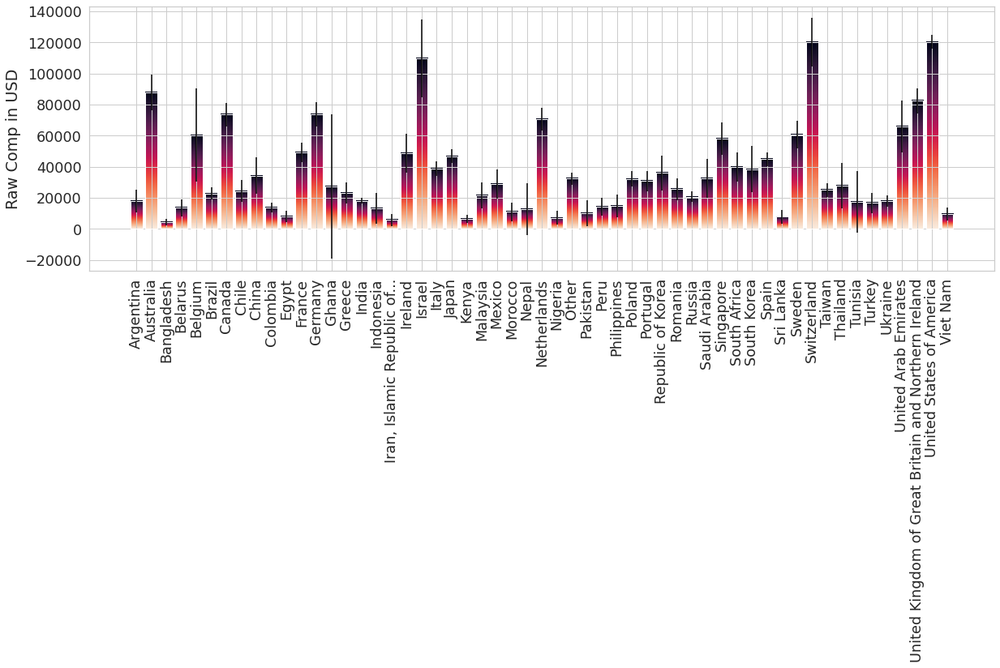

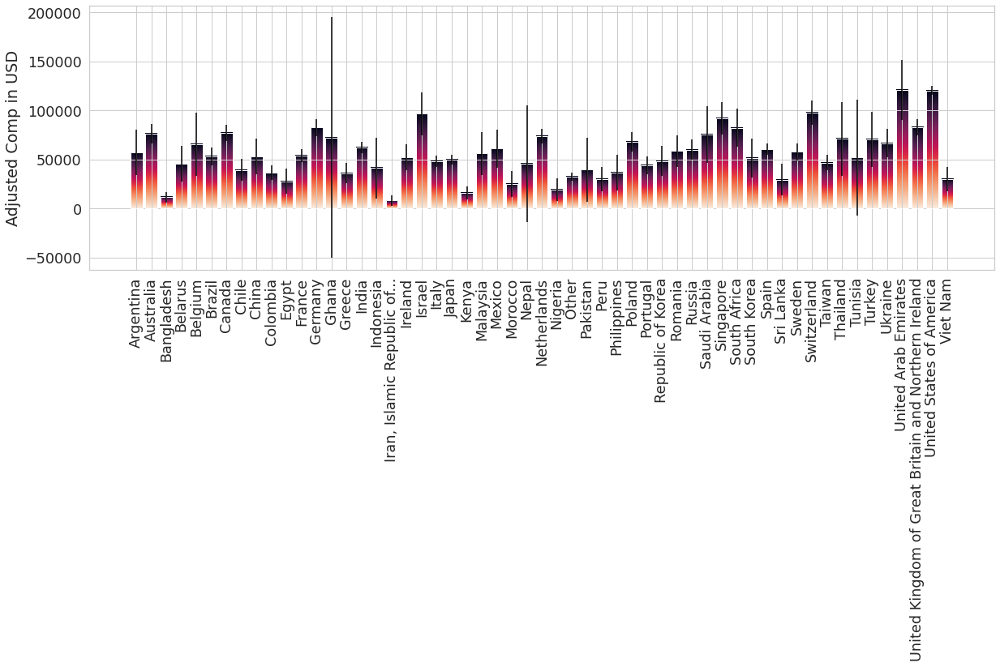

In [55]:
countries_and_comp_raw = pd.concat([countries_for_comp.to_frame('Country'), comp_mean.to_frame('Raw Compensation')], axis=1)
countries_and_comp_adj = pd.concat([countries_for_comp.to_frame('Country'), comp_adj.to_frame('Adjusted Compensation')], axis=1)

sr1 = countries_and_comp_raw.groupby('Country').mean()
sr2 = countries_and_comp_raw.groupby('Country').std()
sr3 = countries_and_comp_raw.groupby('Country').size()
ci = []
for country in sr3.index:
    n = sr3.loc[country]
    sigma = sr2.loc[country].squeeze()
    z = 1.96
    ci.append(z * sigma / np.sqrt(n))
    
fig = plt.figure(figsize=(20,6))
bar = plt.bar(x=sr1.index, height=sr1['Raw Compensation'], yerr=ci)
gradientbars(bar)
_ = plt.xticks(rotation = 90)
_ = plt.ylabel('Raw Comp in USD')


sr1 = countries_and_comp_adj.groupby('Country').mean()
sr2 = countries_and_comp_adj.groupby('Country').std()
sr3 = countries_and_comp_adj.groupby('Country').size()
ci = []
for country in sr3.index:
    n = sr3.loc[country]
    sigma = sr2.loc[country].squeeze()
    z = 1.96
    ci.append(z * sigma / np.sqrt(n))


fig = plt.figure(figsize=(20,6))
bar = plt.bar(x=sr1.index, height=sr1['Adjusted Compensation'], yerr=ci)
gradientbars(bar)
_ = plt.xticks(rotation = 90)
_ = plt.ylabel('Adjusted Comp in USD')

<AxesSubplot:>

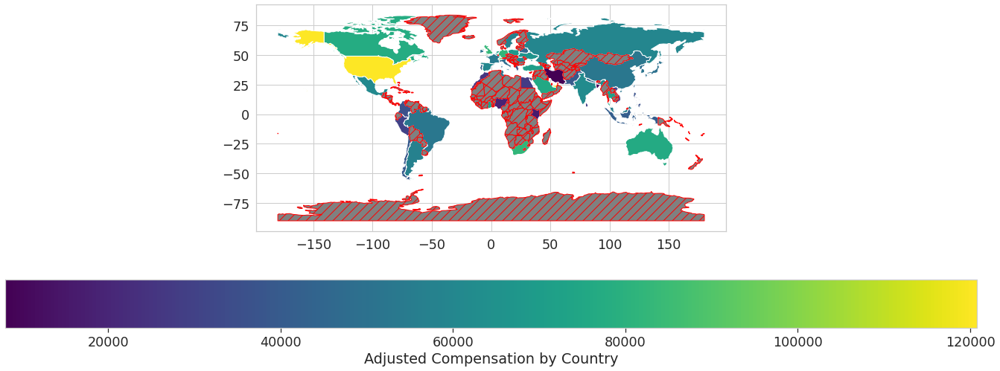

In [77]:
to_replace = {
    'United Kingdom of Great Britain and Northern Ireland': 'United Kingdom',
    'Iran, Islamic Republic of...': 'Iran',
    'Republic of Korea': 'North Korea',
    'Viet Nam': 'Vietnam',
}
dd = collections.defaultdict
sr_comp = sr1.copy()
sr_comp = sr_comp.reset_index().replace(to_replace)

world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))
#sr_comp.head()

merged = world.merge(sr_comp, left_on='name', right_on='Country', how='left')
#merged.fillna('No data', inplace = True)

merged.plot(figsize=(30,8), column='Adjusted Compensation', legend=True, cmap='viridis',
            legend_kwds={'label': "Adjusted Compensation by Country", 'orientation': "horizontal"},
            missing_kwds={"color": "grey", "edgecolor": "red", "hatch": "//", "label": "Missing values"}
            )

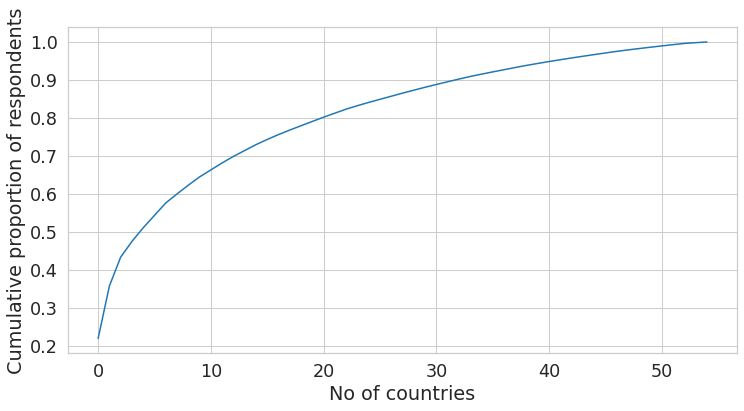

In [78]:
country_counts = pd.Series(collections.Counter(countries_for_comp)).sort_values(ascending=False)
fig = plt.figure(figsize=(12,6))
_ = plt.plot(np.arange(len(country_counts)), country_counts.cumsum() / country_counts.sum())
_ = plt.xlabel('No of countries')
_ = plt.ylabel('Cumulative proportion of respondents')

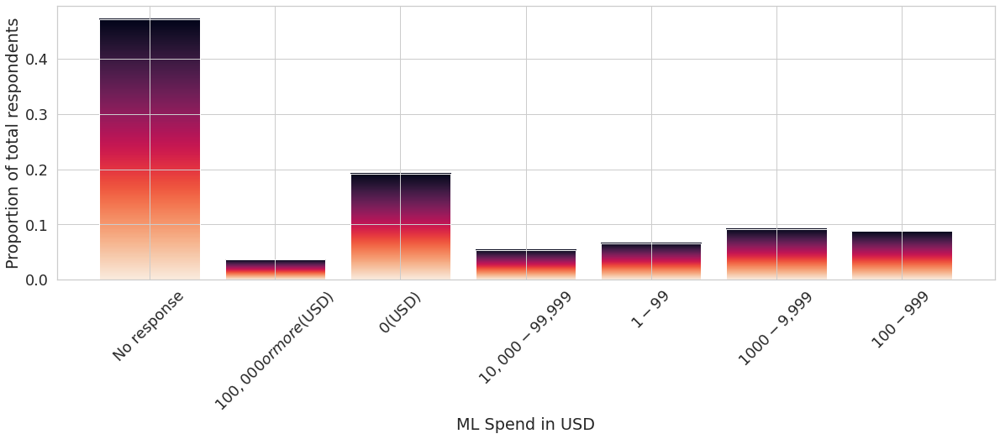

In [56]:
ml_spend = df['Q25']

sr = pd.Series(collections.Counter(ml_spend))

fig = plt.figure(figsize=(20,6))
bar = plt.bar(sr.index, sr / sr.sum(), )
gradientbars(bar)
_ = plt.xticks(rotation=45)
_ = plt.xlabel('ML Spend in USD')
_ = plt.ylabel('Proportion of total respondents')

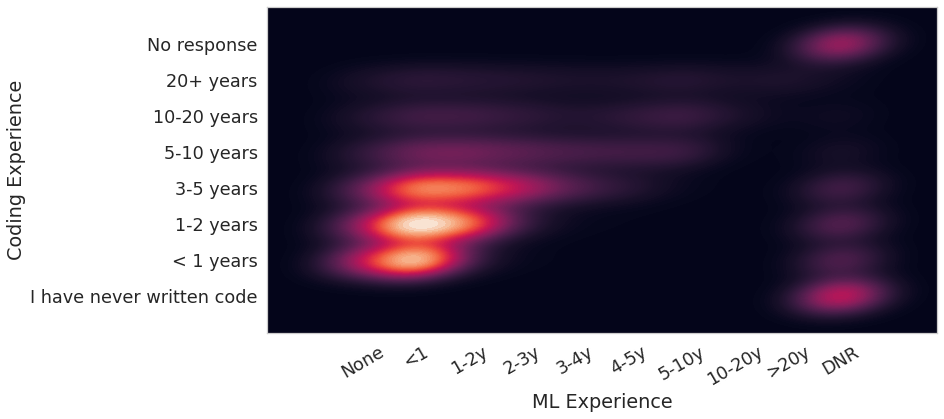

In [69]:
le_x = {
    '1-2 years': 2,
    '10-20 years': 7,
    '2-3 years': 3,
    '20 or more years': 8,
    '3-4 years': 4,
    '4-5 years': 5,
    '5-10 years': 6,
    'I do not use machine learning methods': 0,
    'No response': 9,
    'Under 1 year': 1,
}

le_x_label = {
    '1-2y': 2,
    '10-20y': 7,
    '2-3y': 3,
    '>20y': 8,
    '3-4y': 4,
    '4-5y': 5,
    '5-10y': 6,
    'None': 0,
    'DNR': 9,
    '<1': 1,
}

le_y = {
    '1-2 years': 2,
    '10-20 years': 5,
    '20+ years': 6,
    '3-5 years': 3,
    '5-10 years': 4,
    '< 1 years': 1,
    'I have never written code': 0,
    'No response': 7,
}


ax = sns.kdeplot(x=exp_ml.replace(le_x), y=exp_coding.replace(le_y), fill=True, thresh=0, levels=100, cmap='rocket')
_ = plt.xticks(ticks=list(le_x_label.values()), labels=list(le_x_label.keys()), rotation=30)
_ = plt.yticks(ticks=list(le_y.values()), labels=list(le_y.keys()))
ax.figure.set_size_inches((12, 6))
ax.set_ylabel('Coding Experience')
_ = ax.set_xlabel('ML Experience')

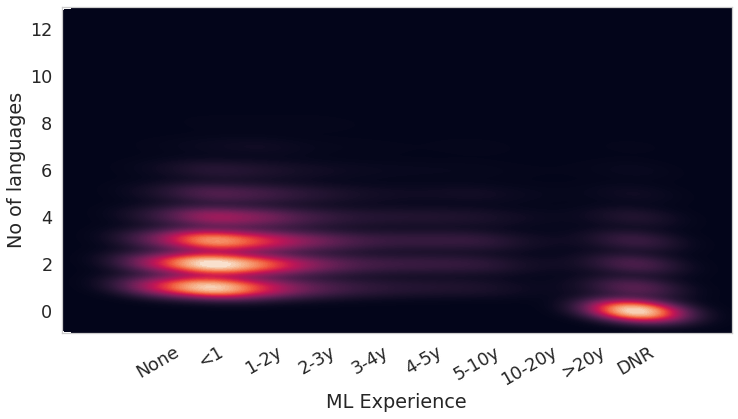

In [109]:
le_x = {
    '1-2 years': 2,
    '10-20 years': 7,
    '2-3 years': 3,
    '20 or more years': 8,
    '3-4 years': 4,
    '4-5 years': 5,
    '5-10 years': 6,
    'I do not use machine learning methods': 0,
    'No response': 9,
    'Under 1 year': 1,
}

le_x_label = {
    '1-2y': 2,
    '10-20y': 7,
    '2-3y': 3,
    '>20y': 8,
    '3-4y': 4,
    '4-5y': 5,
    '5-10y': 6,
    'None': 0,
    'DNR': 9,
    '<1': 1,
}

ax = sns.kdeplot(x=exp_ml.replace(le_x), y=df['no_of_langs'], fill=True, thresh=0, levels=100, cmap='rocket')
_ = plt.xticks(ticks=list(le_x_label.values()), labels=list(le_x_label.keys()), rotation=30)

ax.figure.set_size_inches((12, 6))
ax.set_ylabel('No of languages')
_ = ax.set_xlabel('ML Experience')

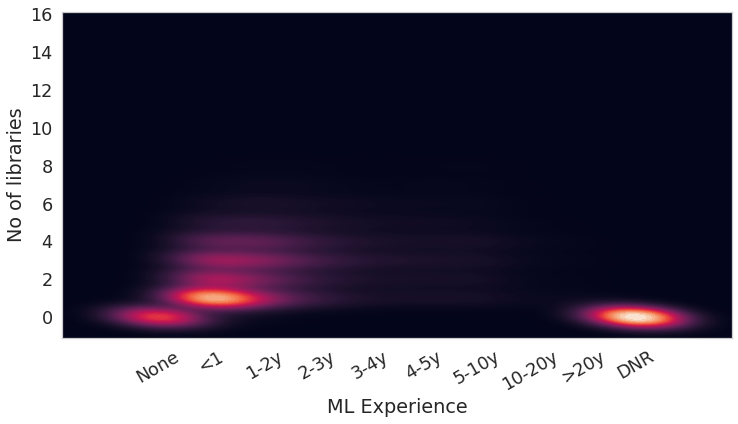

In [112]:
le_x = {
    '1-2 years': 2,
    '10-20 years': 7,
    '2-3 years': 3,
    '20 or more years': 8,
    '3-4 years': 4,
    '4-5 years': 5,
    '5-10 years': 6,
    'I do not use machine learning methods': 0,
    'No response': 9,
    'Under 1 year': 1,
}

le_x_label = {
    '1-2y': 2,
    '10-20y': 7,
    '2-3y': 3,
    '>20y': 8,
    '3-4y': 4,
    '4-5y': 5,
    '5-10y': 6,
    'None': 0,
    'DNR': 9,
    '<1': 1,
}

ax = sns.kdeplot(x=exp_ml.replace(le_x), y=df['no_of_ml_libs'], fill=True, thresh=0, levels=100, cmap='rocket')
_ = plt.xticks(ticks=list(le_x_label.values()), labels=list(le_x_label.keys()), rotation=30)

ax.figure.set_size_inches((12, 6))
ax.set_ylabel('No of libraries')
_ = ax.set_xlabel('ML Experience')

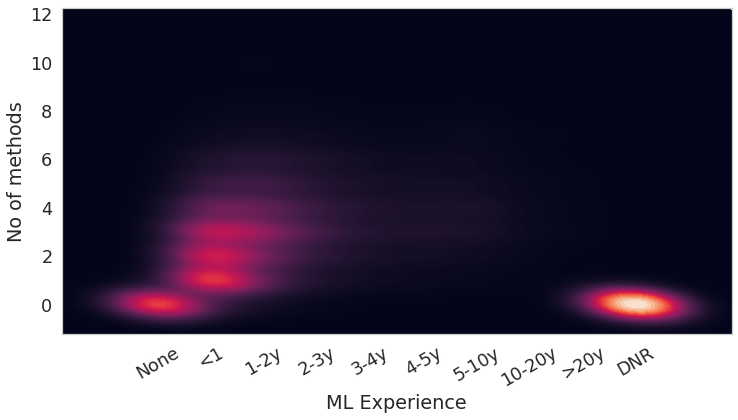

In [44]:
le_x = {
    '1-2 years': 2,
    '10-20 years': 7,
    '2-3 years': 3,
    '20 or more years': 8,
    '3-4 years': 4,
    '4-5 years': 5,
    '5-10 years': 6,
    'I do not use machine learning methods': 0,
    'No response': 9,
    'Under 1 year': 1,
}

le_x_label = {
    '1-2y': 2,
    '10-20y': 7,
    '2-3y': 3,
    '>20y': 8,
    '3-4y': 4,
    '4-5y': 5,
    '5-10y': 6,
    'None': 0,
    'DNR': 9,
    '<1': 1,
}

ax = sns.kdeplot(x=exp_ml.replace(le_x), y=df['no_of_ml_methods'], fill=True, thresh=0, levels=100, cmap='rocket')
_ = plt.xticks(ticks=list(le_x_label.values()), labels=list(le_x_label.keys()), rotation=30)

ax.figure.set_size_inches((12, 6))
ax.set_ylabel('No of methods')
_ = ax.set_xlabel('ML Experience')

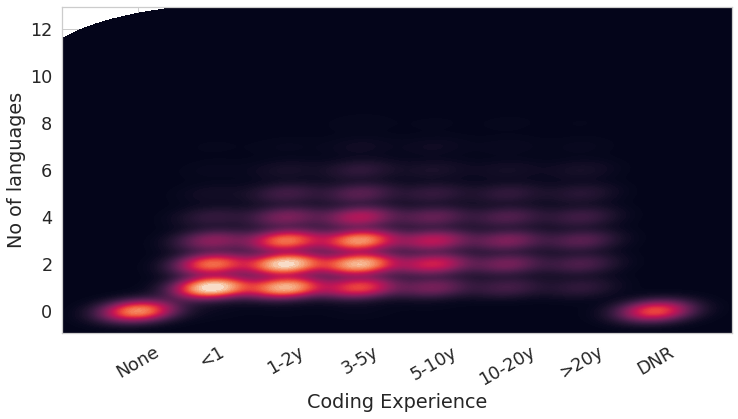

In [71]:
le_x = {
    '1-2 years': 2,
    '10-20 years': 5,
    '20+ years': 6,
    '3-5 years': 3,
    '5-10 years': 4,
    '< 1 years': 1,
    'I have never written code': 0,
    'No response': 7,
    
}

le_x_label = {
    '1-2y': 2,
    '10-20y': 5,
    '>20y': 6,
    '3-5y': 3,
    '5-10y': 4,
    '<1': 1,
    'None': 0,
    'DNR': 7,
    
}

ax = sns.kdeplot(x=exp_coding.replace(le_x), y=df['no_of_langs'], fill=True, thresh=0, levels=100, cmap='rocket')
_ = plt.xticks(ticks=list(le_x_label.values()), labels=list(le_x_label.keys()), rotation=30)

ax.figure.set_size_inches((12, 6))
ax.set_ylabel('No of languages')
_ = ax.set_xlabel('Coding Experience')

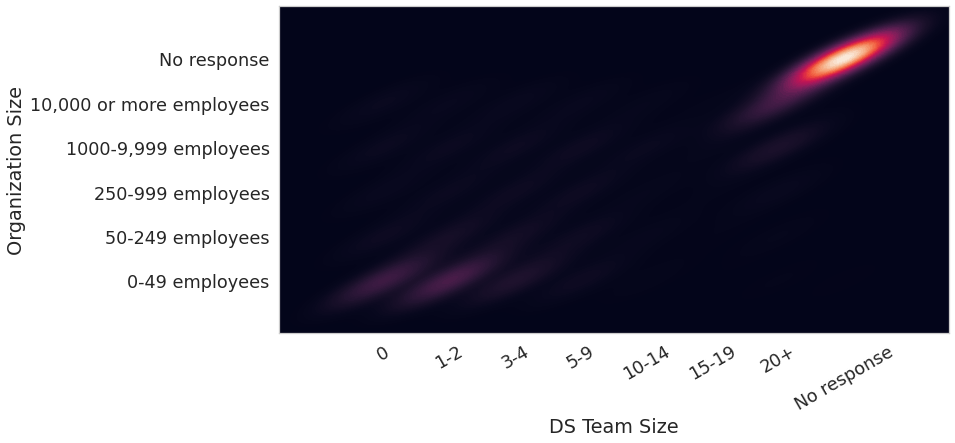

In [72]:
le_x = {
    '0': 0,
    '1-2': 1,
    '10-14': 4,
    '15-19': 5,
    '20+': 6,
    '3-4': 2,
    '5-9': 3,
    'No response': 7,
}

le_y = {
    '0-49 employees': 0, 
    '10,000 or more employees': 4,
    '1000-9,999 employees': 3, 
    '250-999 employees': 2, 
    '50-249 employees': 1,
    'No response': 5,
}


ax = sns.kdeplot(x=ds_team.replace(le_x), y=org_size.replace(le_y), fill=True, thresh=0, levels=100, cmap='rocket')
_ = plt.xticks(ticks=list(le_x.values()), labels=list(le_x.keys()), rotation=30)
_ = plt.yticks(ticks=list(le_y.values()), labels=list(le_y.keys()))
ax.figure.set_size_inches((12, 6))
ax.set_ylabel('Organization Size')
_ = ax.set_xlabel('DS Team Size')

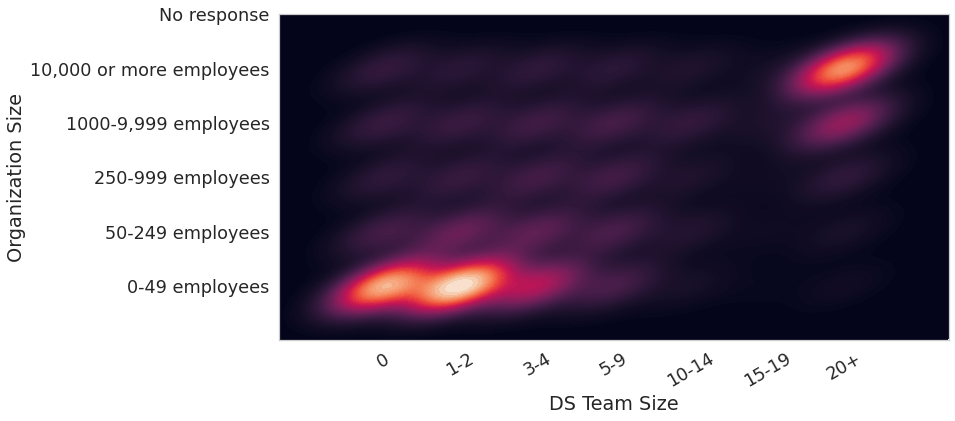

In [73]:
ds_team1 = ds_team.loc[ds_team.values != 'No response']
org_size1 = org_size.loc[ds_team1.index]

le_x = {
    '0': 0,
    '1-2': 1,
    '10-14': 4,
    '15-19': 5,
    '20+': 6,
    '3-4': 2,
    '5-9': 3,
}

le_y = {
    '0-49 employees': 0, 
    '10,000 or more employees': 4,
    '1000-9,999 employees': 3, 
    '250-999 employees': 2, 
    '50-249 employees': 1,
    'No response': 5,
}

ax = sns.kdeplot(x=ds_team1.replace(le_x), y=org_size1.replace(le_y), fill=True, thresh=0, levels=100, cmap='rocket')
_ = plt.xticks(ticks=list(le_x.values()), labels=list(le_x.keys()), rotation=30)
_ = plt.yticks(ticks=list(le_y.values()), labels=list(le_y.keys()))
ax.figure.set_size_inches((12, 6))
ax.set_ylabel('Organization Size')
_ = ax.set_xlabel('DS Team Size')

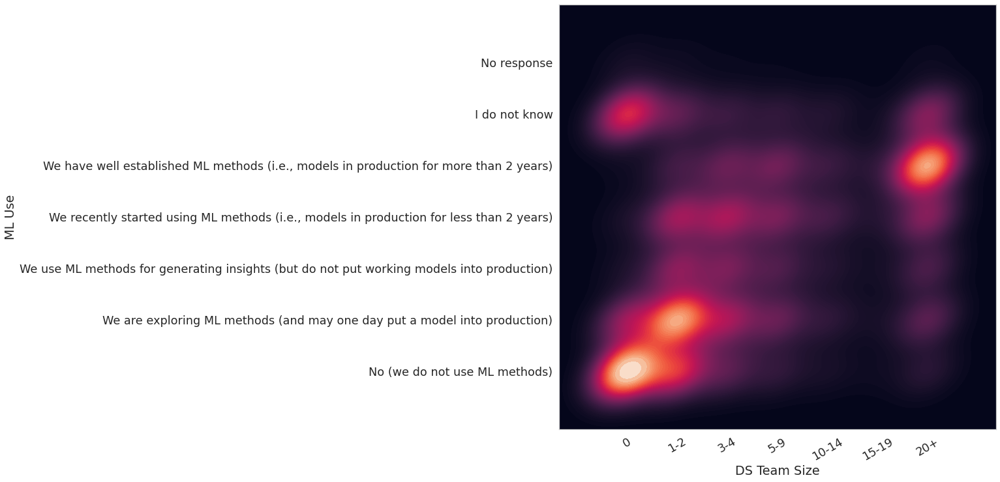

In [74]:
ds_team1 = ds_team.loc[ds_team.values != 'No response']
ml_use1 = ml_use.loc[ds_team1.index]

le_x = {
    '0': 0,
    '1-2': 1,
    '10-14': 4,
    '15-19': 5,
    '20+': 6,
    '3-4': 2,
    '5-9': 3,
}

le_y = {
    'I do not know': 5,
    'No (we do not use ML methods)': 0, 
    'No response': 6,
    'We are exploring ML methods (and may one day put a model into production)': 1,
    'We have well established ML methods (i.e., models in production for more than 2 years)': 4,
    'We recently started using ML methods (i.e., models in production for less than 2 years)': 3,
    'We use ML methods for generating insights (but do not put working models into production)': 2,
}

ax = sns.kdeplot(x=ds_team1.replace(le_x), y=ml_use1.replace(le_y), fill=True, thresh=0, levels=100, cmap='rocket')
_ = plt.xticks(ticks=list(le_x.values()), labels=list(le_x.keys()), rotation=30)
_ = plt.yticks(ticks=list(le_y.values()), labels=list(le_y.keys()))
ax.figure.set_size_inches((12, 12))
ax.set_ylabel('ML Use')
_ = ax.set_xlabel('DS Team Size')

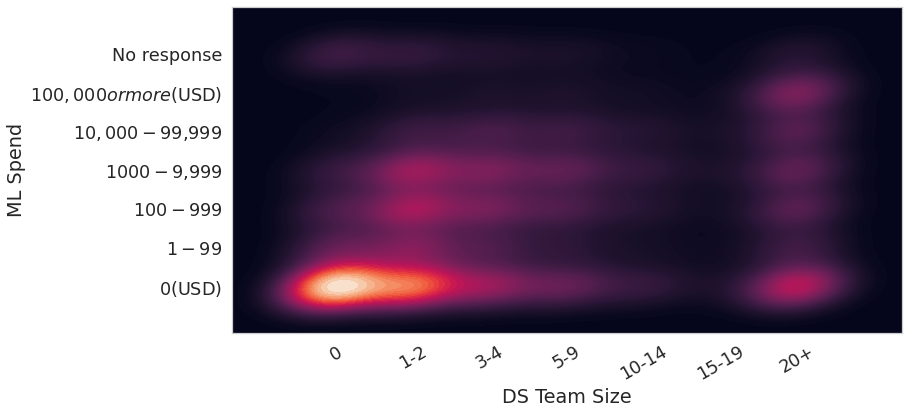

In [75]:
ds_team1 = ds_team.loc[ds_team.values != 'No response']
ml_spend1 = ml_spend.loc[ds_team1.index]

le_x = {
    '0': 0,
    '1-2': 1,
    '10-14': 4,
    '15-19': 5,
    '20+': 6,
    '3-4': 2,
    '5-9': 3,
}

le_y = {
    '$0 ($USD)': 0, 
    '$1-$99': 1, 
    '$10,000-$99,999': 4,
    '$100,000 or more ($USD)': 5, 
    '$100-$999': 2, 
    '$1000-$9,999': 3,
    'No response': 6
}

ax = sns.kdeplot(x=ds_team1.replace(le_x), y=ml_spend1.replace(le_y), fill=True, thresh=0, levels=100, cmap='rocket')
_ = plt.xticks(ticks=list(le_x.values()), labels=list(le_x.keys()), rotation=30)
_ = plt.yticks(ticks=list(le_y.values()), labels=list(le_y.keys()))
ax.figure.set_size_inches((12, 6))
ax.set_ylabel('ML Spend')
_ = ax.set_xlabel('DS Team Size')

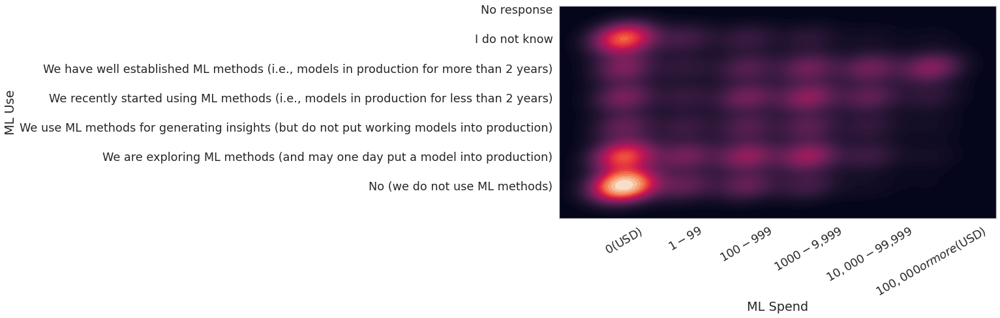

In [76]:
ml_spend1 = ml_spend.loc[ml_spend.values != 'No response']
ml_use1 = ml_use.loc[ml_spend1.index]

le_x = {
    '$0 ($USD)': 0, 
    '$1-$99': 1, 
    '$10,000-$99,999': 4,
    '$100,000 or more ($USD)': 5, 
    '$100-$999': 2, 
    '$1000-$9,999': 3,
}

le_y = {
    'I do not know': 5,
    'No (we do not use ML methods)': 0, 
    'No response': 6,
    'We are exploring ML methods (and may one day put a model into production)': 1,
    'We have well established ML methods (i.e., models in production for more than 2 years)': 4,
    'We recently started using ML methods (i.e., models in production for less than 2 years)': 3,
    'We use ML methods for generating insights (but do not put working models into production)': 2,
}

ax = sns.kdeplot(x=ml_spend1.replace(le_x), y=ml_use1.replace(le_y), fill=True, thresh=0, levels=100, cmap='rocket')
_ = plt.xticks(ticks=list(le_x.values()), labels=list(le_x.keys()), rotation=30)
_ = plt.yticks(ticks=list(le_y.values()), labels=list(le_y.keys()))
ax.figure.set_size_inches((12, 6))
ax.set_ylabel('ML Use')
_ = ax.set_xlabel('ML Spend')

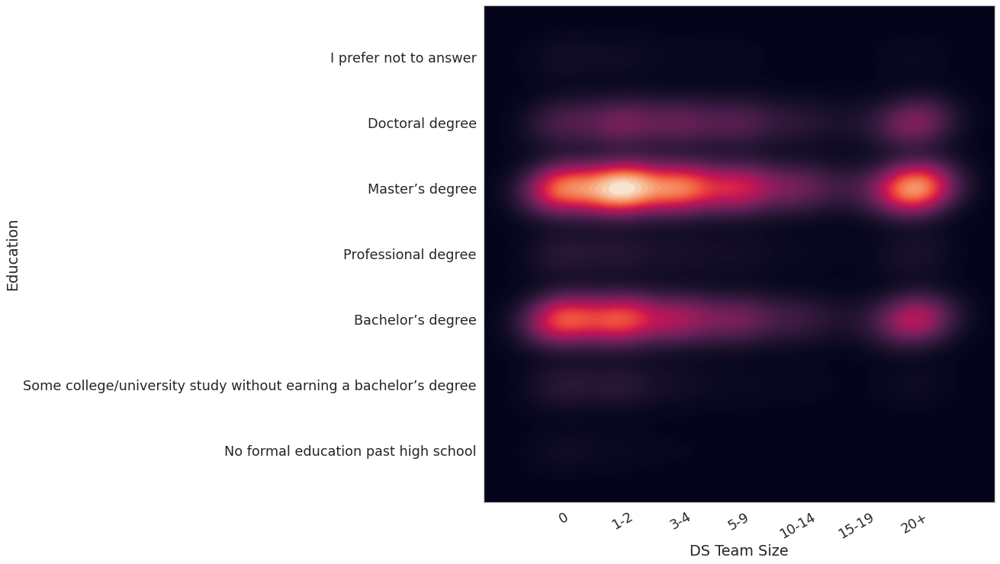

In [77]:
ds_team1 = ds_team.loc[ds_team.values != 'No response']
educ1 =educ.loc[ds_team1.index]

le_x = {
    '0': 0,
    '1-2': 1,
    '10-14': 4,
    '15-19': 5,
    '20+': 6,
    '3-4': 2,
    '5-9': 3,
}

le_y = {
    'Bachelor’s degree': 2, 
    'Doctoral degree': 5, 
    'I prefer not to answer': 6,
    'Master’s degree': 4, 
    'No formal education past high school': 0,
    'Professional degree': 3,
    'Some college/university study without earning a bachelor’s degree': 1,
}

ax = sns.kdeplot(x=ds_team1.replace(le_x), y=educ1.replace(le_y), fill=True, thresh=0, levels=100, cmap='rocket')
_ = plt.xticks(ticks=list(le_x.values()), labels=list(le_x.keys()), rotation=30)
_ = plt.yticks(ticks=list(le_y.values()), labels=list(le_y.keys()))
ax.figure.set_size_inches((12, 12))
ax.set_ylabel('Education')
_ = ax.set_xlabel('DS Team Size')

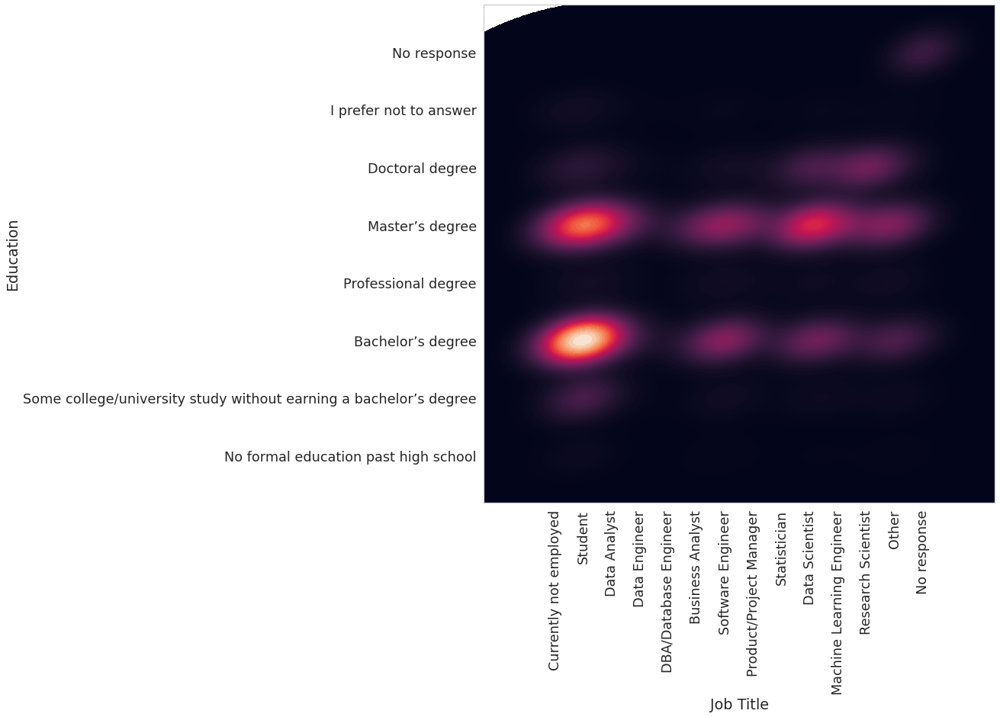

In [78]:
le_x = {
    'Business Analyst': 5, 
    'Currently not employed': 0,
    'DBA/Database Engineer': 4, 
    'Data Analyst': 2, 
    'Data Engineer': 3,
    'Data Scientist': 9, 
    'Machine Learning Engineer': 10, 
    'No response': 13,
    'Other': 12, 
    'Product/Project Manager': 7, 
    'Research Scientist': 11,
    'Software Engineer': 6, 
    'Statistician': 8, 
    'Student': 1,
}

le_y = {
    'Bachelor’s degree': 2, 
    'Doctoral degree': 5, 
    'I prefer not to answer': 6,
    'Master’s degree': 4, 
    'No formal education past high school': 0,
    'Professional degree': 3,
    'Some college/university study without earning a bachelor’s degree': 1,
    'No response': 7,
}

ax = sns.kdeplot(x=job.replace(le_x), y=educ.replace(le_y), fill=True, thresh=0, levels=100, cmap='rocket')
_ = plt.xticks(ticks=list(le_x.values()), labels=list(le_x.keys()), rotation=90)
_ = plt.yticks(ticks=list(le_y.values()), labels=list(le_y.keys()))
ax.figure.set_size_inches((12, 12))
ax.set_ylabel('Education')
_ = ax.set_xlabel('Job Title')

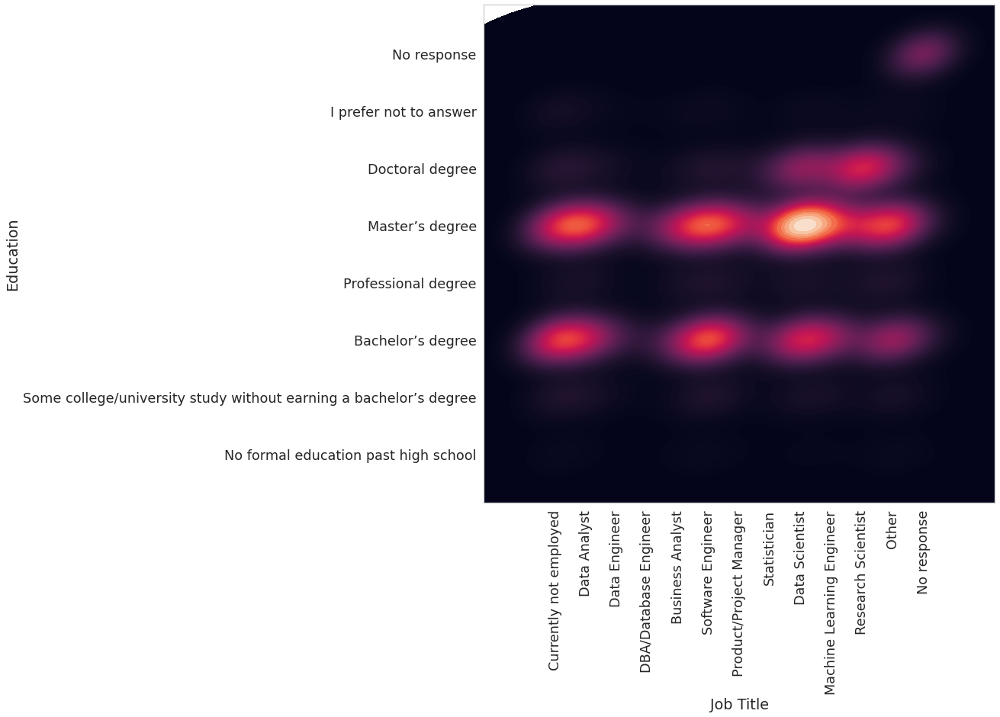

In [79]:
job1 = job.loc[job.values != 'Student']
educ1 =educ.loc[job1.index]

le_x = {
    'Business Analyst': 4, 
    'Currently not employed': 0,
    'DBA/Database Engineer': 3, 
    'Data Analyst': 1, 
    'Data Engineer': 2,
    'Data Scientist': 8, 
    'Machine Learning Engineer': 9, 
    'No response': 12,
    'Other': 11, 
    'Product/Project Manager': 6, 
    'Research Scientist': 10,
    'Software Engineer': 5, 
    'Statistician': 7, 
    
}

le_y = {
    'Bachelor’s degree': 2, 
    'Doctoral degree': 5, 
    'I prefer not to answer': 6,
    'Master’s degree': 4, 
    'No formal education past high school': 0,
    'Professional degree': 3,
    'Some college/university study without earning a bachelor’s degree': 1,
    'No response': 7,
}

ax = sns.kdeplot(x=job1.replace(le_x), y=educ1.replace(le_y), fill=True, thresh=0, levels=100, cmap='rocket')
_ = plt.xticks(ticks=list(le_x.values()), labels=list(le_x.keys()), rotation=90)
_ = plt.yticks(ticks=list(le_y.values()), labels=list(le_y.keys()))
ax.figure.set_size_inches((12, 12))
ax.set_ylabel('Education')
_ = ax.set_xlabel('Job Title')

# Products (cloud, ML, big data, business intelligence) (Q26 - Q35)

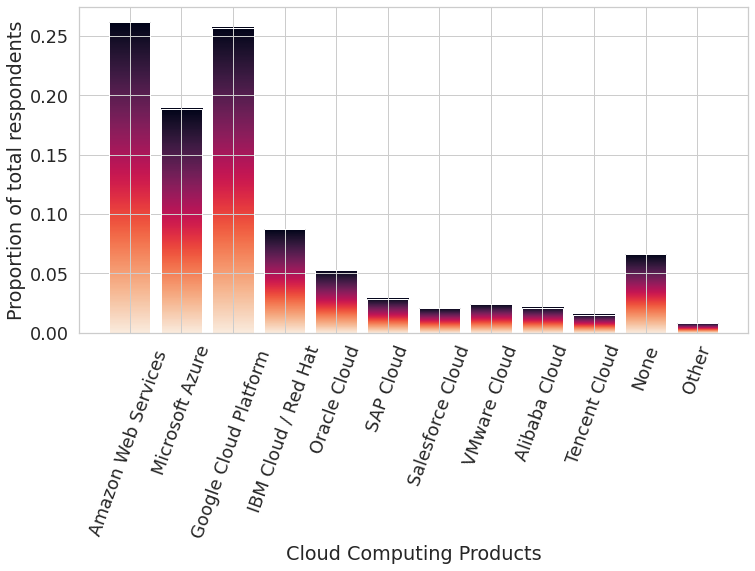

In [57]:
cloud_comp = aggregate_one_hot(df, 'Q26')

fig=plt.figure(figsize=(12,6))
bar = plt.bar(cloud_comp.index, cloud_comp.values)
gradientbars(bar)
_ = plt.xticks(rotation=70)
_ = plt.xlabel('Cloud Computing Products')
_ = plt.ylabel('Proportion of total respondents')

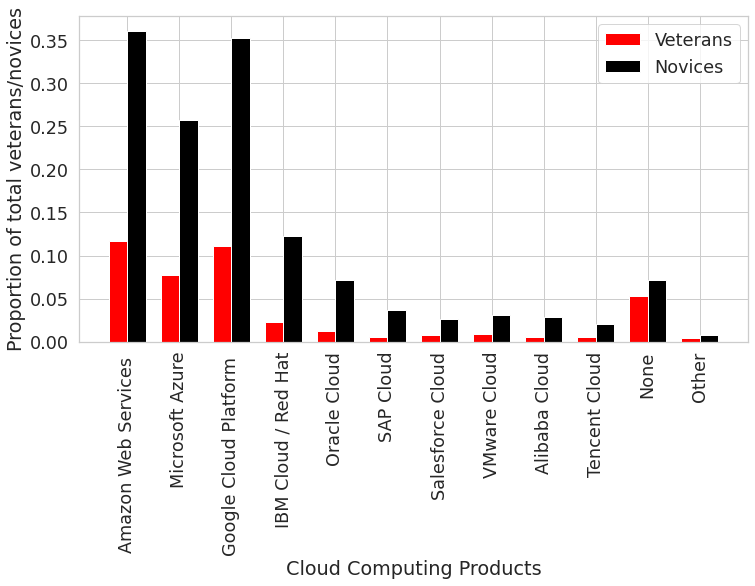

In [91]:
ML_veterans_cc = aggregate_one_hot(ML_veterans, 'Q26')
ML_novices_cc = aggregate_one_hot(ML_novices, 'Q26')

cc_df = pd.concat([ML_veterans_cc.to_frame('Veterans'), ML_novices_cc.to_frame('Novices')], axis=1)

labels = cc_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, cc_df['Veterans'].values, width, label='Veterans', color='r')
rects2 = ax.bar(x + width/2, cc_df['Novices'].values, width, label='Novices', color='k')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Cloud Computing Products')
_ = plt.ylabel('Proportion of total veterans/novices')

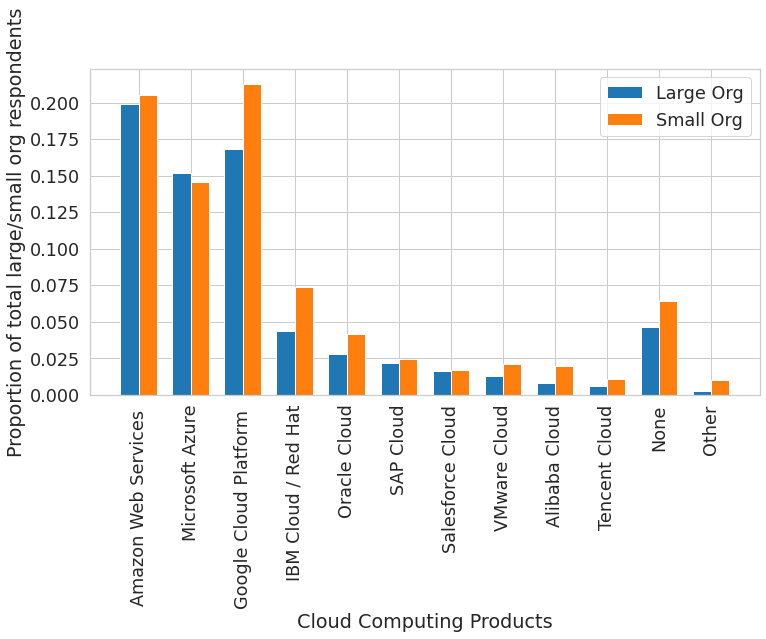

In [158]:
large_org_cc = aggregate_one_hot(large_org, 'Q26')
small_org_cc = aggregate_one_hot(small_org, 'Q26')

cc_df = pd.concat([large_org_cc.to_frame('Large Org'), small_org_cc.to_frame('Small Org')], axis=1)

labels = cc_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, cc_df['Large Org'].values, width, label='Large Org')
rects2 = ax.bar(x + width/2, cc_df['Small Org'].values, width, label='Small Org')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Cloud Computing Products')
_ = plt.ylabel('Proportion of total large/small org respondents')

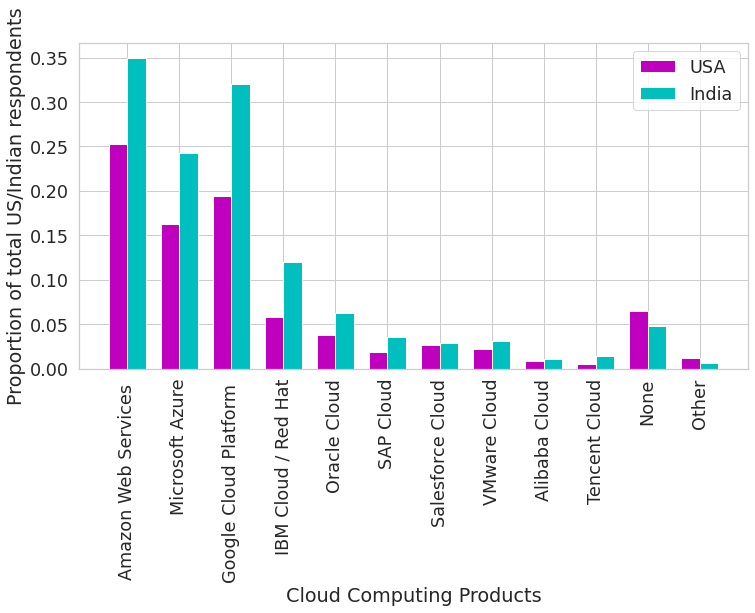

In [92]:
usa_cc = aggregate_one_hot(usa, 'Q26')
india_cc = aggregate_one_hot(india, 'Q26')

cc_df = pd.concat([usa_cc.to_frame('USA'), india_cc.to_frame('India')], axis=1)

labels = cc_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, cc_df['USA'].values, width, label='USA', color='m')
rects2 = ax.bar(x + width/2, cc_df['India'].values, width, label='India', color='c')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Cloud Computing Products')
_ = plt.ylabel('Proportion of total US/Indian respondents')

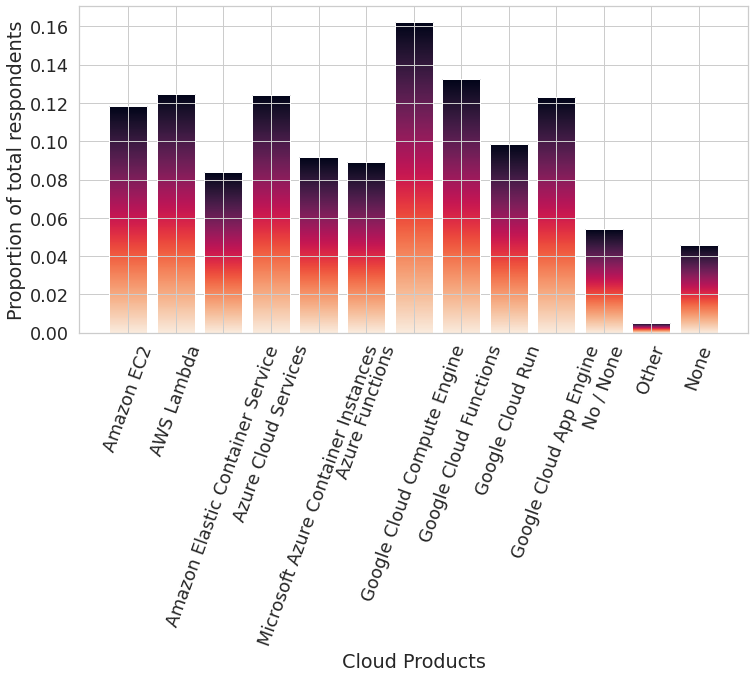

In [58]:
cloud_prod = aggregate_one_hot(df, 'Q27')

fig=plt.figure(figsize=(12,6))
bar = plt.bar(cloud_prod.index, cloud_prod.values)
gradientbars(bar)
_ = plt.xticks(rotation=70)
_ = plt.xlabel('Cloud Products')
_ = plt.ylabel('Proportion of total respondents')

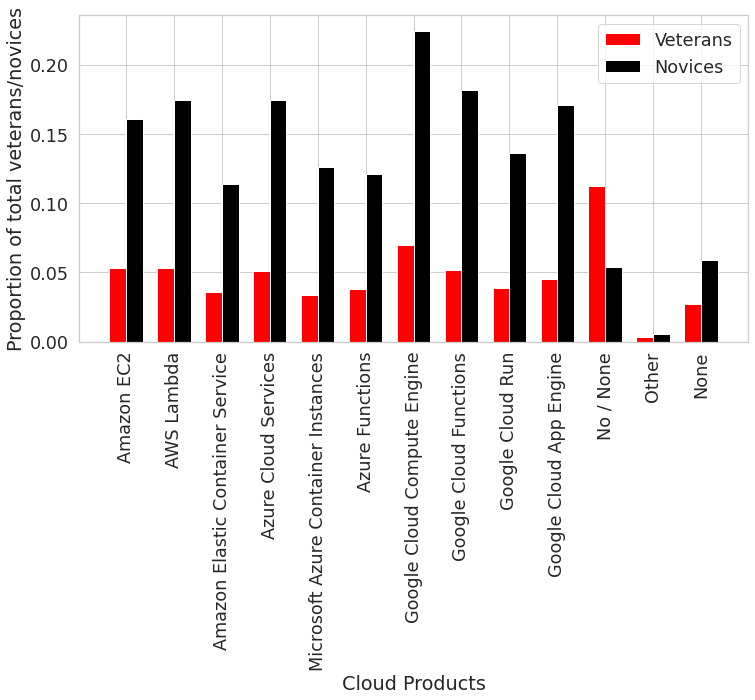

In [93]:
ML_veterans_cp = aggregate_one_hot(ML_veterans, 'Q27')
ML_novices_cp = aggregate_one_hot(ML_novices, 'Q27')

cp_df = pd.concat([ML_veterans_cp.to_frame('Veterans'), ML_novices_cp.to_frame('Novices')], axis=1)

labels = cp_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, cp_df['Veterans'].values, width, label='Veterans', color='r')
rects2 = ax.bar(x + width/2, cp_df['Novices'].values, width, label='Novices', color='k')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Cloud Products')
_ = plt.ylabel('Proportion of total veterans/novices')

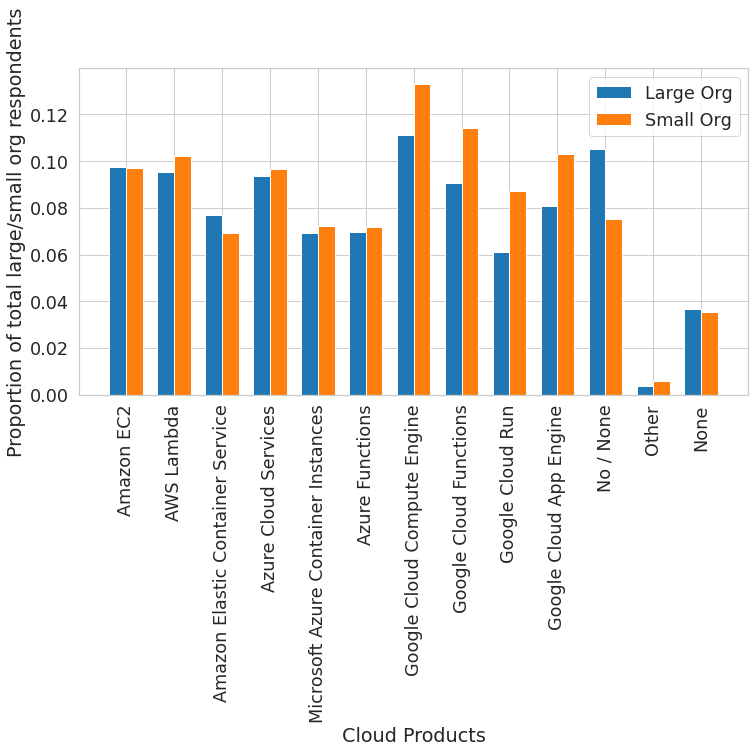

In [161]:
large_org_cp = aggregate_one_hot(large_org, 'Q27')
small_org_cp = aggregate_one_hot(small_org, 'Q27')

cp_df = pd.concat([large_org_cp.to_frame('Large Org'), small_org_cp.to_frame('Small Org')], axis=1)

labels = cp_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, cp_df['Large Org'].values, width, label='Large Org')
rects2 = ax.bar(x + width/2, cp_df['Small Org'].values, width, label='Small Org')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Cloud Products')
_ = plt.ylabel('Proportion of total large/small org respondents')

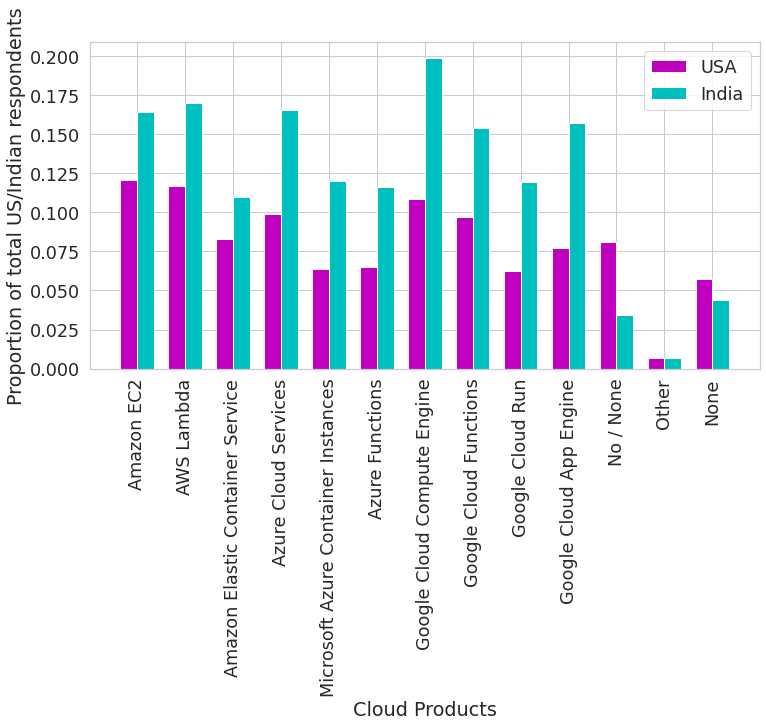

In [94]:
usa_cp = aggregate_one_hot(usa, 'Q27')
india_cp = aggregate_one_hot(india, 'Q27')

cp_df = pd.concat([usa_cp.to_frame('USA'), india_cp.to_frame('India')], axis=1)

labels = cp_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, cp_df['USA'].values, width, label='USA', color='m')
rects2 = ax.bar(x + width/2, cp_df['India'].values, width, label='India', color='c')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Cloud Products')
_ = plt.ylabel('Proportion of total US/Indian respondents')

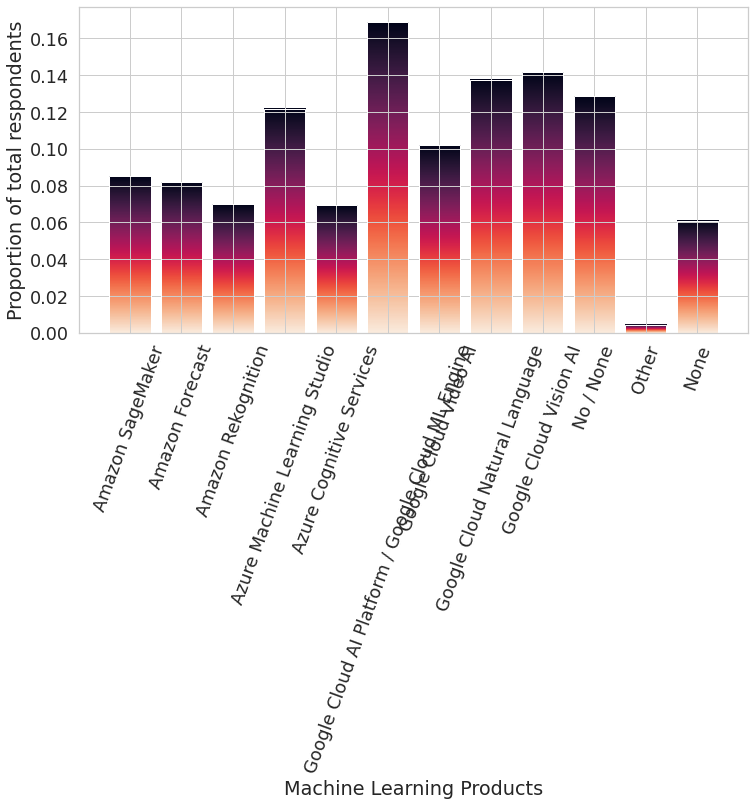

In [59]:
ml_prod = aggregate_one_hot(df, 'Q28')

fig=plt.figure(figsize=(12,6))
bar = plt.bar(ml_prod.index, ml_prod.values)
gradientbars(bar)
_ = plt.xticks(rotation=70)
_ = plt.xlabel('Machine Learning Products')
_ = plt.ylabel('Proportion of total respondents')

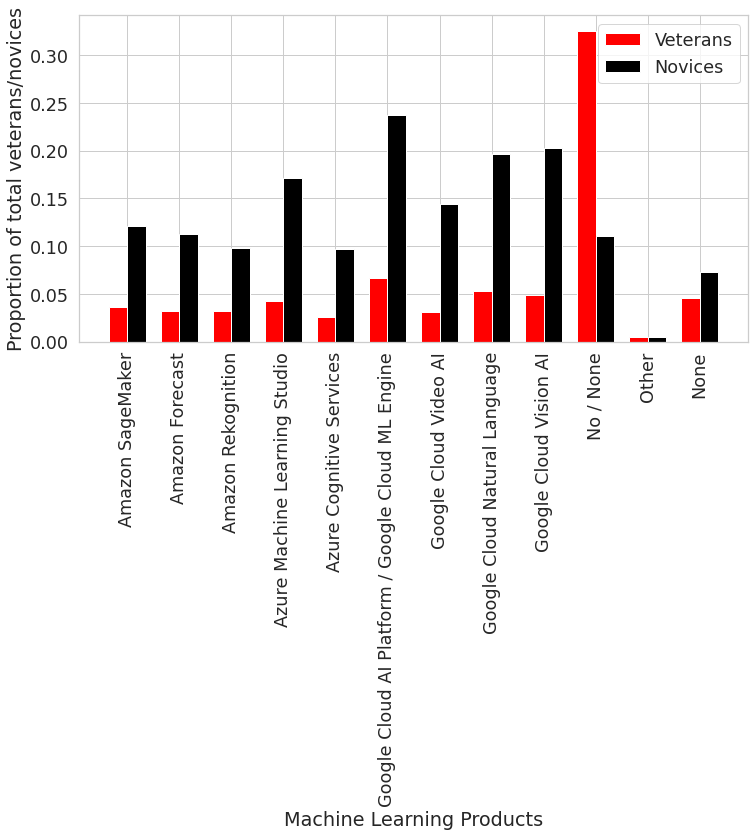

In [95]:
ML_veterans_mlprod = aggregate_one_hot(ML_veterans, 'Q28')
ML_novices_mlprod = aggregate_one_hot(ML_novices, 'Q28')

mlprod_df = pd.concat([ML_veterans_mlprod.to_frame('Veterans'), ML_novices_mlprod.to_frame('Novices')], axis=1)

labels = mlprod_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, mlprod_df['Veterans'].values, width, label='Veterans', color='r')
rects2 = ax.bar(x + width/2, mlprod_df['Novices'].values, width, label='Novices', color='k')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Machine Learning Products')
_ = plt.ylabel('Proportion of total veterans/novices')

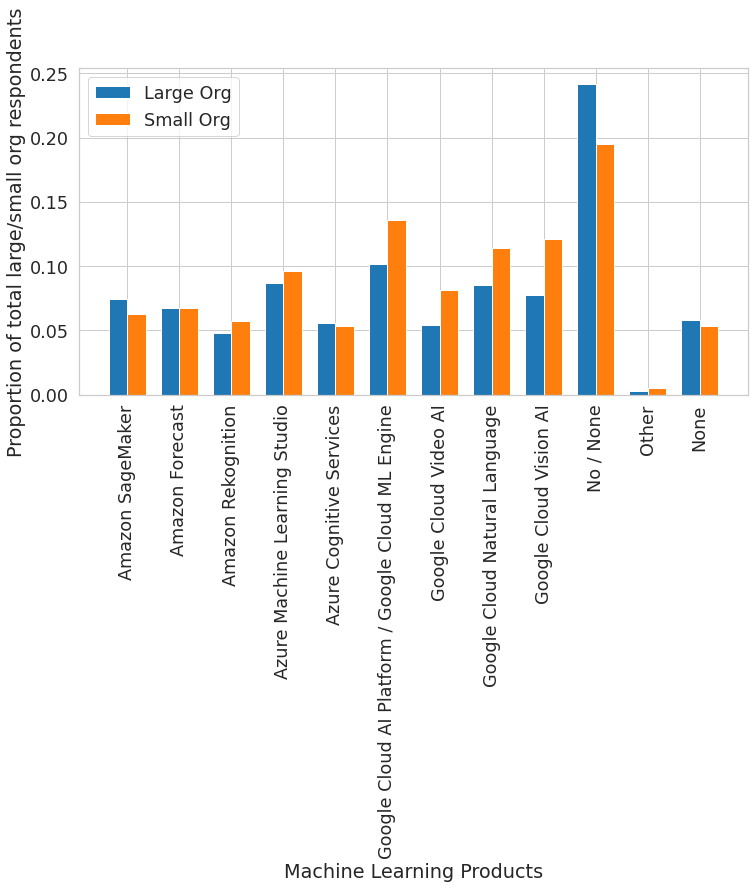

In [164]:
large_org_mlprod = aggregate_one_hot(large_org, 'Q28')
small_org_mlprod = aggregate_one_hot(small_org, 'Q28')

mlprod_df = pd.concat([large_org_mlprod.to_frame('Large Org'), small_org_mlprod.to_frame('Small Org')], axis=1)

labels = mlprod_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, mlprod_df['Large Org'].values, width, label='Large Org')
rects2 = ax.bar(x + width/2, mlprod_df['Small Org'].values, width, label='Small Org')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Machine Learning Products')
_ = plt.ylabel('Proportion of total large/small org respondents')

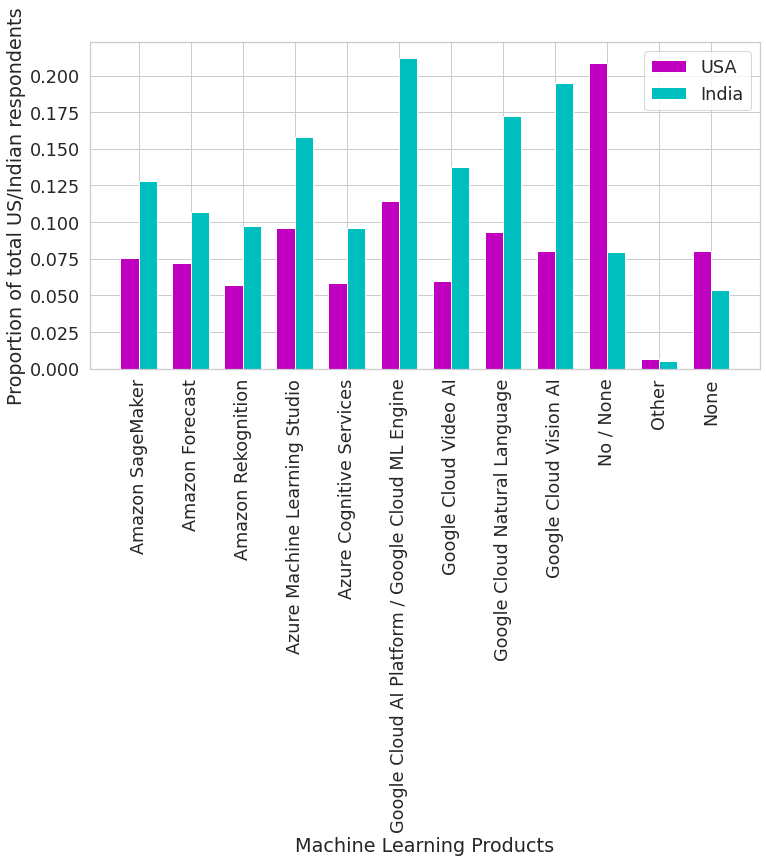

In [97]:
usa_mlprod = aggregate_one_hot(usa, 'Q28')
india_mlprod = aggregate_one_hot(india, 'Q28')

mlprod_df = pd.concat([usa_mlprod.to_frame('USA'), india_mlprod.to_frame('India')], axis=1)

labels = mlprod_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, mlprod_df['USA'].values, width, label='USA', color='m')
rects2 = ax.bar(x + width/2, mlprod_df['India'].values, width, label='India', color='c')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Machine Learning Products')
_ = plt.ylabel('Proportion of total US/Indian respondents')

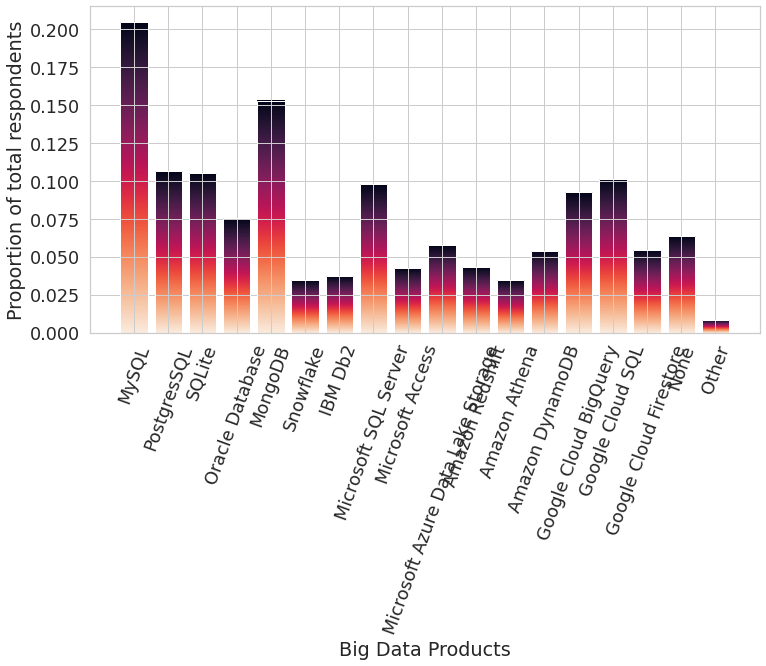

In [60]:
data = aggregate_one_hot(df, 'Q29')

fig=plt.figure(figsize=(12,6))
bar = plt.bar(data.index, data.values)
gradientbars(bar)
_ = plt.xticks(rotation=70)
_ = plt.xlabel('Big Data Products')
_ = plt.ylabel('Proportion of total respondents')

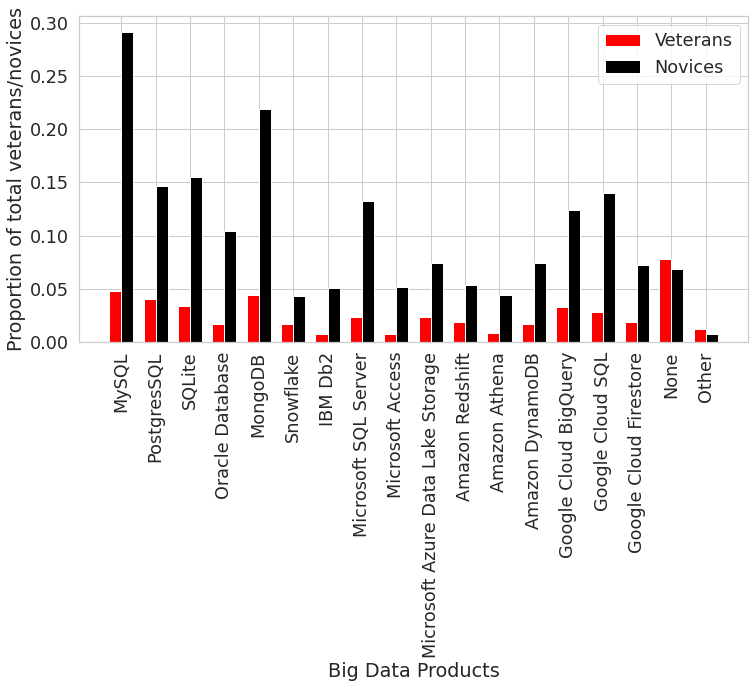

In [98]:
ML_veterans_data = aggregate_one_hot(ML_veterans, 'Q29')
ML_novices_data = aggregate_one_hot(ML_novices, 'Q29')

data_df = pd.concat([ML_veterans_data.to_frame('Veterans'), ML_novices_data.to_frame('Novices')], axis=1)

labels = data_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, data_df['Veterans'].values, width, label='Veterans', color='r')
rects2 = ax.bar(x + width/2, data_df['Novices'].values, width, label='Novices', color='k')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Big Data Products')
_ = plt.ylabel('Proportion of total veterans/novices')

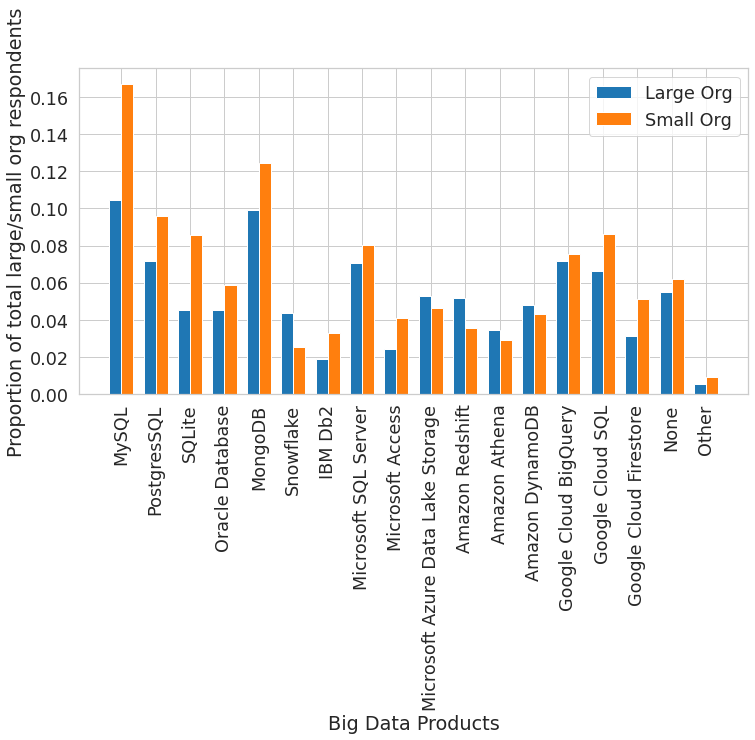

In [167]:
large_org_data = aggregate_one_hot(large_org, 'Q29')
small_org_data = aggregate_one_hot(small_org, 'Q29')

data_df = pd.concat([large_org_data.to_frame('Large Org'), small_org_data.to_frame('Small Org')], axis=1)

labels = data_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, data_df['Large Org'].values, width, label='Large Org')
rects2 = ax.bar(x + width/2, data_df['Small Org'].values, width, label='Small Org')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Big Data Products')
_ = plt.ylabel('Proportion of total large/small org respondents')

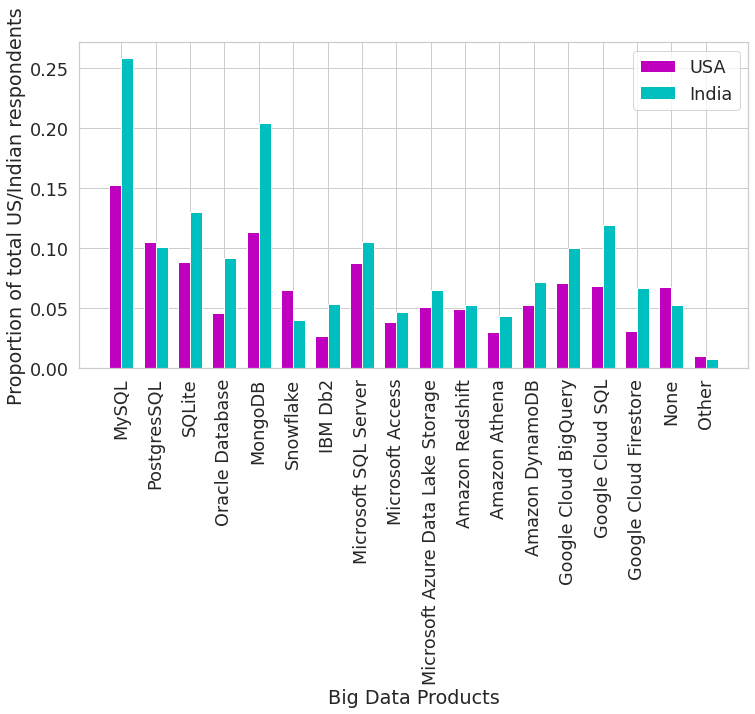

In [99]:
usa_data = aggregate_one_hot(usa, 'Q29')
india_data = aggregate_one_hot(india, 'Q29')

data_df = pd.concat([usa_data.to_frame('USA'), india_data.to_frame('India')], axis=1)

labels = data_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, data_df['USA'].values, width, label='USA', color='m')
rects2 = ax.bar(x + width/2, data_df['India'].values, width, label='India', color='c')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Big Data Products')
_ = plt.ylabel('Proportion of total US/Indian respondents')

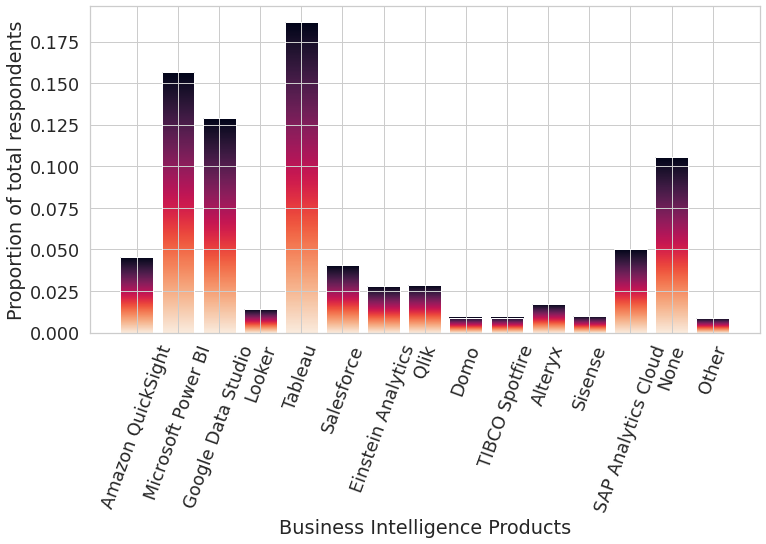

In [61]:
bi = aggregate_one_hot(df, 'Q31')

fig=plt.figure(figsize=(12,6))
bar = plt.bar(bi.index, bi.values)
gradientbars(bar)
_ = plt.xticks(rotation=70)
_ = plt.xlabel('Business Intelligence Products')
_ = plt.ylabel('Proportion of total respondents')

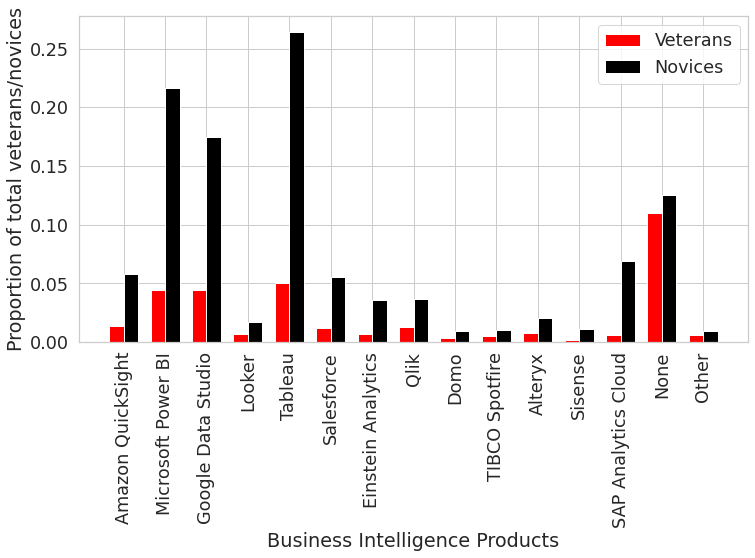

In [100]:
ML_veterans_bi = aggregate_one_hot(ML_veterans, 'Q31')
ML_novices_bi = aggregate_one_hot(ML_novices, 'Q31')

bi_df = pd.concat([ML_veterans_bi.to_frame('Veterans'), ML_novices_bi.to_frame('Novices')], axis=1)

labels = bi_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, bi_df['Veterans'].values, width, label='Veterans', color='r')
rects2 = ax.bar(x + width/2, bi_df['Novices'].values, width, label='Novices', color='k')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Business Intelligence Products')
_ = plt.ylabel('Proportion of total veterans/novices')

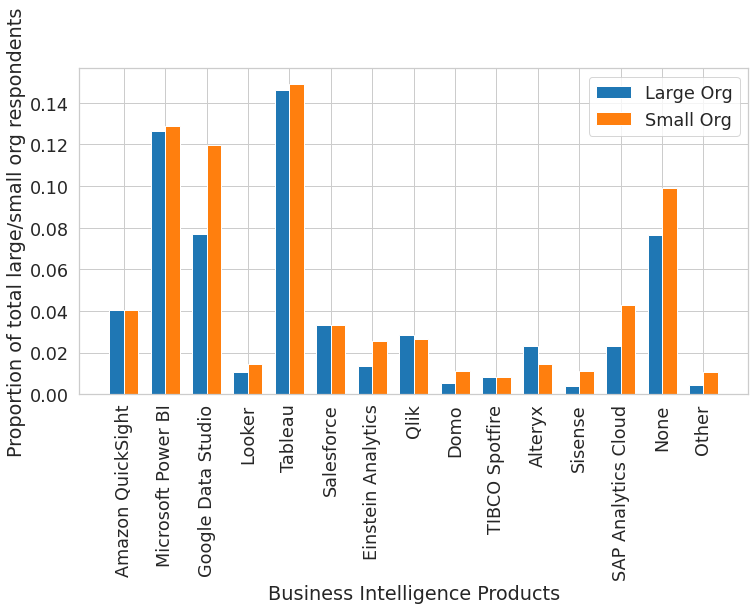

In [170]:
large_org_bi = aggregate_one_hot(large_org, 'Q31')
small_org_bi = aggregate_one_hot(small_org, 'Q31')

bi_df = pd.concat([large_org_bi.to_frame('Large Org'), small_org_bi.to_frame('Small Org')], axis=1)

labels = bi_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, bi_df['Large Org'].values, width, label='Large Org')
rects2 = ax.bar(x + width/2, bi_df['Small Org'].values, width, label='Small Org')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Business Intelligence Products')
_ = plt.ylabel('Proportion of total large/small org respondents')

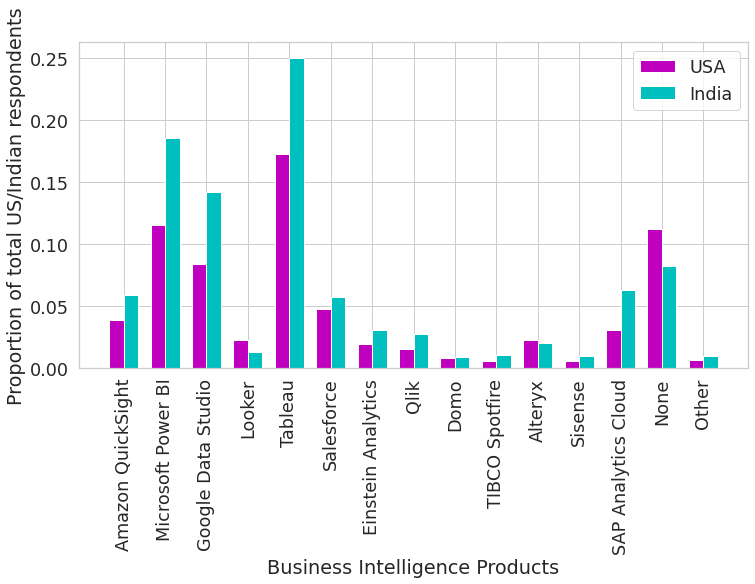

In [101]:
usa_bi = aggregate_one_hot(usa, 'Q31')
india_bi = aggregate_one_hot(india, 'Q31')

bi_df = pd.concat([usa_bi.to_frame('USA'), india_bi.to_frame('India')], axis=1)

labels = bi_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, bi_df['USA'].values, width, label='USA', color='m')
rects2 = ax.bar(x + width/2, bi_df['India'].values, width, label='India', color='c')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Business Intelligence Products')
_ = plt.ylabel('Proportion of total US/Indian respondents')

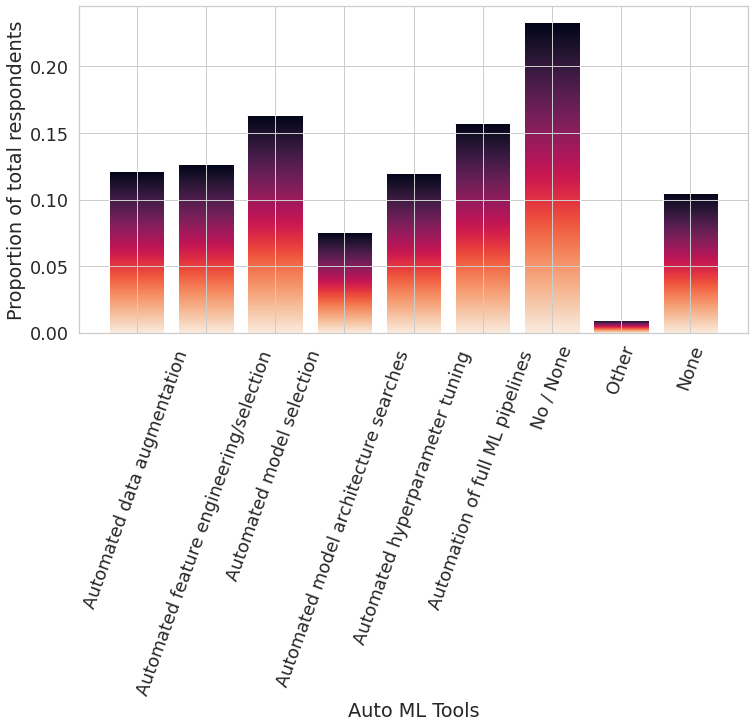

In [62]:
auto_ml = aggregate_one_hot(df, 'Q33')

fig=plt.figure(figsize=(12,6))
bar = plt.bar(auto_ml.index, auto_ml.values)
gradientbars(bar)
_ = plt.xticks(rotation=70)
_ = plt.xlabel('Auto ML Tools')
_ = plt.ylabel('Proportion of total respondents')

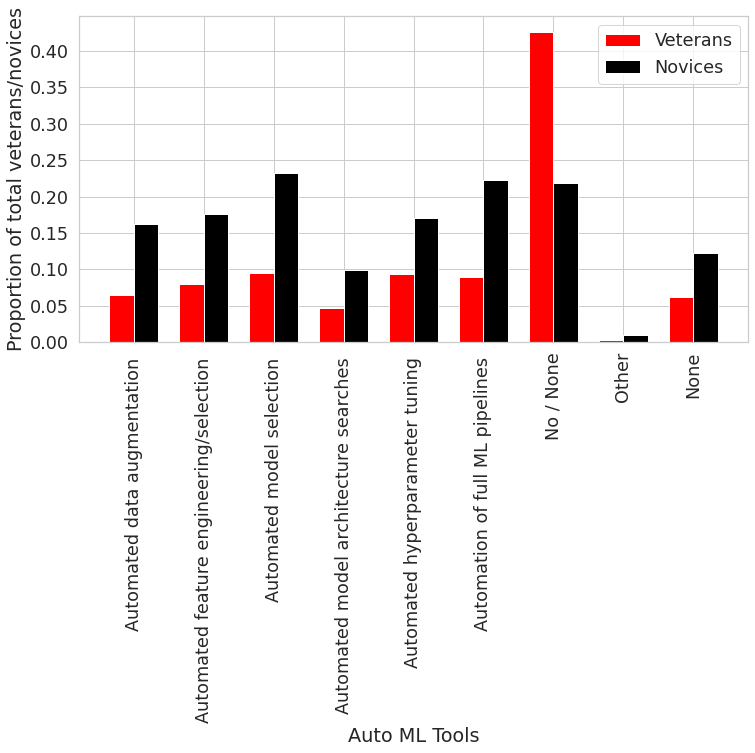

In [102]:
ML_veterans_auto_ml = aggregate_one_hot(ML_veterans, 'Q33')
ML_novices_auto_ml = aggregate_one_hot(ML_novices, 'Q33')

automl_df = pd.concat([ML_veterans_auto_ml.to_frame('Veterans'), ML_novices_auto_ml.to_frame('Novices')], axis=1)

labels = automl_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, automl_df['Veterans'].values, width, label='Veterans', color='r')
rects2 = ax.bar(x + width/2, automl_df['Novices'].values, width, label='Novices', color='k')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Auto ML Tools')
_ = plt.ylabel('Proportion of total veterans/novices')

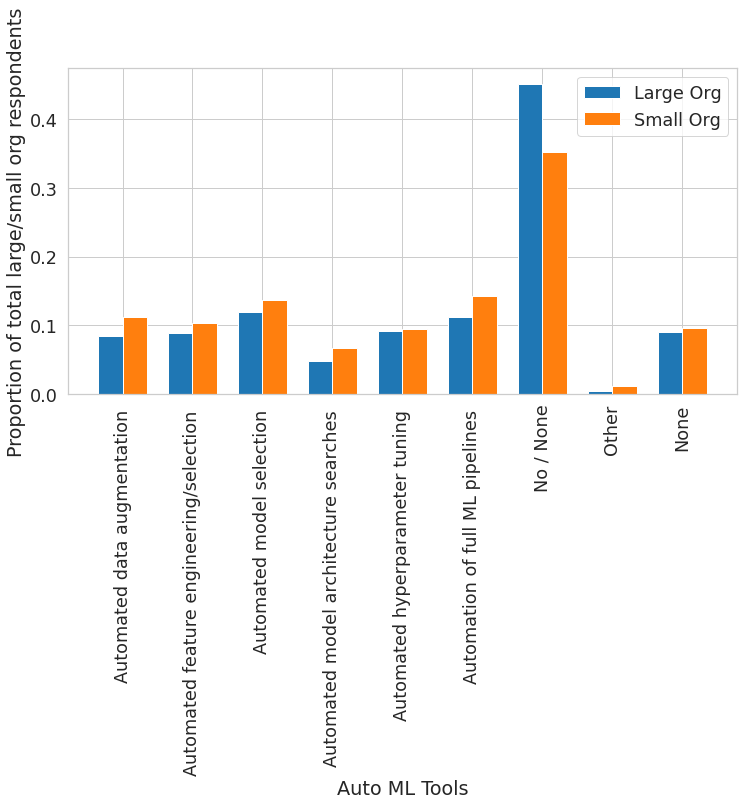

In [173]:
large_org_automl = aggregate_one_hot(large_org, 'Q33')
small_org_automl = aggregate_one_hot(small_org, 'Q33')

automl_df = pd.concat([large_org_automl.to_frame('Large Org'), small_org_automl.to_frame('Small Org')], axis=1)

labels = automl_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, automl_df['Large Org'].values, width, label='Large Org')
rects2 = ax.bar(x + width/2, automl_df['Small Org'].values, width, label='Small Org')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Auto ML Tools')
_ = plt.ylabel('Proportion of total large/small org respondents')

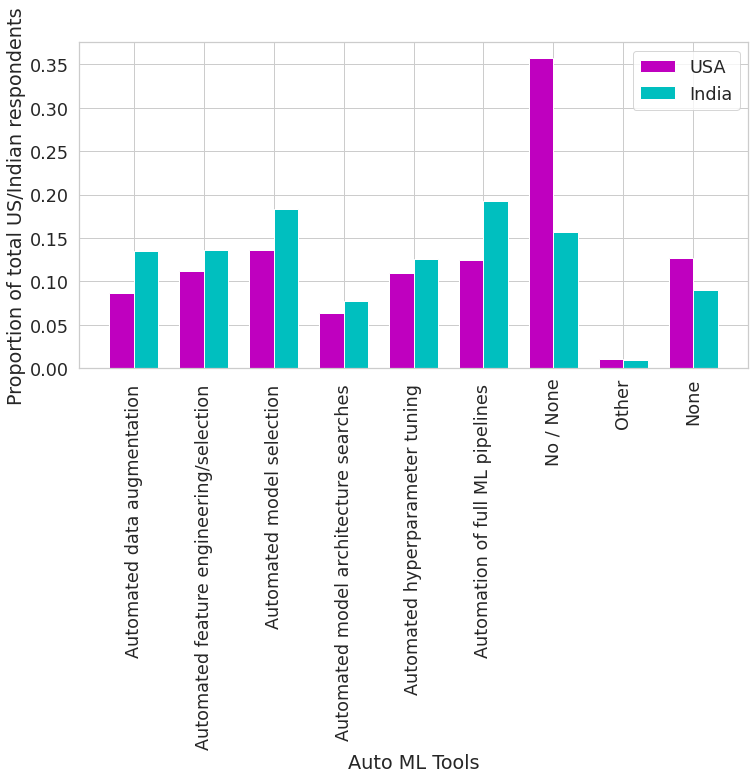

In [103]:
usa_automl = aggregate_one_hot(usa, 'Q33')
india_automl = aggregate_one_hot(india, 'Q33')

automl_df = pd.concat([usa_automl.to_frame('USA'), india_automl.to_frame('India')], axis=1)

labels = automl_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, automl_df['USA'].values, width, label='USA', color='m')
rects2 = ax.bar(x + width/2, automl_df['India'].values, width, label='India', color='c')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Auto ML Tools')
_ = plt.ylabel('Proportion of total US/Indian respondents')

# Platforms to deploy personal projects (Q36) 

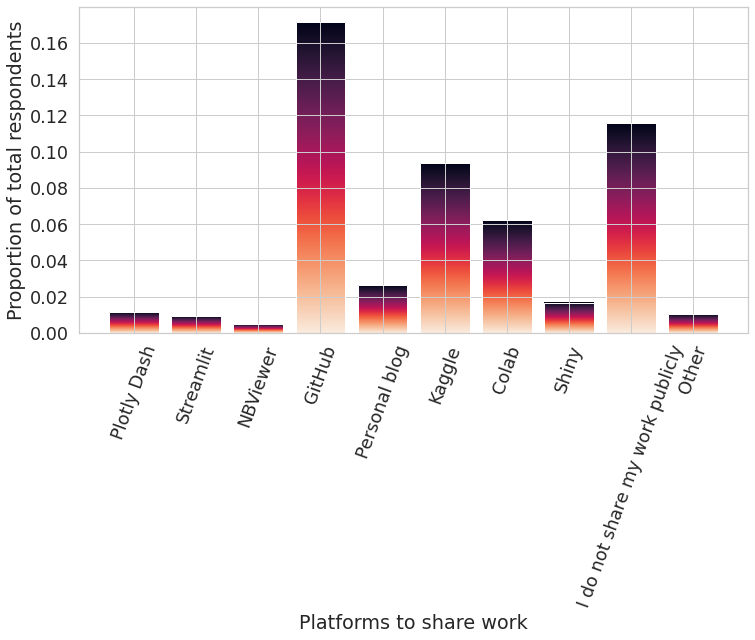

In [63]:
platforms = aggregate_one_hot(df, 'Q36')

fig=plt.figure(figsize=(12,6))
bar = plt.bar(platforms.index, platforms.values)
gradientbars(bar)
_ = plt.xticks(rotation=70)
_ = plt.xlabel('Platforms to share work')
_ = plt.ylabel('Proportion of total respondents')

# Educational platforms (Q37)

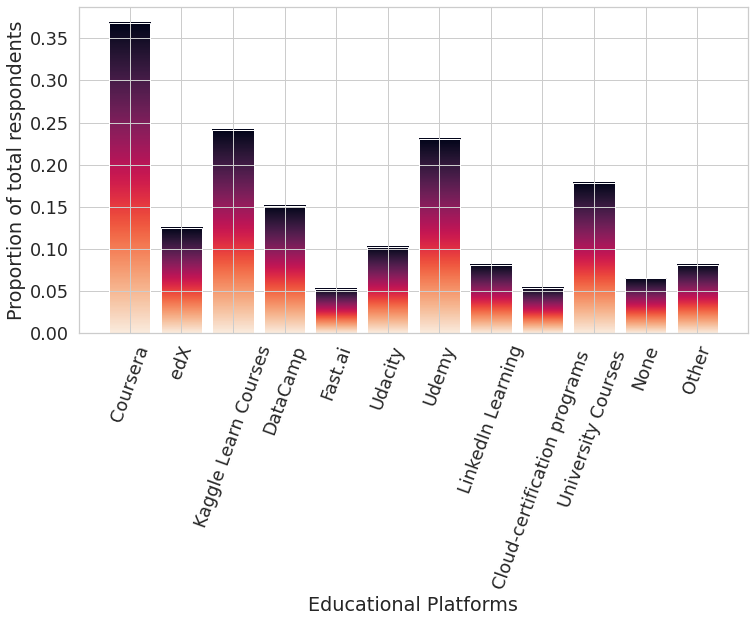

In [64]:
educ_plat = aggregate_one_hot(df, 'Q37')


fig=plt.figure(figsize=(12,6))
bar = plt.bar(educ_plat.index, educ_plat.values)
gradientbars(bar)
_ = plt.xticks(rotation=70)
_ = plt.xlabel('Educational Platforms')
_ = plt.ylabel('Proportion of total respondents')

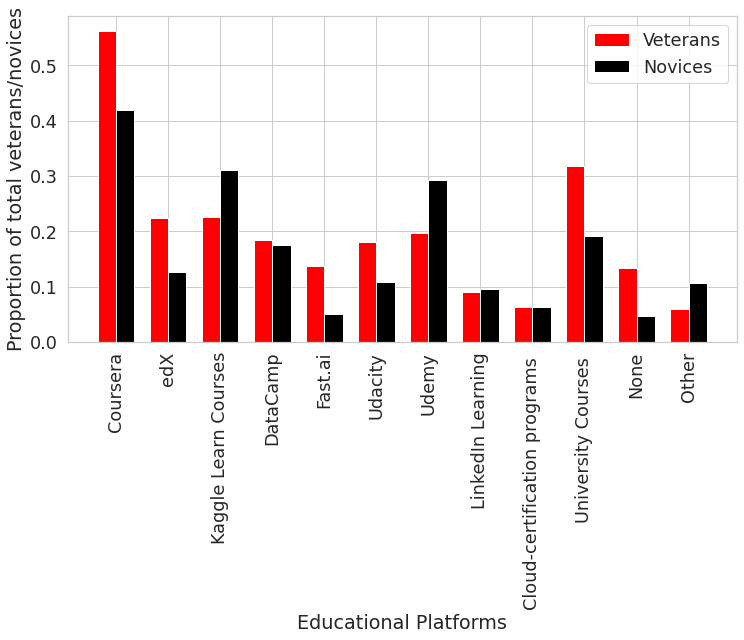

In [104]:
ML_veterans_educ = aggregate_one_hot(ML_veterans, 'Q37')
ML_novices_educ = aggregate_one_hot(ML_novices, 'Q37')

educ_df = pd.concat([ML_veterans_educ.to_frame('Veterans'), ML_novices_educ.to_frame('Novices')], axis=1)

labels = educ_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, educ_df['Veterans'].values, width, label='Veterans', color='r')
rects2 = ax.bar(x + width/2, educ_df['Novices'].values, width, label='Novices', color='k')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Educational Platforms')
_ = plt.ylabel('Proportion of total veterans/novices')

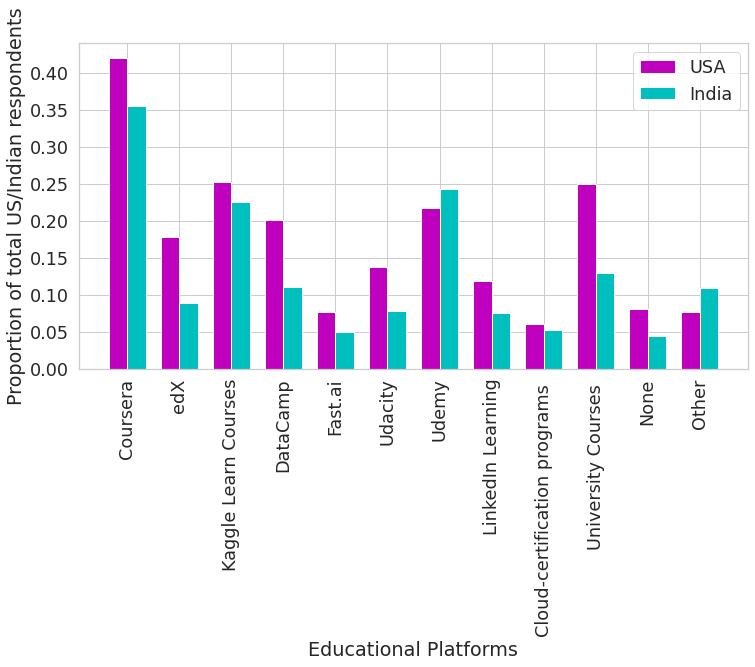

In [105]:
usa_educ = aggregate_one_hot(usa, 'Q37')
india_educ = aggregate_one_hot(india, 'Q37')

educ_df = pd.concat([usa_educ.to_frame('USA'), india_educ.to_frame('India')], axis=1)

labels = educ_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, educ_df['USA'].values, width, label='USA', color='m')
rects2 = ax.bar(x + width/2, educ_df['India'].values, width, label='India', color='c')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Educational Platforms')
_ = plt.ylabel('Proportion of total US/Indian respondents')

# Data analysis tools (Q38)

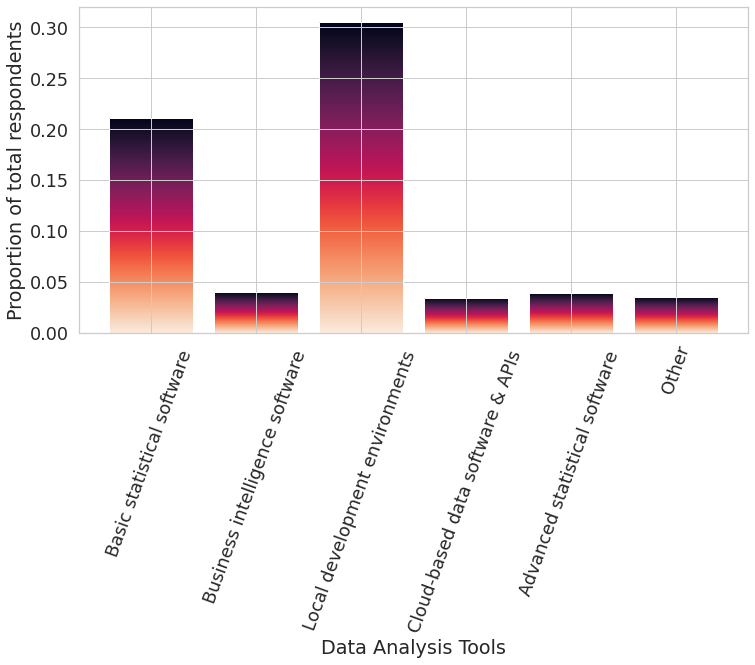

In [65]:
data_analysis = aggregate_one_hot(df, 'Q38')


fig=plt.figure(figsize=(12,6))
bar = plt.bar(data_analysis.index, data_analysis.values)
gradientbars(bar)
_ = plt.xticks(rotation=70)
_ = plt.xlabel('Data Analysis Tools')
_ = plt.ylabel('Proportion of total respondents')

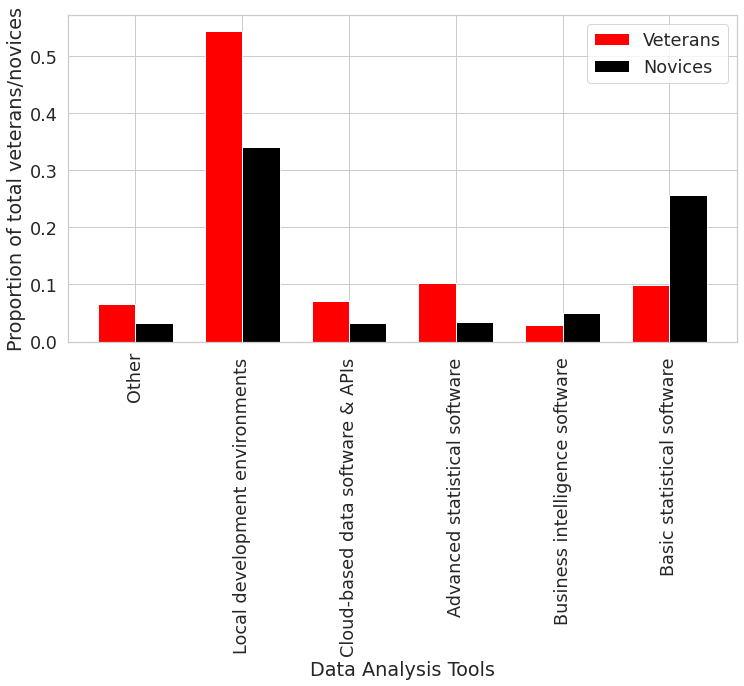

In [106]:
ML_veterans_data_analysis = aggregate_one_hot(ML_veterans, 'Q38')
ML_novices_data_analysis = aggregate_one_hot(ML_novices, 'Q38')

data_analysis_df = pd.concat([ML_veterans_data_analysis.to_frame('Veterans'), ML_novices_data_analysis.to_frame('Novices')], axis=1)

labels = data_analysis_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, data_analysis_df['Veterans'].values, width, label='Veterans', color='r')
rects2 = ax.bar(x + width/2, data_analysis_df['Novices'].values, width, label='Novices', color='k')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Data Analysis Tools')
_ = plt.ylabel('Proportion of total veterans/novices')

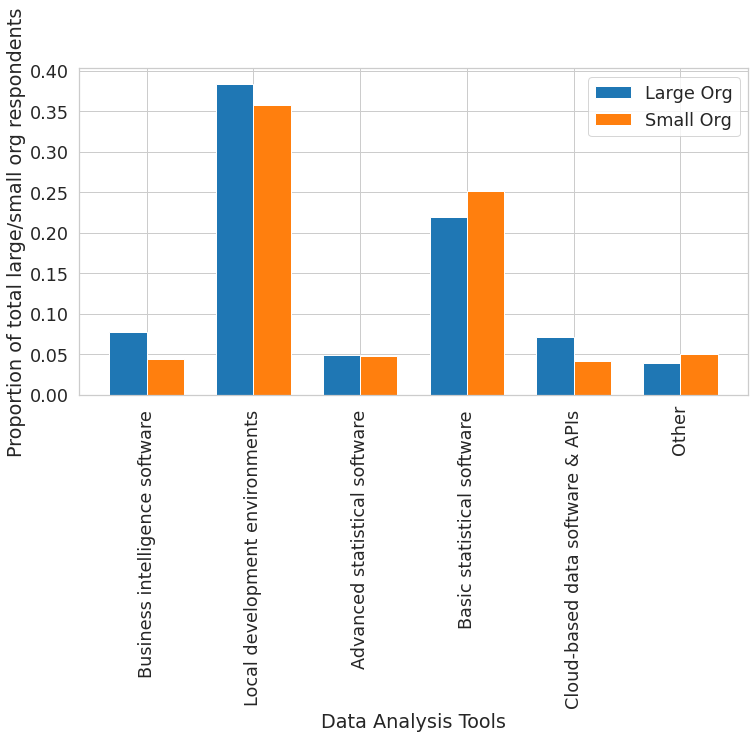

In [176]:
large_org_data_analysis = aggregate_one_hot(large_org, 'Q38')
small_org_data_analysis = aggregate_one_hot(small_org, 'Q38')

data_analysis_df = pd.concat([large_org_data_analysis.to_frame('Large Org'), small_org_data_analysis.to_frame('Small Org')], axis=1)

labels = data_analysis_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, data_analysis_df['Large Org'].values, width, label='Large Org')
rects2 = ax.bar(x + width/2, data_analysis_df['Small Org'].values, width, label='Small Org')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Data Analysis Tools')
_ = plt.ylabel('Proportion of total large/small org respondents')

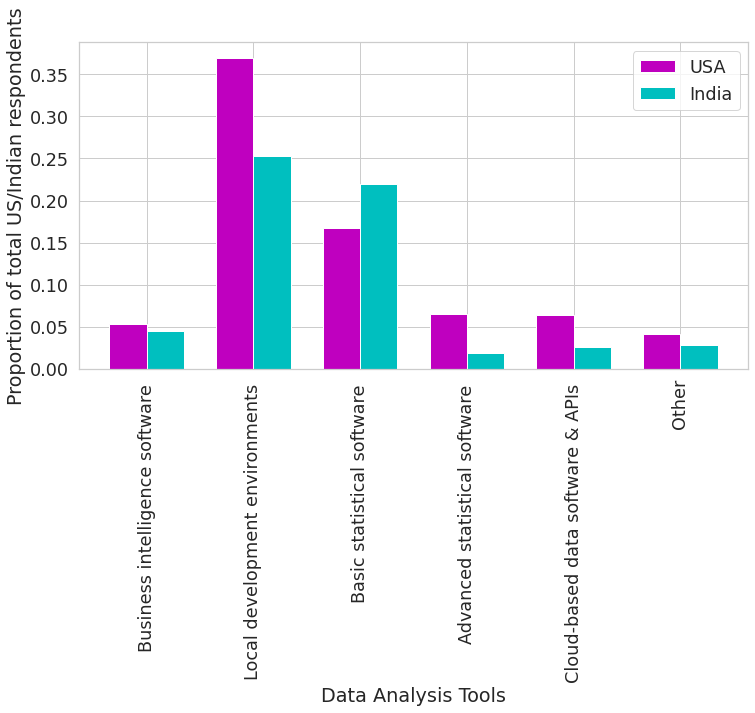

In [107]:
usa_data_analysis = aggregate_one_hot(usa, 'Q38')
india_data_analysis = aggregate_one_hot(india, 'Q38')

data_analysis_df = pd.concat([usa_data_analysis.to_frame('USA'), india_data_analysis.to_frame('India')], axis=1)

labels = data_analysis_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, data_analysis_df['USA'].values, width, label='USA', color='m')
rects2 = ax.bar(x + width/2, data_analysis_df['India'].values, width, label='India', color='c')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Data Analysis Tools')
_ = plt.ylabel('Proportion of total US/Indian respondents')

# Media (data science informational platforms) (Q39)

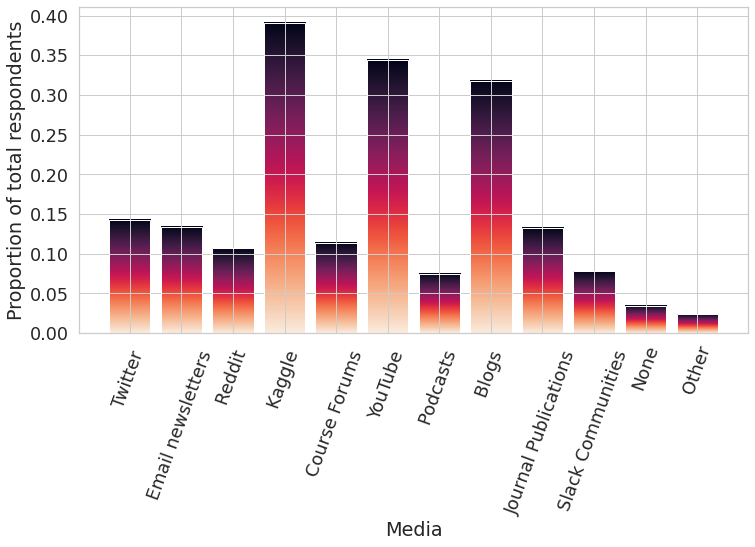

In [66]:
media = aggregate_one_hot(df, 'Q39')

fig=plt.figure(figsize=(12,6))
bar = plt.bar(media.index, media.values)
gradientbars(bar)
_ = plt.xticks(rotation=70)
_ = plt.xlabel('Media')
_ = plt.ylabel('Proportion of total respondents')

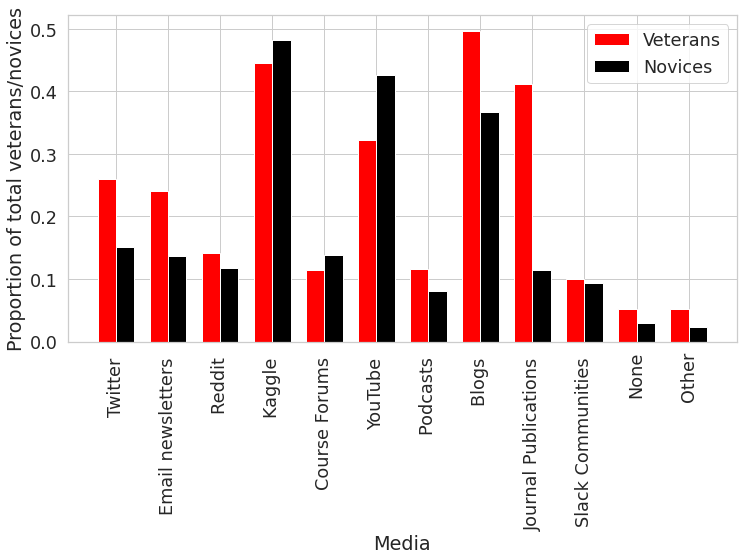

In [108]:
ML_veterans_media = aggregate_one_hot(ML_veterans, 'Q39')
ML_novices_media = aggregate_one_hot(ML_novices, 'Q39')

media_df = pd.concat([ML_veterans_media.to_frame('Veterans'), ML_novices_media.to_frame('Novices')], axis=1)

labels = media_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, media_df['Veterans'].values, width, label='Veterans', color='r')
rects2 = ax.bar(x + width/2, media_df['Novices'].values, width, label='Novices', color='k')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Media')
_ = plt.ylabel('Proportion of total veterans/novices')

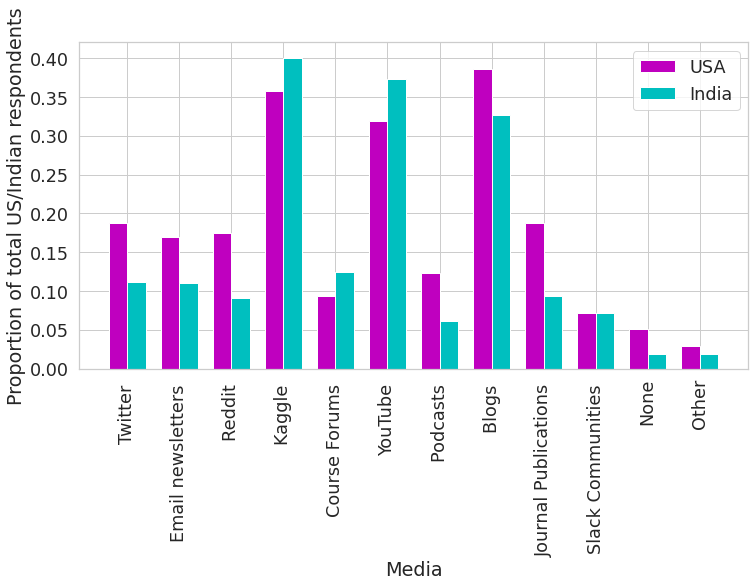

In [109]:
usa_media = aggregate_one_hot(usa, 'Q39')
india_media = aggregate_one_hot(india, 'Q39')

media_df = pd.concat([usa_media.to_frame('USA'), india_media.to_frame('India')], axis=1)

labels = media_df.index
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.bar(x - width/2, media_df['USA'].values, width, label='USA', color='m')
rects2 = ax.bar(x + width/2, media_df['India'].values, width, label='India', color='c')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=90)
_ = ax.legend()
_ = plt.xlabel('Media')
_ = plt.ylabel('Proportion of total US/Indian respondents')